You work for a large corporation that owns a collection of restaurants of different types. Currently it is evaluating the location, type, and characteristics (cuisine, price point, design, marketing strategy) and positioning of a new restaurant in PICK YOUR CITY (if you know the local habits, you can give better insight). 

Your task is to analyse the dataset and give recommendations on strategy, based on the reviews, location (either neighbourhood or zipcode level) and competition. Also estimates on volumes and revenues of the potential undertaking. You may have to check out what the Price-Range attributes signify by visiting the Yelp website. 

Submit a report with an Exec Summary, Details of your analysis and reasoning and recommendation. Submit your code alongside. 
You are free to use any language, scripts, code or software on the web but the analysis and report has to be yours.


In [143]:
import re,json,ftfy,nltk,pycountry,random,seaborn
import numpy as np
import pandas as pd
import collections as cllt
import sklearn as sk
import matplotlib.pyplot as plt

from nltk import word_tokenize
from os import path
from glob import glob
from scipy.misc import imread
from textblob import TextBlob
from wordcloud import WordCloud
from IPython.display import display, HTML
from sklearn.decomposition import NMF
from sklearn.feature_extraction.text import TfidfVectorizer
%matplotlib inline

### 1.0 Data Cleansing

In [304]:
business = pd.read_csv("edinburgh.csv",header=0)
checkin = pd.read_csv("edinCheckin.csv",header=0)
review = pd.read_csv("edinReview.csv",header=0)
tip = pd.read_csv("edinTip.csv",header=0)
user = pd.read_csv("edinUser.csv",header=0,usecols=range(0,23))

In [187]:
checkin.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3272 entries, 0 to 3271
Columns: 170 entries, business_id to type
dtypes: float64(168), object(2)
memory usage: 4.2+ MB


In [188]:
user.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4505 entries, 0 to 4504
Data columns (total 23 columns):
user_id                4504 non-null object
average_stars          4504 non-null object
compliments_cool       2118 non-null object
compliments_cute       532 non-null object
compliments_funny      1393 non-null object
compliments_hot        1586 non-null object
compliments_list       376 non-null object
compliments_more       1174 non-null object
compliments_note       1716 non-null object
compliments_photos     965 non-null object
compliments_plain      1894 non-null float64
compliments_profile    705 non-null float64
compliments_writer     1904 non-null object
elite                  4504 non-null object
fans                   4504 non-null object
friends                4504 non-null object
name                   4496 non-null object
review_count           4496 non-null object
type                   4496 non-null object
votes_cool             4496 non-null object
votes_funny    

In [189]:
tip.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6337 entries, 0 to 6336
Data columns (total 6 columns):
business_id    6337 non-null object
date           4596 non-null object
likes          4596 non-null float64
text           4596 non-null object
type           4596 non-null object
user_id        4596 non-null object
dtypes: float64(1), object(5)
memory usage: 297.1+ KB


In [190]:
business.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3272 entries, 0 to 3271
Data columns (total 56 columns):
attributes_Accepts Credit Cards         2305 non-null object
attributes_Accepts Insurance            8 non-null object
attributes_Ages Allowed                 18 non-null object
attributes_Alcohol                      1175 non-null object
attributes_Ambience                     891 non-null object
attributes_Attire                       1014 non-null object
attributes_BYOB                         0 non-null float64
attributes_BYOB/Corkage                 1 non-null object
attributes_By Appointment Only          146 non-null object
attributes_Caters                       383 non-null object
attributes_Coat Check                   379 non-null object
attributes_Corkage                      0 non-null float64
attributes_Delivery                     936 non-null object
attributes_Dietary Restrictions         60 non-null object
attributes_Dogs Allowed                 179 non-null objec

In [305]:
review.info()
# Replace nan with blank space
review=review.replace(np.nan,' ', regex=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28342 entries, 0 to 28341
Data columns (total 10 columns):
business_id     28342 non-null object
date            28196 non-null object
review_id       28196 non-null object
stars           28196 non-null float64
text            28196 non-null object
type            28196 non-null object
user_id         28196 non-null object
votes_cool      28196 non-null float64
votes_funny     28196 non-null float64
votes_useful    28196 non-null float64
dtypes: float64(4), object(6)
memory usage: 2.2+ MB


Clean up raw text in review dataset

In [306]:
review.head(30)

,business_id,date,review_id,stars,text,type,user_id,votes_cool,votes_funny,votes_useful
0,W3THJEcoHZZKgdJJdiFIWw,12/03/2011,NTMbAREsqVF_QQcAf0aJBw,4,This is a good fishmonger in the heart of the ...,review,OH7IB5YVhs41H7x4dHpuNg,1,0,1
1,aFVO6hoFlOCN8pKsmJbWjw,14/11/2009,jnsG2mFZlgdU4tPXFOnsNA,4,I had a pretty good experience at the Doric. ...,review,o9t7nO4hUiP88FQ_WEvdOw,1,0,0
2,aFVO6hoFlOCN8pKsmJbWjw,02/05/2010,dj6XxV1N2AAbifYXhfkUtQ,2,Whenever the train I'm meant to be getting in ...,review,#NAME?,0,0,0
3,aFVO6hoFlOCN8pKsmJbWjw,12/05/2010,TzqdPoa7Y5Fek6MOMdaV2w,3,"The Doric is apparently ""Edinburgh's oldest ga...",review,pAZYqb6OuPjlHF7AeGy6uQ,0,0,0
4,aFVO6hoFlOCN8pKsmJbWjw,14/05/2010,hLitjpBEbYf7eOKCs33GGA,3,My dad is obsessed with his Good Food Guides a...,review,OTQ68fm6EtcPD2n0g6Y2mQ,0,0,0
5,aFVO6hoFlOCN8pKsmJbWjw,02/04/2012,AO-2QkLw9hxZ-O1YX25bSg,3,For the start of a friend's Stag Event in Edin...,review,YwwdbliJQkau_USNEHC3Mg,1,0,1
6,aFVO6hoFlOCN8pKsmJbWjw,23/06/2012,gHlPuGfQtaWWSuQcBLcsfw,3,The Doric markets itself as Edinburgh's oldest...,review,UaA5yKEoaA_hFMLGDhQ1wQ,1,0,1
7,aFVO6hoFlOCN8pKsmJbWjw,28/05/2013,SUBJg8DQQYMFxoKQUhHIEA,3,This is a good alternative to the fast food/sn...,review,B0h78A1dkJL9BtXulclAIA,1,0,2
8,aFVO6hoFlOCN8pKsmJbWjw,16/04/2014,ntwlcfOiuyRelK9Rz3Ovjw,5,Amazing Sunday Roast dinner!\r\r\r\rI saw The ...,review,MvStP5gVKXp6kPR2KZ3x1Q,0,0,1
9,aFVO6hoFlOCN8pKsmJbWjw,24/07/2014,g8sb2cVggrUWbgFXaHU2gQ,5,The original building was constructed in the 1...,review,w6IyjQw_UkElNu4J0qT3GQ,1,0,0


In [309]:
# Referenced Regular Expression for email cleanup idea: 
def cleanup(text):

    # Make text lower case
    for f in re.findall("([A-Z]+)", text):
        text = text.replace(f, f.lower())
    
    # remove blackslash symbols
    text = text.replace('\r', " ")
    
    # remove all non-ascii characters in the string
    text=unicode(text, 'ascii', 'ignore')

    #Creata a list of reg tools
    cleanuptools = [
    #Dates
    r"(monday|tuesday|wednesday|thursday|friday|saturday|sunday)",
    # Removing months
    r"january|february|march|april|may|june|july|august|september|october|november|december",
    # Punctuation and numbers to be removed
    r'[-|.|?|!|,|"|:|;|()|0-9]',
    ]
    
    for tool in cleanuptools:
        text = re.sub(tool," ", text)
    return text

# Constructing a list for stopwords 
stopwords = []
# Add scikit-learn's CountVectorizer's stop list to the created list
stopwords = sk.feature_extraction.text.ENGLISH_STOP_WORDS

In [310]:
review.text=review.text.apply(cleanup)

In [311]:
review.text[28]

u"this used to be the closest pub to my old flat  so we would often pop over for some afternoon relief  its your standard pub  nothing out of the ordinary here folks  the prices are quite good  at one stage they did a   p glass of wine  although with ever changing licensing laws  that probably doesn't happen anymore  i used to get a kopperburg for      which was pretty reasonable for edinburgh     this pub is located just along from edinburgh bus station  so its a good stop off if you have time to kill before you hop on a bus  just a relaxed pub which is good for a quick after work drink or a catch up with a friend "

### Inspection of review contents 

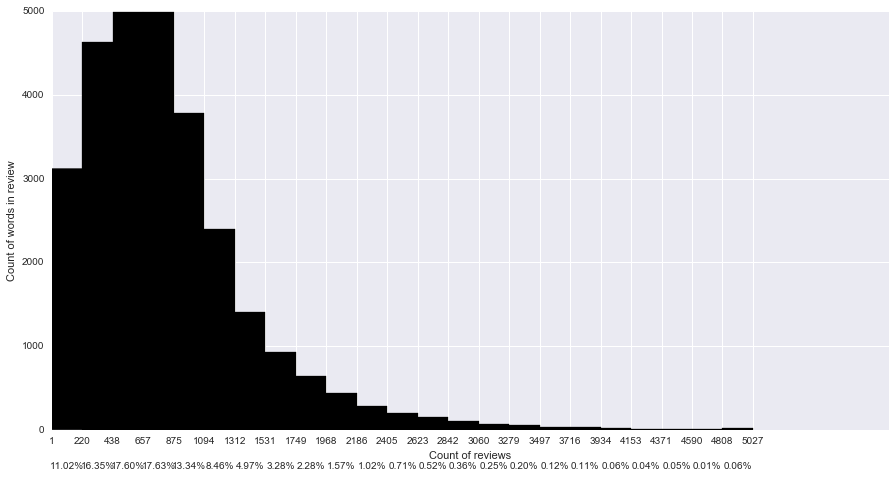

In [312]:
f, ax = plt.subplots(figsize=(15,7.5))
n, bins, patches = ax.hist(review.text.apply(len),facecolor='black',bins=23)
ax.set_xticks(bins)
bin_centers = 0.5 * np.diff(bins) + bins[:-1]
for count, x in zip(n, bin_centers):
    percent = '{:.2f}%'.format((float(count) / n.sum())*100)
    ax.annotate(percent, xy=(x, 0), xycoords=('data', 'axes fraction'),
    xytext=(0, -32), textcoords='offset points', va='top', ha='center')
ax.set_xlabel('Count of reviews')
ax.set_ylabel('Count of words in review')

In [313]:
review.text[28]

u"this used to be the closest pub to my old flat  so we would often pop over for some afternoon relief  its your standard pub  nothing out of the ordinary here folks  the prices are quite good  at one stage they did a   p glass of wine  although with ever changing licensing laws  that probably doesn't happen anymore  i used to get a kopperburg for      which was pretty reasonable for edinburgh     this pub is located just along from edinburgh bus station  so its a good stop off if you have time to kill before you hop on a bus  just a relaxed pub which is good for a quick after work drink or a catch up with a friend "

### Topic Modelling

In [322]:
# Split the dataset into five categories: 1,2,3,4 and 5 stars

review_1_star = review[(review.stars == 1)]
review_2_star = review[(review.stars == 2)]
review_3_star = review[(review.stars == 3)]
review_4_star = review[(review.stars == 4)]
review_5_star = review[(review.stars == 5)]

review_5_star.head()

,business_id,date,review_id,stars,text,type,user_id,votes_cool,votes_funny,votes_useful
8,aFVO6hoFlOCN8pKsmJbWjw,16/04/2014,ntwlcfOiuyRelK9Rz3Ovjw,5,amazing roast dinner i saw the doric lis...,review,MvStP5gVKXp6kPR2KZ3x1Q,0,0,1
9,aFVO6hoFlOCN8pKsmJbWjw,24/07/2014,g8sb2cVggrUWbgFXaHU2gQ,5,the original building was constructed in the ...,review,w6IyjQw_UkElNu4J0qT3GQ,1,0,0
15,aFVO6hoFlOCN8pKsmJbWjw,22/06/2015,KAkF7pDSmpjzwoUkWLM5XA,5,excellent shepherds pie the downstairs pub a...,review,-LUDwqL2O-r1D1d91G6RSw,0,0,1
16,aFVO6hoFlOCN8pKsmJbWjw,28/06/2015,fq17ZUSmmSWpcNtQTxw5_g,5,amazing atmosphere amazing food amazing live...,review,1z9VlIyHnGob-LGBiGhi9g,1,0,1
17,aFVO6hoFlOCN8pKsmJbWjw,06/08/2015,51kA5ZSyq9BAikP0-0BEyg,5,while traveling through edinburgh on our honey...,review,A7NogscbA9dxy7vUwFMiCQ,2,0,1



The raw data is a sequence of symbols that cannot be fed directly to the algorithms themselves as most of them expect numerical feature vectors with a fixed size rather than the raw text documents with variable length. Therefore, the python package scikit-learn was used to extract numerical features from text content, namely [1]-[4]:

* **tokenizing** strings and giving an integer id for each possible token, for instance by using white-spaces and punctuation as token separators.

* **counting** the occurrences of tokens in each document.

* **normalizing** and weighting with diminishing importance tokens that occur in the majority of samples / documents.

Vectorization is a process combining tokenization, counting and normalization, which turns a collection of text documents into numerical feature vectors.  

Also, in a large text corpus, some words will be very present (e.g. “the”, “a”, “is” in English) hence carrying very little meaningful information about the actual contents of the document. If we were to feed the direct count data directly to a classifier those very frequent terms would shadow the frequencies of rarer yet more interesting terms. In order to re-weight the count features into floating point values suitable for usage by a classifier I apply TF-IDF term re-weighting functions before applying NMF to reduce the influence of terms appearing frequently across the entire corpus. TfidfVectorizer function combines the functions of TF-IDF and vectorization allowing to build a document-term matrix A for the corpus of documents:

In [326]:
#Vectorization
tfidfvectorizer_1 = TfidfVectorizer(max_features=15000, ngram_range=(1, 2), stop_words = stopwords,
                                 strip_accents="unicode", use_idf=True, norm="l2", min_df = 5)
tfidfvectorizer_2 = TfidfVectorizer(max_features=15000, ngram_range=(1, 2), stop_words = stopwords,
                                 strip_accents="unicode", use_idf=True, norm="l2", min_df = 5)
tfidfvectorizer_3 = TfidfVectorizer(max_features=15000, ngram_range=(1, 2), stop_words = stopwords,
                                 strip_accents="unicode", use_idf=True, norm="l2", min_df = 5)
tfidfvectorizer_4 = TfidfVectorizer(max_features=15000, ngram_range=(1, 2), stop_words = stopwords,
                                 strip_accents="unicode", use_idf=True, norm="l2", min_df = 5)
tfidfvectorizer_5 = TfidfVectorizer(max_features=15000, ngram_range=(1, 2), stop_words = stopwords,
                                 strip_accents="unicode", use_idf=True, norm="l2", min_df = 5)


#Create term document matrix for separate datasets
term_document_matrix_1 = tfidfvectorizer_1.fit_transform(review_1_star.text)
term_document_matrix_2 = tfidfvectorizer_2.fit_transform(review_2_star.text)
term_document_matrix_3 = tfidfvectorizer_3.fit_transform(review_3_star.text)
term_document_matrix_4 = tfidfvectorizer_4.fit_transform(review_4_star.text)
term_document_matrix_5 = tfidfvectorizer_5.fit_transform(review_5_star.text)

NMF then takes the term document matrix as an input, and factorizes it into two smaller non-negative matrices W and H, each having k dimensions. When multiplied together, these factors approximate the original matrix A. The key user-specified parameter k controls the number of topics that will be produced. The rows of the matrix W provides weights for the input documents relative to the k topics – these values indicate the strength of association between documents and topics. The columns of the matrix W provide weights for the terms relative to the topics. By ordering the values in a given column and selecting the top-ranked terms, we can produce a description of the corresponding topic. It is important to remember that each document can be associated with multiple topics, which will often be the case in many document collections (e.g. a single news article might be related to both “technology” and “business” topics).

At this stage we apply the scikit-learn implementation of NMF with NNDSVD initialization. Nonnegative Double Singular Value Decomposition (NNDSVD) is typically used for overcoming sparseness of data [8]. Here I set the number of topics to be equal to 20 and run NMF for 200 iterations, and then get the factors W and H from the resulting model:

In [327]:
# 1-star review
nmfmodel_1 = sk.decomposition.NMF(init="nndsvd", n_components=20, max_iter=200).fit(term_document_matrix_1)
W_1 = nmfmodel_1.fit_transform(term_document_matrix_1);
H_1 = nmfmodel_1.components_
# W (number of emails,number of topics) and H (number of topics, number of features)
print "Generated factor W of size %s and factor H of size %s for 1-star dataset" % ( str(W_1.shape), str(H_1.shape) )

# 2-star review
nmfmodel_2 = sk.decomposition.NMF(init="nndsvd", n_components=20, max_iter=200).fit(term_document_matrix_2)
W_2 = nmfmodel_2.fit_transform(term_document_matrix_2);
H_2 = nmfmodel_2.components_
# W (number of emails,number of topics) and H (number of topics, number of features)
print "Generated factor W of size %s and factor H of size %s for 2-star dataset" % ( str(W_2.shape), str(H_2.shape) )

# 3-star review
nmfmodel_3 = sk.decomposition.NMF(init="nndsvd", n_components=20, max_iter=200).fit(term_document_matrix_3)
W_3 = nmfmodel_3.fit_transform(term_document_matrix_3);
H_3 = nmfmodel_3.components_
# W (number of emails,number of topics) and H (number of topics, number of features)
print "Generated factor W of size %s and factor H of size %s for 3-star dataset" % ( str(W_3.shape), str(H_3.shape) )

# 4-star review
nmfmodel_4 = sk.decomposition.NMF(init="nndsvd", n_components=20, max_iter=200).fit(term_document_matrix_4)
W_4 = nmfmodel_4.fit_transform(term_document_matrix_4);
H_4 = nmfmodel_4.components_
# W (number of emails,number of topics) and H (number of topics, number of features)
print "Generated factor W of size %s and factor H of size %s for 4-star dataset" % ( str(W_4.shape), str(H_4.shape) )

# 5-star review
nmfmodel_5 = sk.decomposition.NMF(init="nndsvd", n_components=20, max_iter=200).fit(term_document_matrix_5)
W_5 = nmfmodel_5.fit_transform(term_document_matrix_5);
H_5 = nmfmodel_5.components_
# W (number of emails,number of topics) and H (number of topics, number of features)
print "Generated factor W of size %s and factor H of size %s for 5-star dataset" % ( str(W_5.shape), str(H_5.shape) )


Generated factor W of size (967, 20) and factor H of size (20, 2366) for 1-star dataset
Generated factor W of size (1904, 20) and factor H of size (20, 4792) for 2-star dataset
Generated factor W of size (5563, 20) and factor H of size (20, 13169) for 3-star dataset
Generated factor W of size (11642, 20) and factor H of size (20, 15000) for 4-star dataset
Generated factor W of size (8120, 20) and factor H of size (20, 15000) for 5-star dataset


In [336]:
# Create a colour series for graph plotting
def grey_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "hsl(0, 0%%, %d%%)" % random.randint(60, 100)

# Writting functions to show top words in each topic
def TopTermsByTopic(nmfmodel, features, top):
    for index, topic in enumerate(nmfmodel.components_):
        print "\n Topic {}: \n".format(index+1)
        top_words = [features[i] for i in nmfmodel.components_[index].argsort()[::-1][:top]]
        topic_words = ' '.join(top_words)
        print topic_words

        #Prepare data for horizontal bar charts
        top15_index = nmfmodel.components_[index].argsort()[::-1][:15]
        top15_topic = sorted(topic[top15_index],reverse=False)

        #Prepare data for wordclouds
        wc = WordCloud(max_font_size=80,relative_scaling=.5,width=800,height=500).generate(topic_words)
       
        #Create a space for graphs
        fig, ax = plt.subplots(2,figsize=(12,10))
        rect1 = ax[0].barh(.5 + np.arange(15) + .5, top15_topic, color="black", align="center")
        rect2 = ax[1].imshow(wc.recolor(color_func=grey_color_func, random_state=3))
        
        #Subplot 1 - Horizontal Bar Chart
        ax[0].set_title("Top 15 Terms in Topic {}".format(index + 1))
        ax[0].set_xlabel("Weight")
        ax[0].set_yticks(.5 + np.arange(15)+ .5)
        ax[0].set_yticklabels([features[i] for i in topic.argsort()[::-1][:15]])
        ax[0].grid(True)
        
        #Subplot 2 - WordCloud
        ax[1].axis("off")
        ax[1].set_title("Wordcloud of Topic {}".format(index + 1))
        
        #Show the graphs
        plt.tight_layout()
        plt.show()
        

# Function to analyse percentage of topics in each email
def TopicDistribution(review, matrix_W, index):
    rawtext = review.text.ix[index]
    topics = matrix_W[index,:]
    row_sum = np.sum(topics, axis=0)
    percentage = []
    for topic in topics:
        percentage.append(topic / float(row_sum))
    print rawtext
    plt.bar(range(len(percentage)), percentage, color='black')
    plt.xlabel('Topic Number')
    plt.xticks(range(1,len(percentage)))
    plt.ylabel('Percentage')
    plt.show()

In [329]:
#Extracting the feature names
features_1= tfidfvectorizer_1.get_feature_names()
features_2= tfidfvectorizer_2.get_feature_names()
features_3= tfidfvectorizer_3.get_feature_names()
features_4= tfidfvectorizer_4.get_feature_names()
features_5= tfidfvectorizer_5.get_feature_names()


 Topic 1: 

table restaurant waiter waitress wine menu ask served arrived asked wanted main kitchen experience waiters gluten starter pm tables right dishes water meal salad soup bottle courses know decided ordering serving service bread glass got table dining eating ordered breakfast starters walked came visit dinner seated gluten free lunch available salmon dessert did eggs tea party sat bowl options voucher leave nice cheese come bigger manager felt number chef ages price turned appeared instead like finished course sure friend free point looked despite quite passed main courses given bartenders cooked arrive bothered told glass wine pudding second evening finally menus expect standing appalling just


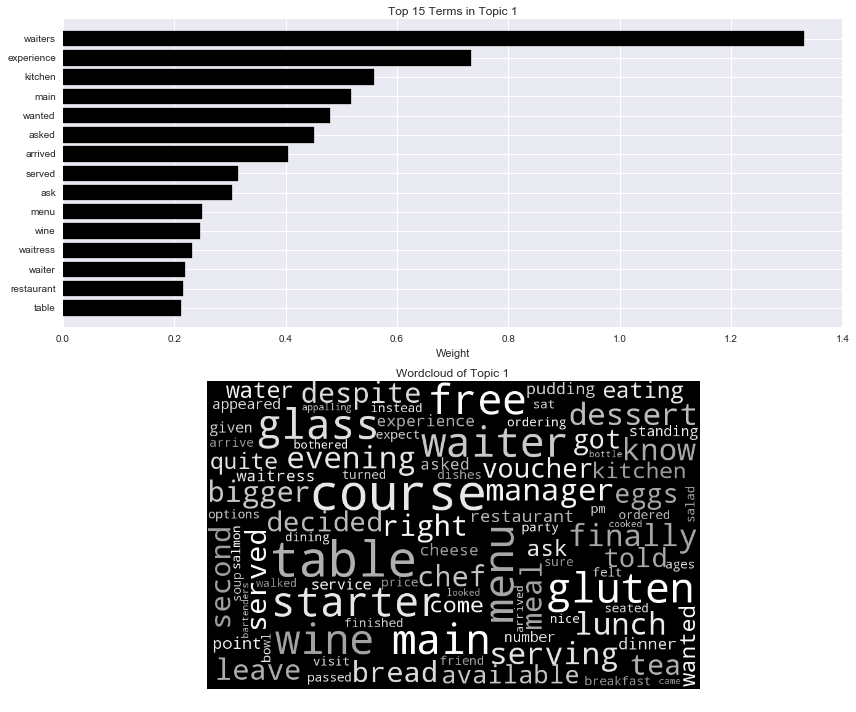


 Topic 2: 

car rental price office new trade charged line wash day bought cost miles rented experience driving damage buying hand consider park rent sales used hour replacement contact hours caused issue wasted offered time worst free hit paid called covered second took sorry ago spoke online wouldn promised went cleaned company year watch missing needed return blow road door year ago manager total beware told items helpful process got attempted wrong charge showed la rushed work home trust customers coming morning suppose getting lady picking luckily charges body noticed value provided hours later sell handle unable hire performance refuse moved need dire avoid


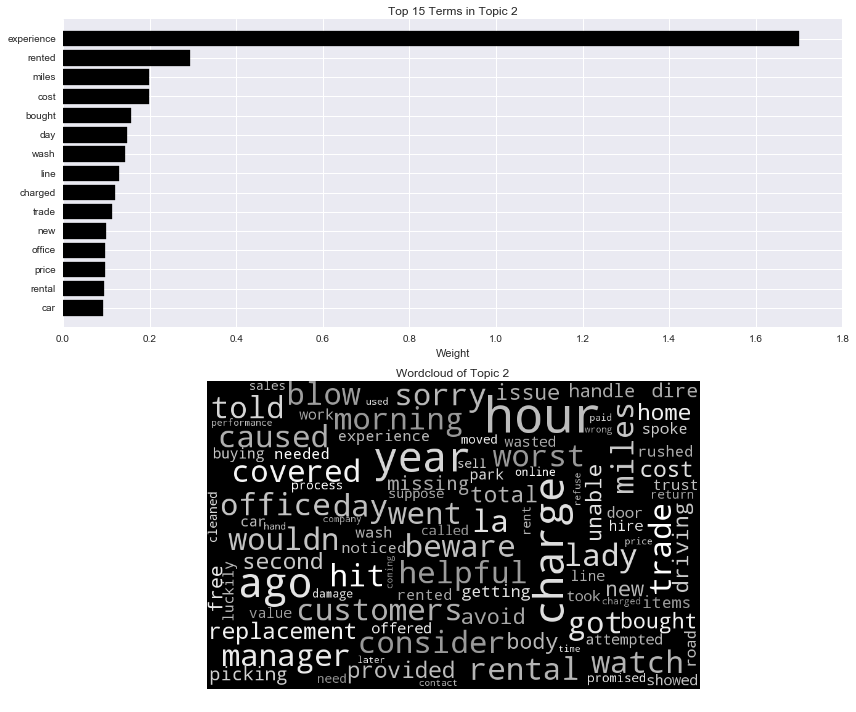


 Topic 3: 

place really night people don just like think ve music cheap club drinks want edinburgh avoid old ll city looking say time awful girls drunk pretty make good know fact drink venue better way place just going dance floor door years cheesy expensive places actually year absolutely school walk fun student queue having worst definitely worth far thing look probably got trying reason times quite clubs generally home dont review hell come friends idea past vodka bars lost oh party dance floor mind words big bit great nights new stuff centre sound spend street soul world yes free sticky toilets george little


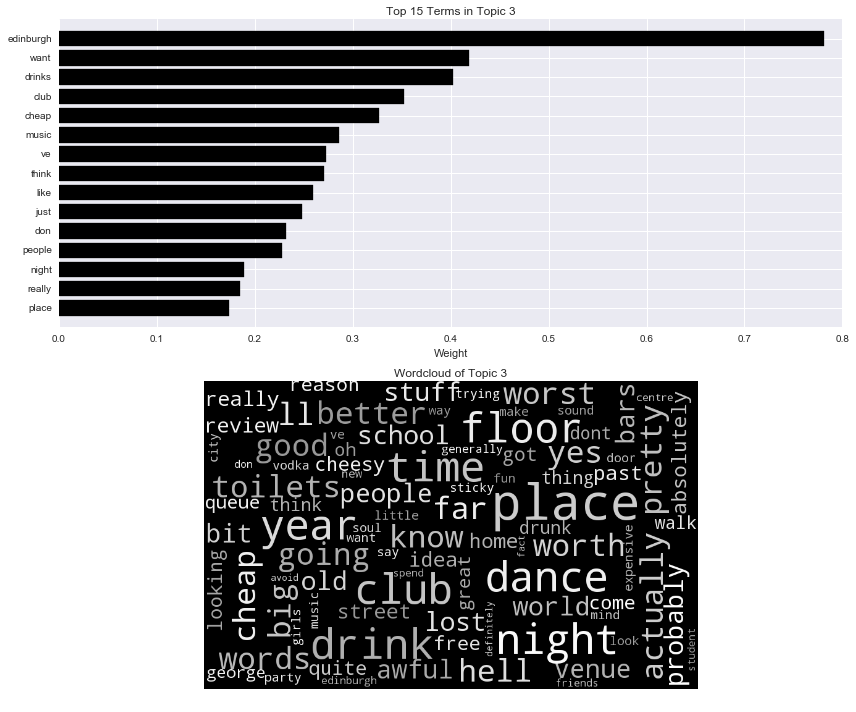


 Topic 4: 

tour guide bus underground tour guide people stories interesting time history castle loch let ride rooms stop company pictures driver spend group kept hours did taking gbp just giving city way money annoying built short hour wish waste decided got train family children pounds scary instead room didn lived particular visit actually experience obviously good experience didn really christmas royal edinburgh used simply royal mile poorly weather mile day glad plague walk boring better pretty just went little learn whatsoever tasting cheesy pointed glasgow pathetic half happened script stopped took actual plastic complete waste time told overpriced station know explore knowing set booked say stops couple


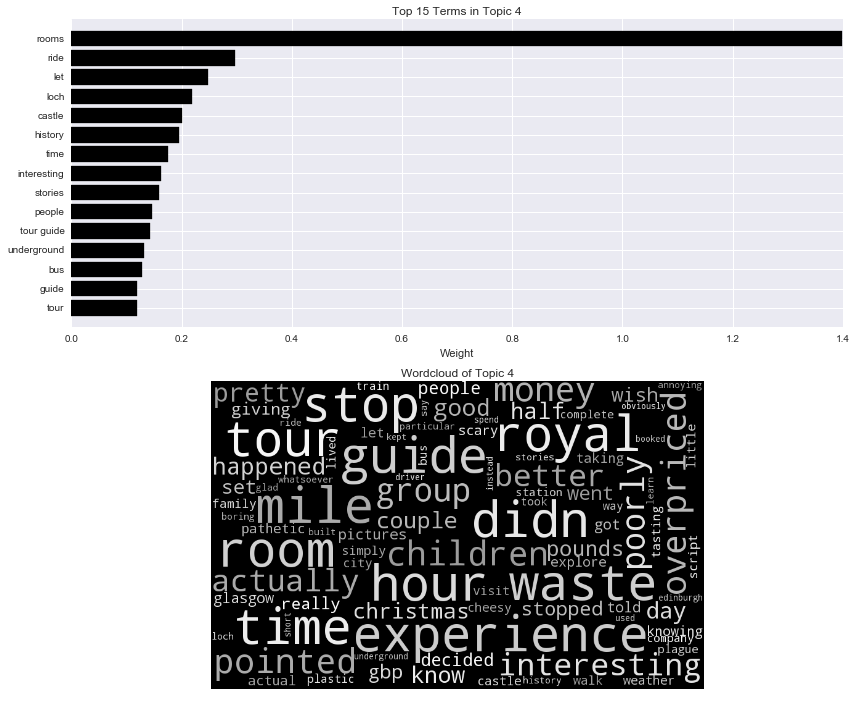


 Topic 5: 

coffee tea cafe chocolate milk cup cake outside starbucks coffee shop tasted cappuccino cakes really thought cafes bit espresso good don nice think hot place going welcoming coffees glad inside large friend things im didn changed tastes like decent just latte circle scone hot chocolate son menu wanted great shot value disgrace cream breakfast warm open went small people roast won going suffered feel leave experience conversation little min house slice buy wasn overall quite choice expensive cleaned oh love day fast taste frozen finding question okay say having times friendly toilet cups worse takeaway good things don think poorly long won soft shall surprised


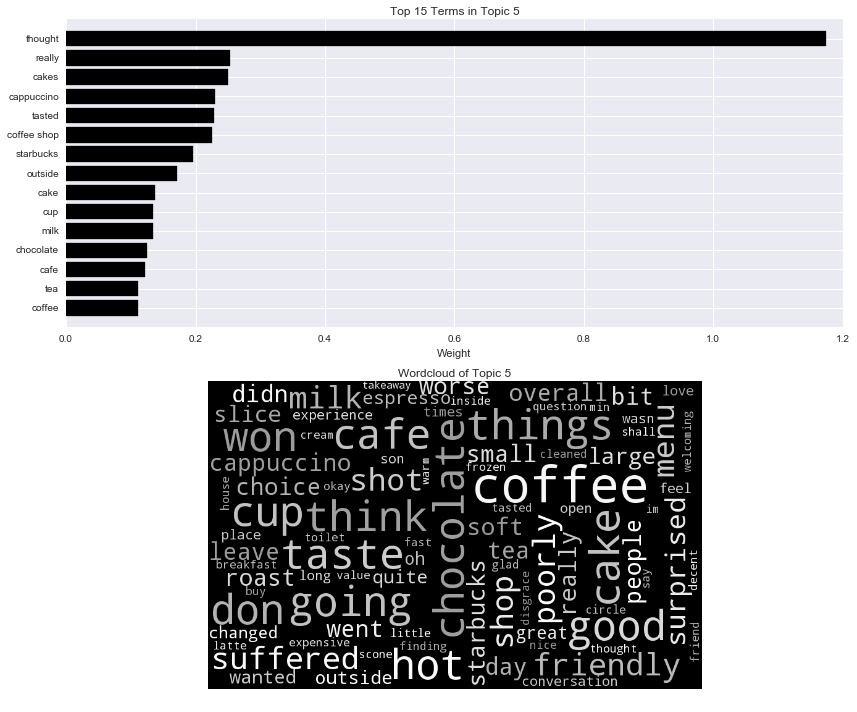


 Topic 6: 

room hotel refund desk stay rooms reservation work night stayed smell morning water booked trip cancel fee hot water old bed money time early business charged breakfast hot management internet wifi bathroom hotels did small check location window person plenty daughter end save money staying lovely noisy towel charge save hours calls nights great tea carpet hostel open outside sure probably stay away american staff paid basically walls way standards realized stars middle doesn work company yelled away unprofessional building charging free pounds emergency woke phone th medical drop replied counter foot hit located travel meals clean cold book double checking immediately credit okay


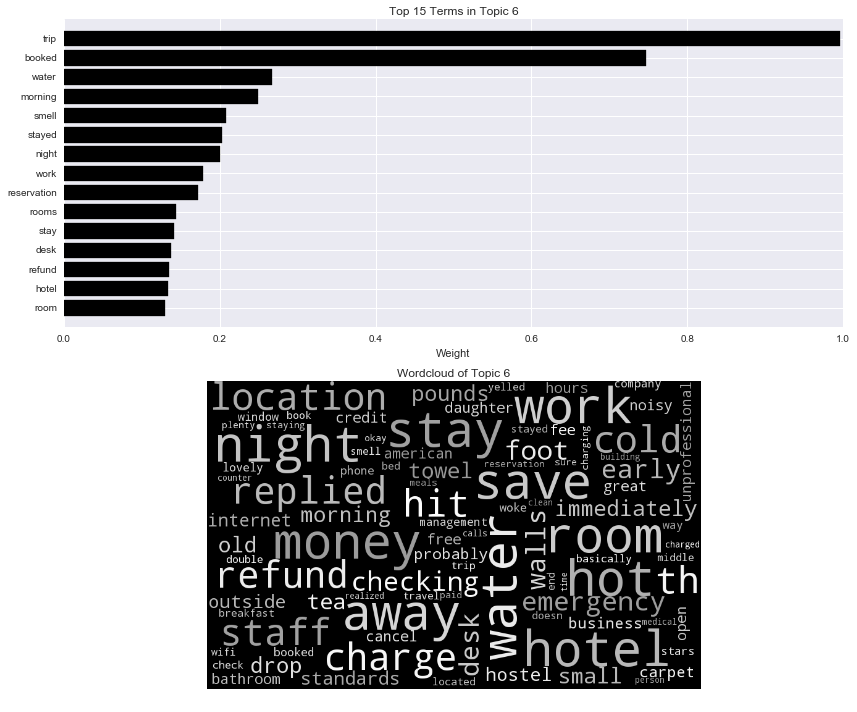


 Topic 7: 

food restaurant chinese horrible service star quality place italian chinese food plate food just quality food poor buffet average menu restaurants breakfast eat fresh edinburgh good worst dish terrible high bland terrible food overpriced mistake italian food ordered left establishment taste serve cheap going food good poor quality better thought frozen cold honestly review went does fast food french wish doesn don honest hungry sitting dinner options food menu fried money food poisoning poisoning lunch area fact okay prices indian mexican expensive ve disappointing great plates came pub level ill clearly fast awful care eaten know food tasted food cheap reason recommend worse scotland best food horrible assume good food charged great food minutes food home


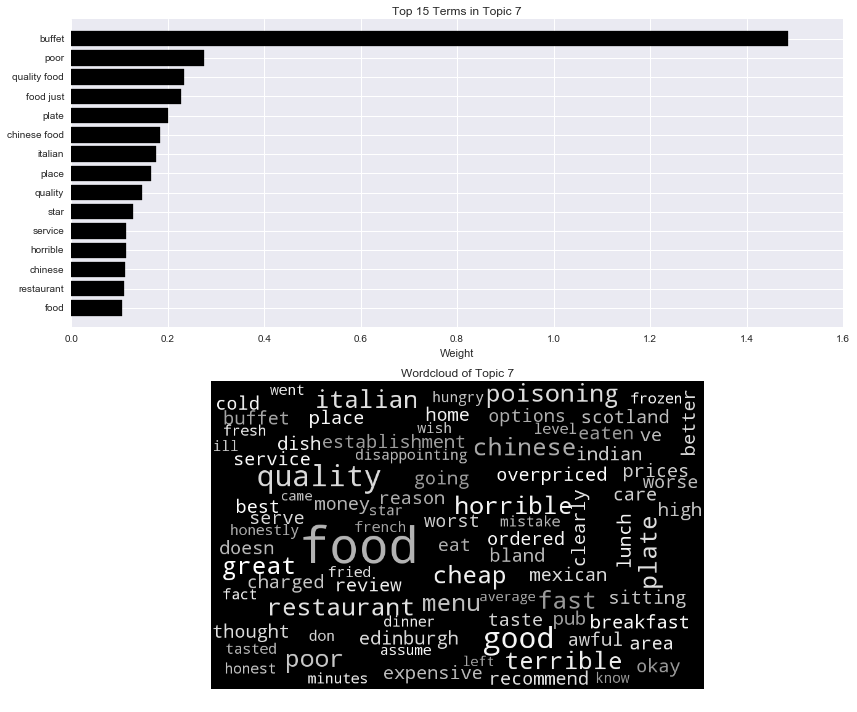


 Topic 8: 

customer service customer service ve poor poor customer don delivery time items store really customers won owner received phone terrible edinburgh think months refused complaint hold appears bus nasty understand service poor online thanks product getting item employee things huge fan pm fan tip work venues attitude case going don want lead plenty rd future horrible given expect driver use happy cafe simply company experience hadn door places feel manner reservation shame loyal loyal customer occasions returning refunded man life department shopping care slow products trying huge sandwich good unacceptable don expect excellent unfortunately great price individual spent certainly way times minute worse used view today high


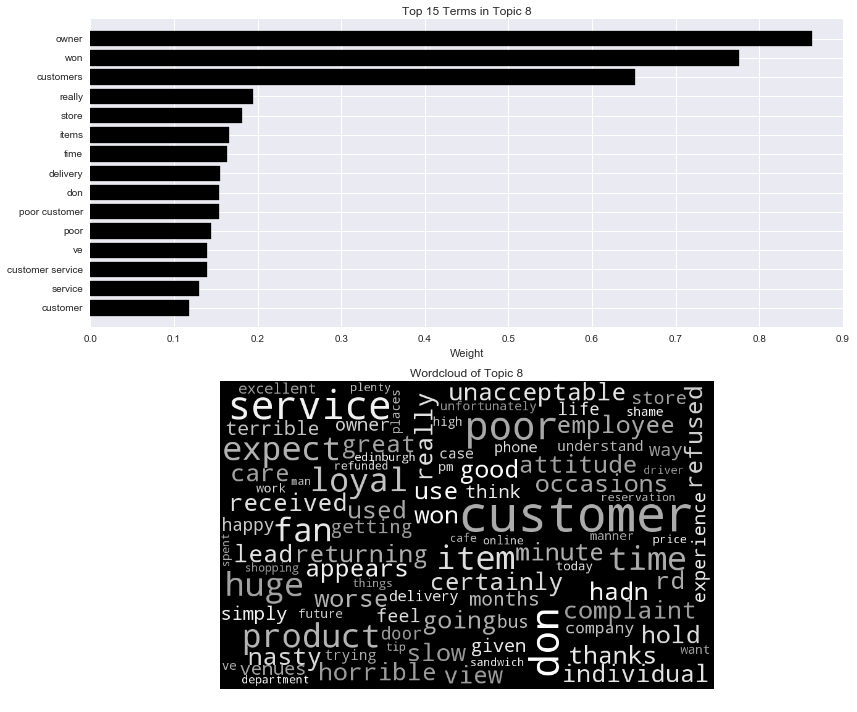


 Topic 9: 

told said got went didn asked took did order just guy day wasn phone called couldn time came later wanted days appointment friend away check wouldn manager asking home tooth card tried given try new pay paid different brought like saying ok sit ordered phoned offered way laptop open eventually make problem really bring night wrong delivery ll work say extra today weren need money thought decided family chance want pick disappointed friends fixed issue company bit come know walked felt busy counter going instead stay needed treatment started business left use deal class stated hours looking explained couple weeks


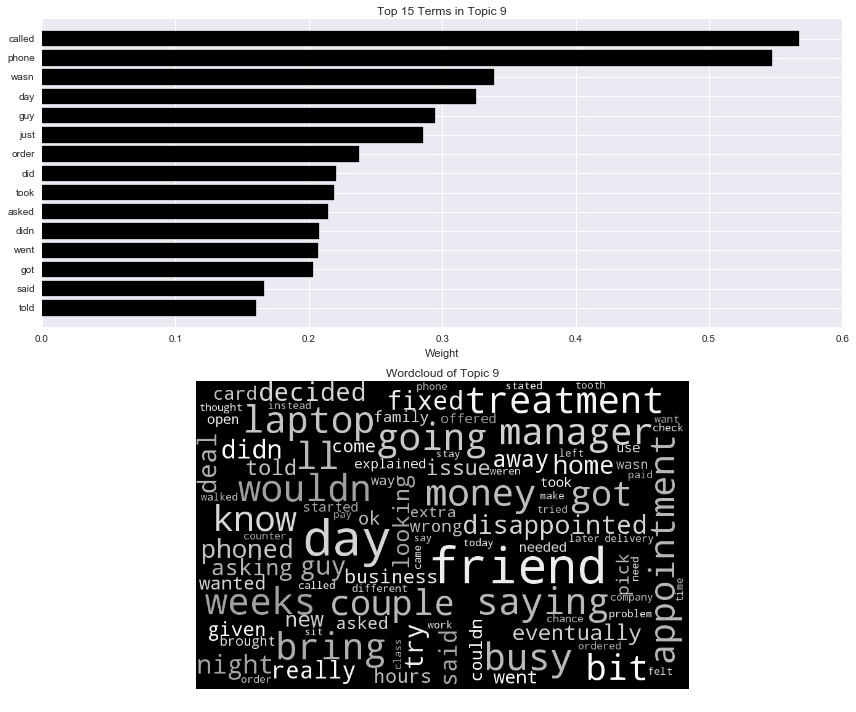


 Topic 10: 

bar pub man bar man place bar staff men pint la good going serve old reason drink tables football night id redeeming feature like feature closed enter area like place old men redeeming table bartender wasn parts music thing dark waiting pints sign type pretentious outside known cocktails past live yes toilets business eye walking felt playing change quiet bit seat awful bar area door house staff exactly shut guys english seafood popped review isnt walked won beers decide traditional ignored moving try group clearly chain seating smoking glasses great low unless age star inside standard knew round probably indian stay stuck uncomfortable stepped having train


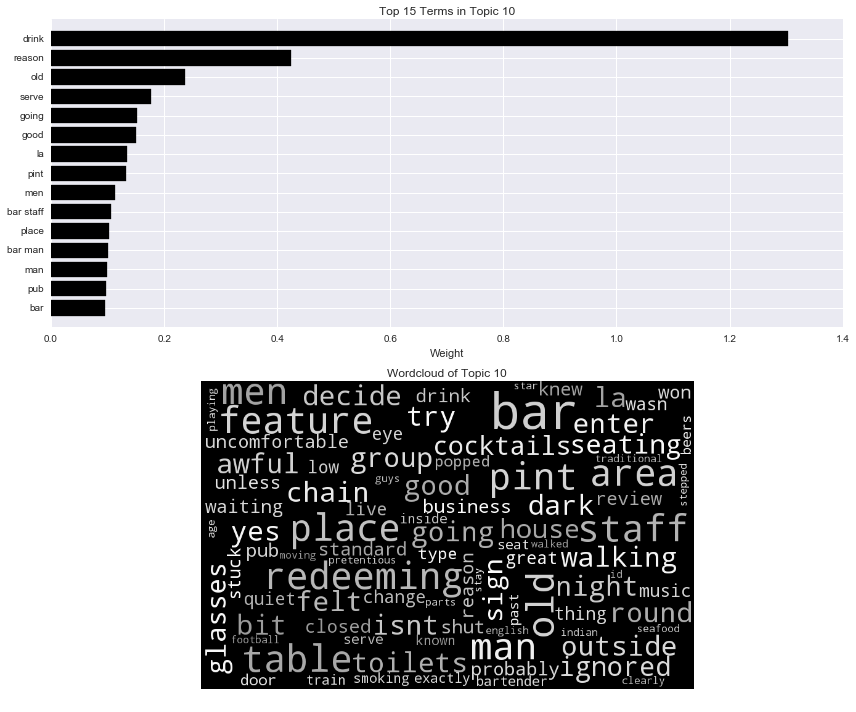


 Topic 11: 

shop shoes store stock exists bought shops moved like dress business address lot reason stuff ages longer way pair high buy walk items money chocolate low nearby owner want staff rude decide closed ridiculous looking thing probably tourists sure went replied summer shoe look dont point available needed product sell live cheaper sold quiet matter selection sort selling street coffee shop price gift im day window returned use said quality clothes avoid overpriced need bored weeks inside apart meant suggest failed disgrace spending loyal loyal customer guy products know cool run forget purely market yeah ideal local review basically online legal skills brand


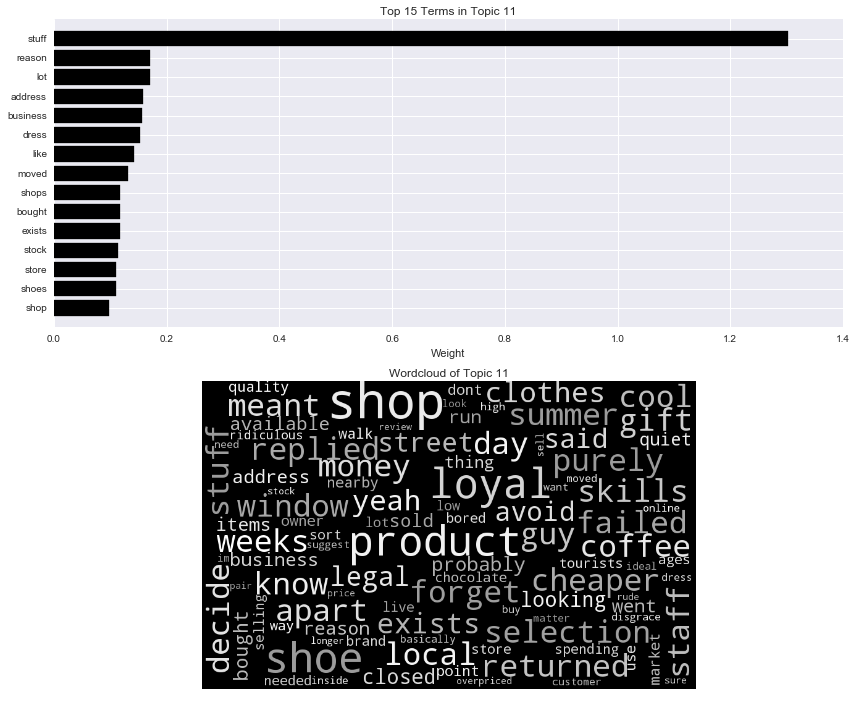


 Topic 12: 

pizza italian pizzas cheese oven la topping good cooked aren ve minutes just order late night pasta restaurant plus did sure cold late ordered away thought ready grilled want garlic fair night bread delivery placing cook pieces base sober short simple decided disappointed speed sizes deliver time rushed sauce considering dress microwave traditional tesco stone john great example pie points sides shouldn entirely uk pm probably properly toppings mean delivered taken lack say hungry odd reviews takeaway wrong birthday cooking server spice comment moved god highlight live managed portion couple standard thank request thankfully ve seen fresh cut pretty using mozzarella barely


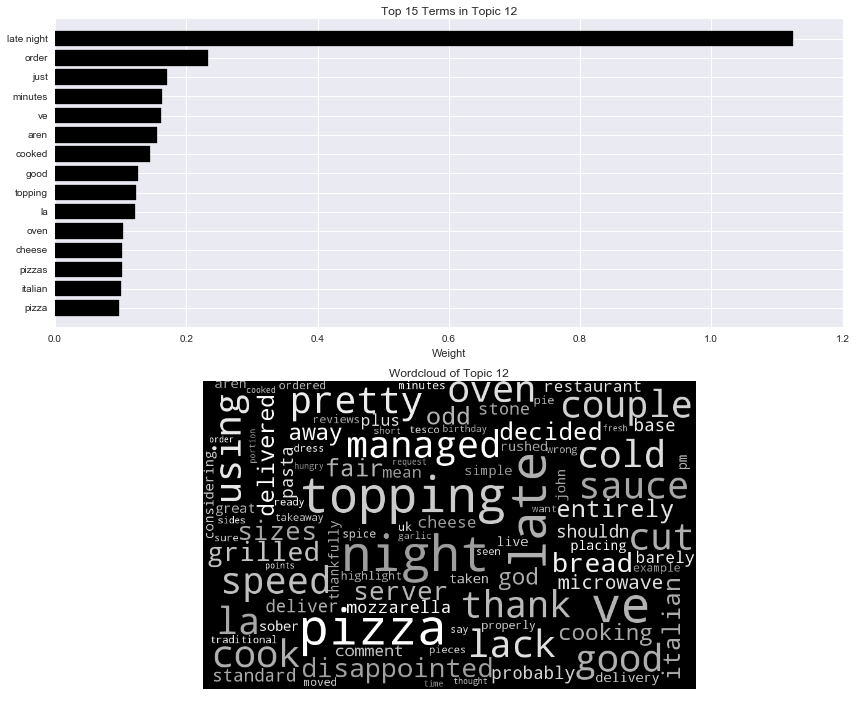


 Topic 13: 

beer atmosphere stand come space outside eat edinburgh selection limited great ok warm ingredients bloody run actually quality street good able better desired dogs wanted offer people return beers close pub don understand sad places juice high time wouldn create tomato entrance hard blue shit makes did offer food ok nice update waste stale understand prices station crap plenty fun available building straight dry terrible heard served literally main don toilet stools food places edinburgh old th left location day opening ve got hand didn beautiful visitors lower plus waste time physically got better buy let carpet uncomfortable whisky personally anti taste soggy did ate garden middle


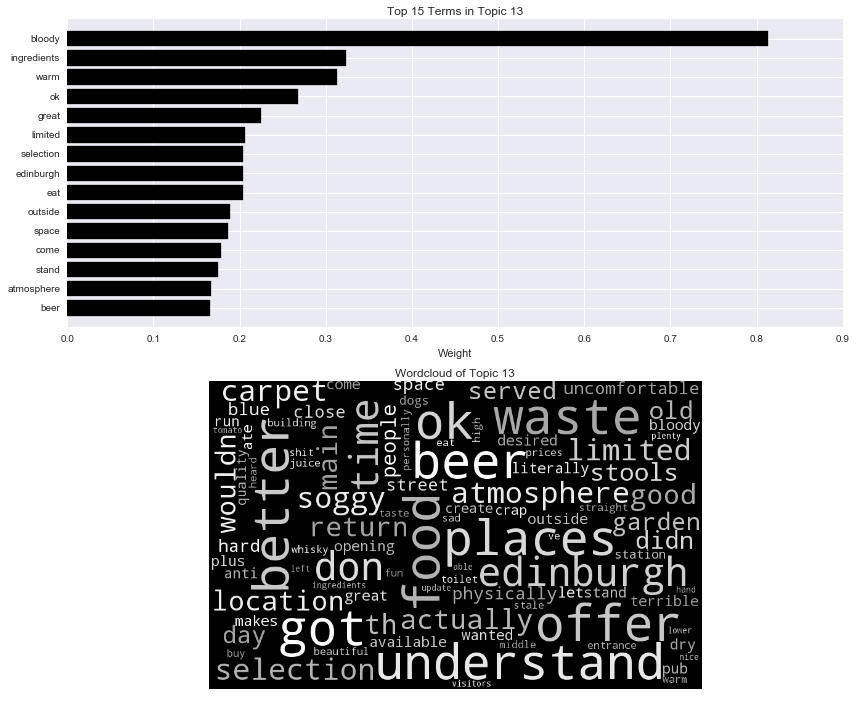


 Topic 14: 

die der hotel im man burger dog tag god min personal rest ok restaurant ticket hell closed smoke stomach leave generally told bites age husband pass allowed lunch confusing queue purchase check fail natural shouting mini bar smoking caused listen disgusting warn lowest consequently shirt close style avoid similar pretty sure mid pain living season earth bath really like double hospital steps knows woke makes threw don really review couple train food poisoning poisoning usually wet driver actually wish friendly staff issue arrive outside weeks turns non edinburgh stars seriously mistake grilled disgrace deserves record seafood door stated jar cleaned repeat standards platter run watch


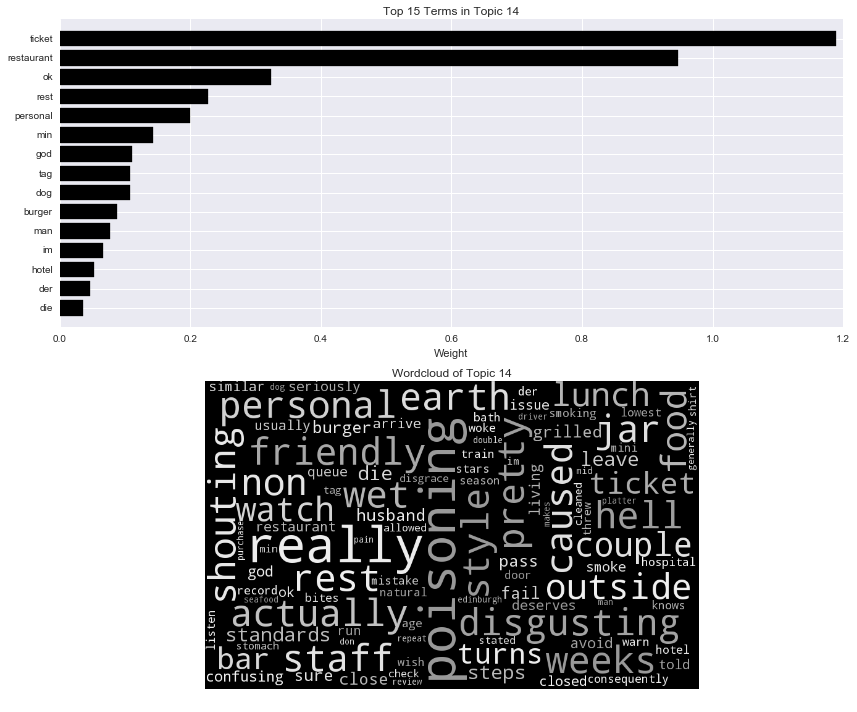


 Topic 15: 

hair cut salon colour look wanted appointment fringe style like listen don unhappy came horrible cutting alternative sort away requested head sides cost left guy fine make short way just far looking experience mess kept south price worst don like town sitting better money angry absolutely having went work ladies week bathroom did student pay little laughed warn read wasn thing doesn long pushed sushi felt half ive horrible experience dry felt like miles branch normal arguing pop following later different strange look like picture lot managed specifically standards nice case couldn drop using hideous really awful happy comes extra answer body hate able quite


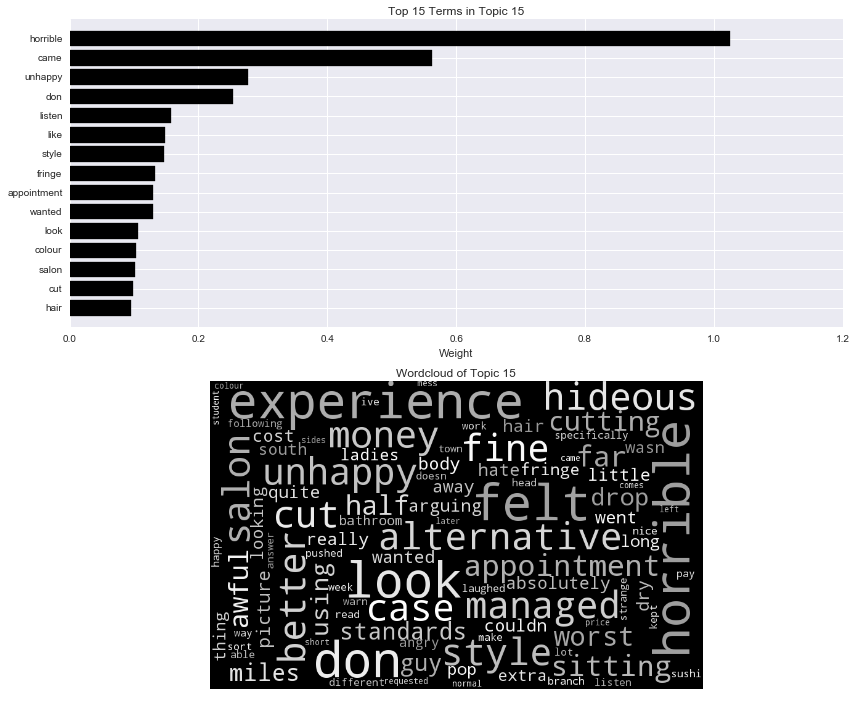


 Topic 16: 

chicken sauce ordered rice tasted dish like curry meat good sweet taste sour noodles meal dry ve soup tasteless tasted like just really worst chinese cooked salad ordered chicken wasn hot pork flavour sweet sour dishes spicy garlic fried away soggy served nice main came bland got reviews didn eat beef prawns disappointing boiled naan butter shrimp looked onion spring thai overall weird watery bit partner half ate lettuce spice tiny hard deep meals salt tomato ribs crispy cheese impressed lamb veg mixed pretty odd tried tough fresh bowl greasy did lunch texture know vegetables deep fried lot say grey didn taste oil disappointment far


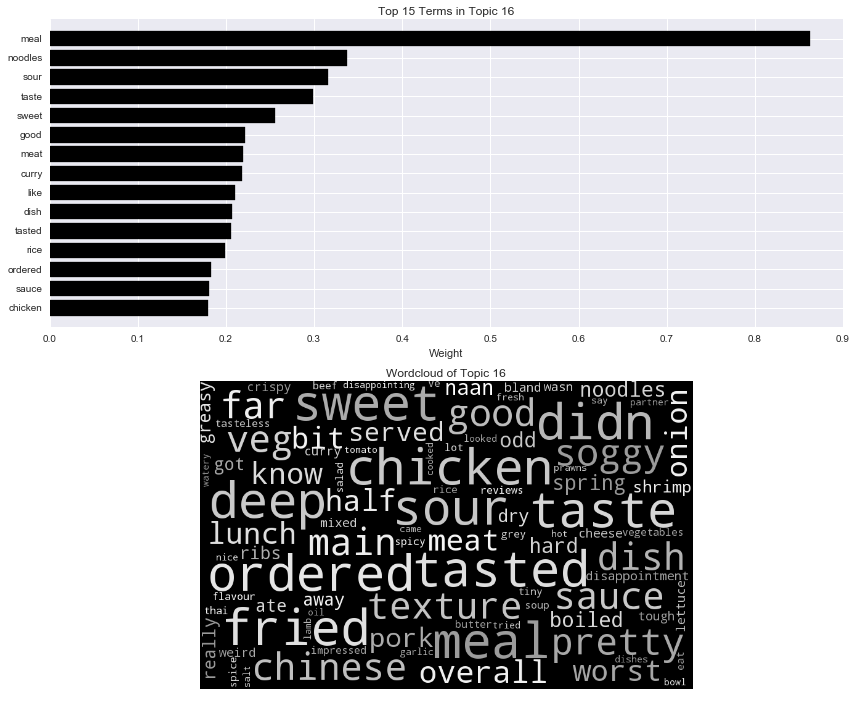


 Topic 17: 

bad just bad service ok really avoid really bad won giving sat got really bad day pm feel awful like bad food food bad ridiculous noodles day taste used explanation quality thing luckily home bad experience soggy broke lost gave look kids time sure shoes recently added rush drinking dip closed early stars seating costs animals good thing caught girl smoking toilet quality food good worse didnt cocktails course school zero stars person inedible food bland really like dry service bad alternative hope popular horribly just bad did end poor attention literally sorry rubbery sunny don eat honest place toilets sort themed bottle wine bad taste pair zero seen outside pad questions worst experience got usually hard information


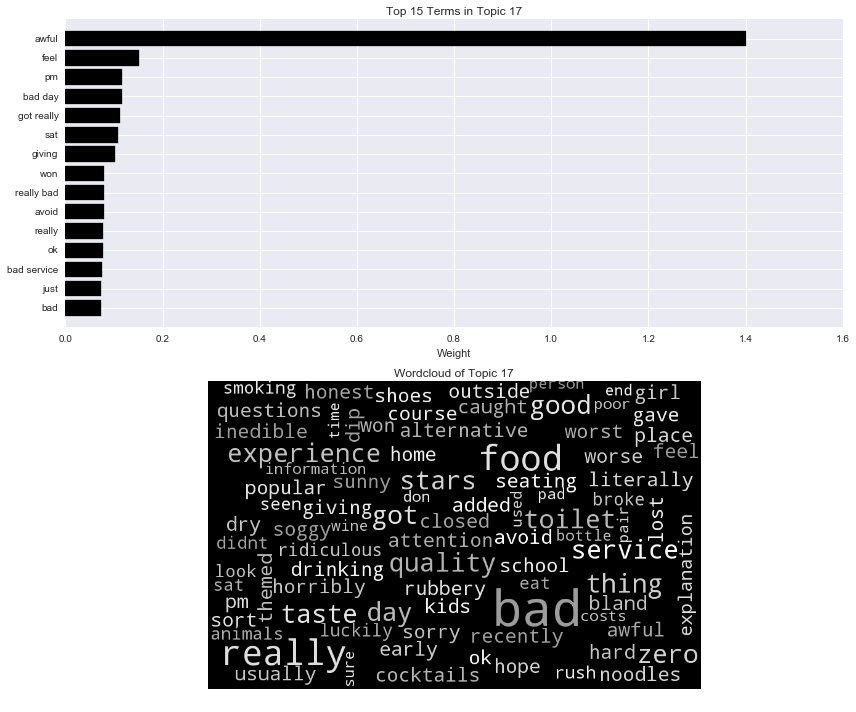


 Topic 18: 

staff rude staff rude dirty experience cafe left sit just friendly member did rude staff ignorant staff member members help extremely rude friends extremely looks clearly place unhelpful like welcoming wasn avoid costs look terrible stars disappointed nice customers possible awful group busy eyes wait staff good sat let rudely members staff attentive decor came costs quite avoid thier previous felt rude unhelpful member staff need service complained told come selection corner return paying felt like unless girl awful food food horrible paid poorly want watch arrogant overpriced book floor seat glasses tables having real edinburgh fancy didn want treat staff nice terrible food wasnt somewhat counter hungry yelp presented years south football half looked treated


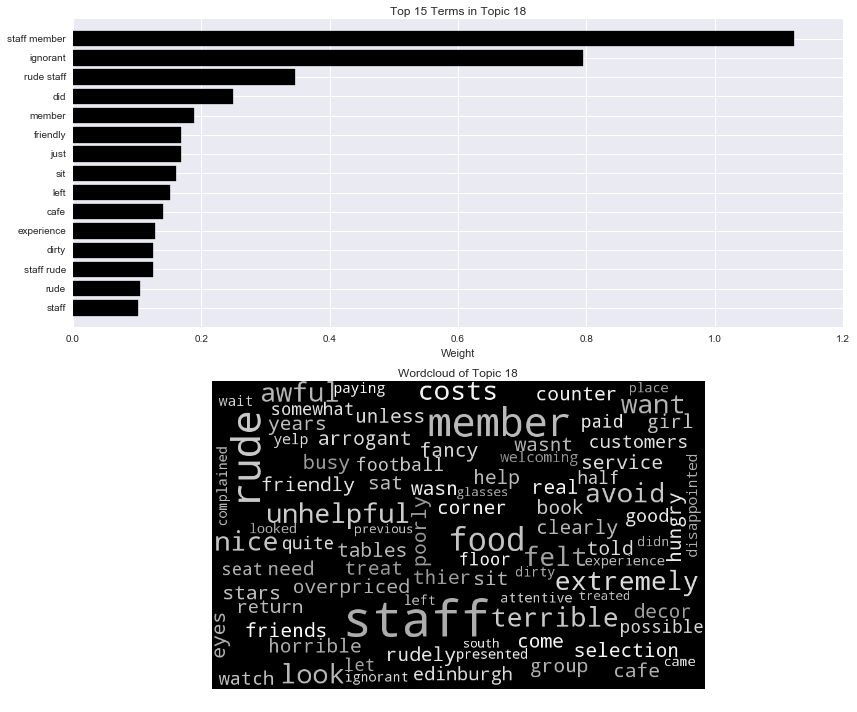


 Topic 19: 

minutes wait hour drinks waiting order waited service half long half hour busy took left mins waited minutes time food terrible minutes food long wait came worth waited hour minutes waiting finally come apology arrived leave place later arrive far menus meal burger minutes later delivery thai took minutes seated sat worth wait till booked wait minutes eventually served definitely hungry wish sandwiches expensive avoid started finished gave despite ordered slow decided leave min drink wait staff away orders food service rush ask prepare costs free hours times sold queue doing passed terrible experience avoid costs trap payment sandwich line attention looks lazy walk super standing boy round sitting cold tourist trap chatting notice watch staff


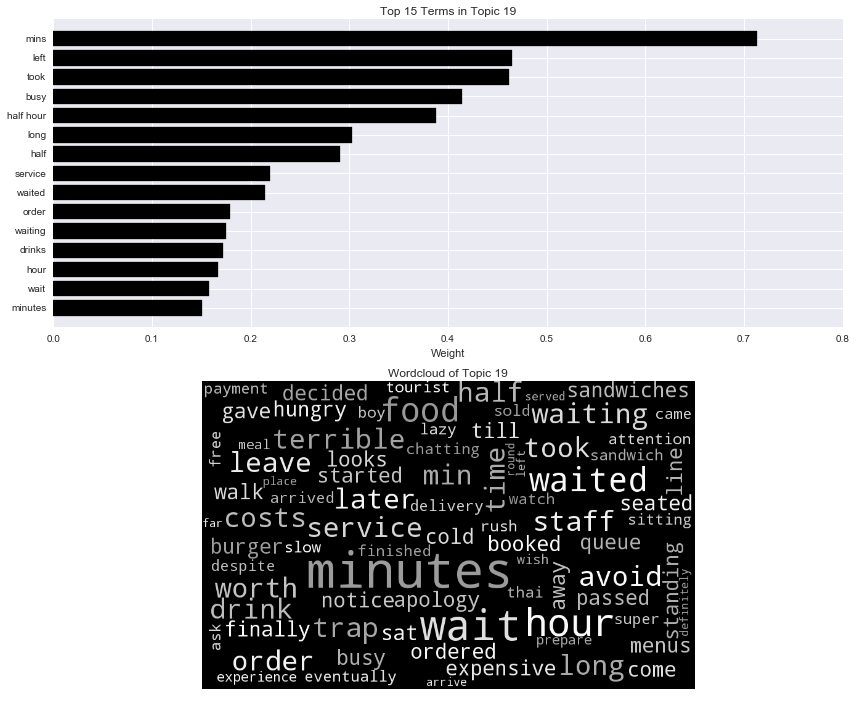


 Topic 20: 

burger chips fish fish chips burgers tasteless cheese frozen onion cold dry cooked steak rings tastes like bun inside salad small fries batter eat like won potato visit time little tastes meal terrible ordered ago obviously waste good grease advise chip tasty quite salsa rubber bit disappointed partner massive mcdonalds nice greasy portion price solid just ate eating presented reviews order definitely totally special disappointment wine mum apart read ages waitress small portion chef king hours waste money reheated tough toppings piece pleasant worst fresh local wait staff stale experience sides try joint tiny wait cost leaves sat great smoked chain thanks sauces rubbish best


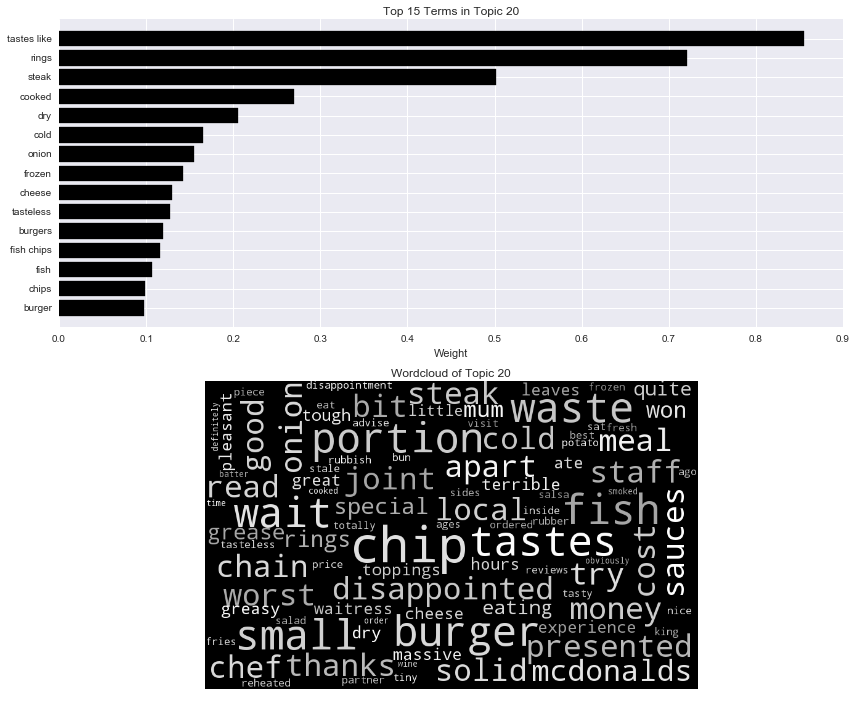

In [330]:
TopTermsByTopic(nmfmodel_1, features_1, 100)


 Topic 1: 

table order minutes time service arrived asked took ordered got came wait waited did waiting waitress didn long drinks told busy went tables left ask said hour finally wanted wine orders waiter sat menu later meal food experience half brought given seated decided visit drink new away having just taken served ll gave kitchen door couple poor thought arrive manager customer wasn pm long time stars mins check come ages needed guy leave received waited waited point seat going eventually slow times server walked started starters cocktails menus bring pay water booked ordering tried finished customers end minutes later star different actually sit


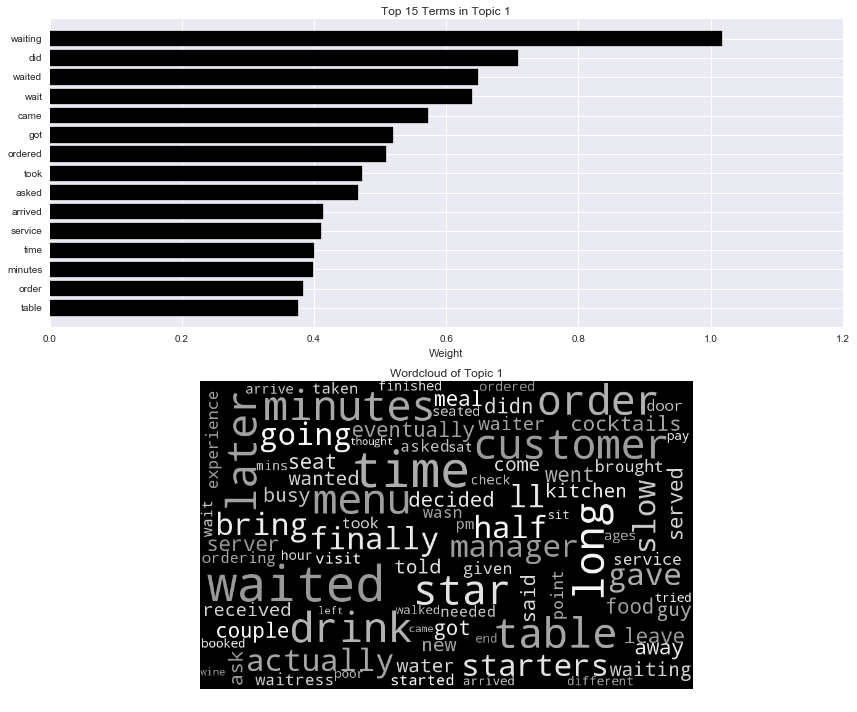


 Topic 2: 

pub drink place pint pubs old beer traditional pretty quiet locals tourists pub food beers rose selection area atmosphere outside average local does nice ales scottish typical man isn prices old man special grassmarket world students student welcome quiz standard usual traditional pub ale think real ok attract looking just inside menu tap toilet rose street decent food toilets afternoon allowed pints average pub drinks clientele certainly didn group mans pub mans good fair share busy new change little end man pub live chain particularly good pub share people bit men discount tv friendly fact sticky crowd wasn football popped corner fair came great pub nicholson range spirits royal mile used


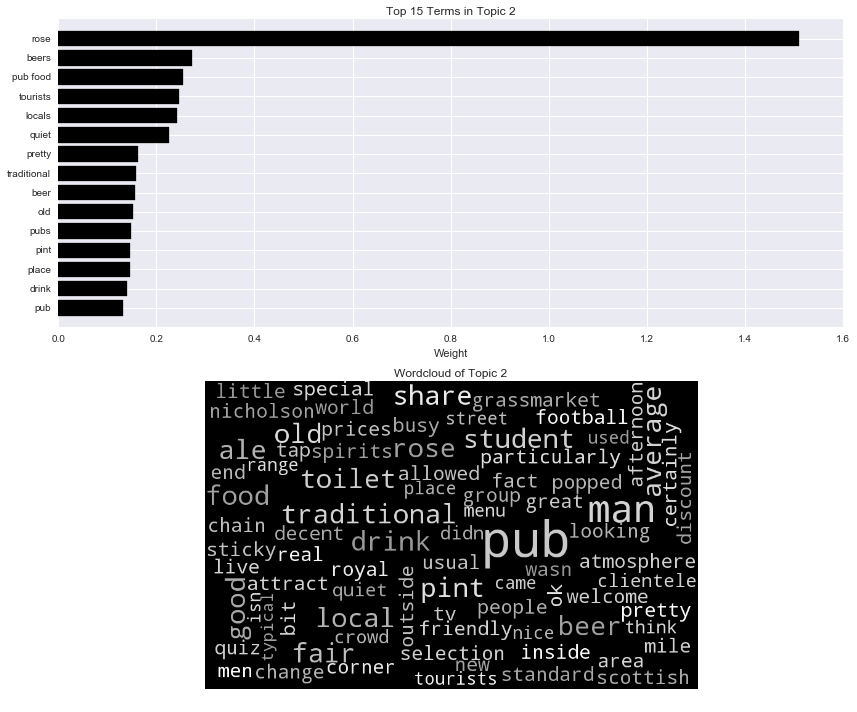


 Topic 3: 

store clothes shoes cheap stores bargain buy better items sell nice stock way quality new online department used think pair planet don actually price need shoe stuff looking said look primark size school really bored want chain good offer come lots selection tend things zone lot help dress bought work style jewellery make clothing harvey prices brand bad browse wear gap fancy guess hey money running run sales wonderful short department store saw return imagine dresses fraser display sure sells form princes street poor yes pieces queue fair range wanted particularly tesco massive discount fashion bras underwhelmed ladies similar world spend clean


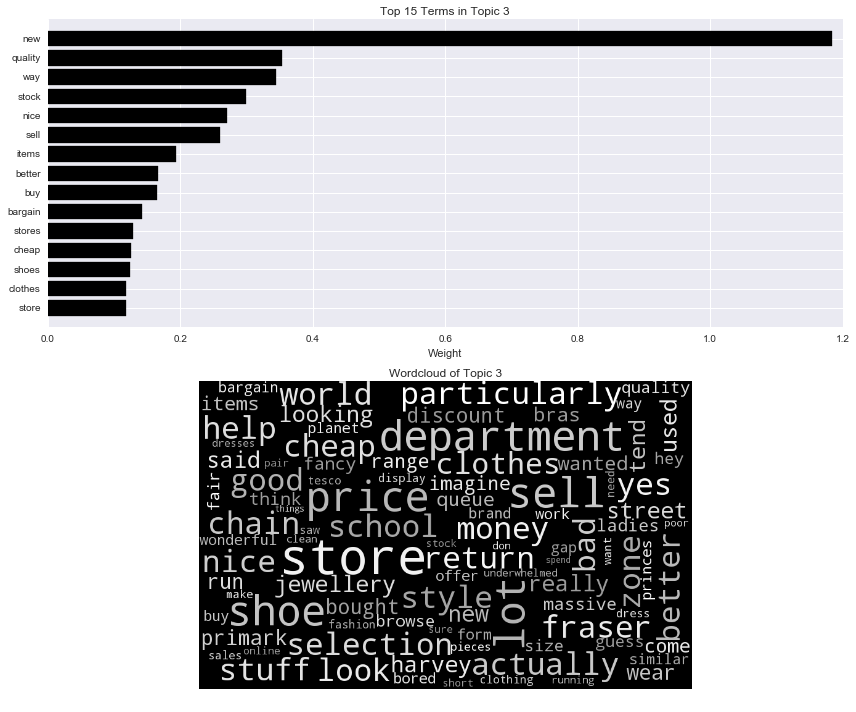


 Topic 4: 

pizza pizzas italian cheese express pizza express la sauce base toppings paradise home tomato pasta ate restaurant pepperoni place slice cooked bad better menu topping delivery dough takeaway nice salad margarita ordered eaten greasy places quick getting best ago extra really kebab eat stone delivered high won pretty good having veggie late gluten away review baked meant bizarre delicious frozen seafood thought road case style returning definitely time unfortunately dishes sure lacked flavour fact mushroom italian restaurants calzone italian restaurant stodgy soggy crust lacked extremely till inside tomato sauce freshly price town chili extra star lunchtime watered local kebabs chips gluten free spinach menus bit starving buying


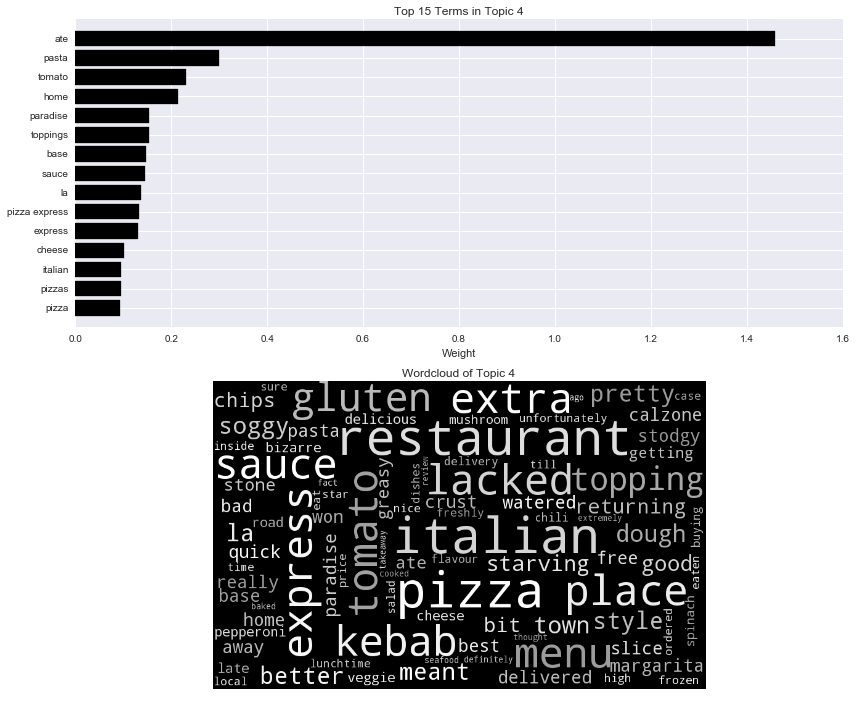


 Topic 5: 

room hotel rooms location stay bathroom shower floor breakfast wifi desk check windows building price clean door hotels stayed great staying toilet lobby small room service beds great location couldn noise bed hotel room edinburgh early good old day moved hallways use uncomfortable free travel location great pay view pm despite walk morning reception close make days little wasn nice air didn window furniture sure construction fine long showers slow entrance tiny cinema working away double went center hostel restaurant did main service going booked nights th level parking second movie wall twin comfortable internet big large trash got trip walking doors work dining


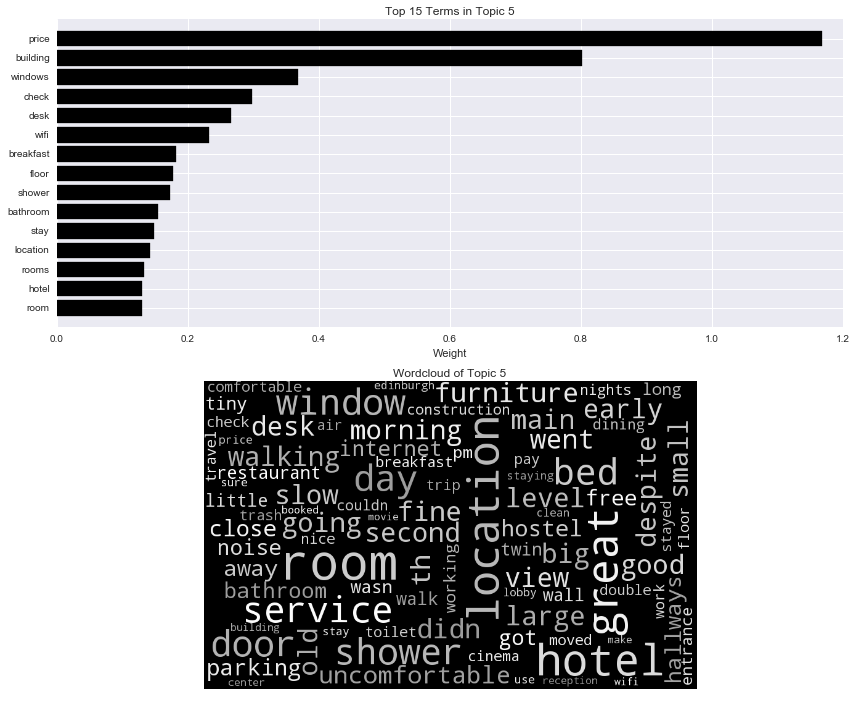


 Topic 6: 

bar drink drinks great place bar staff good atmosphere bars cocktail beer afraid sports beers wine cocktails bit area served prices upstairs think lot fairly cool large venue sports bar probably pint evening glasses bar restaurant piano seats don think decor going bars edinburgh trying group people inside clientele list glass selection table service seating looks cider choose quick stand watch ve sorry bottle fan craft outside groups theme napoli bar napoli expected great bar don shots trendy tables reason building just tv forget takes enjoy student hard changed star interior bar bar central football toilet stairs kind barely wash friend say students happy staff overpriced big cheap getting


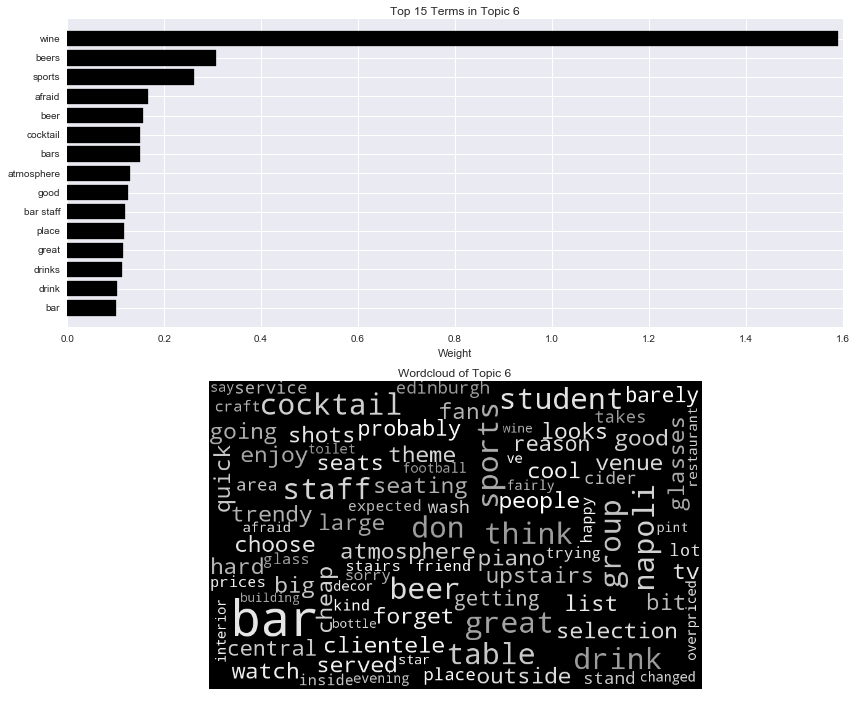


 Topic 7: 

burger burgers cheese bun fries chips good meat sauce bacon burger king bit patty ve better better eat taste king ve wasn cheeseburger dry like just place tasted quite cheese burger burger good menu fast food voucher food beer onions greasy mac high mcdonalds fast salad tasted like undercooked disappointed average price unfortunately came visit mcdonald excited shakes mac cheese paper sauces frozen couple cow overcooked chili ok expecting ordered southern milkshake got tasty instead rank eating way scotland eve deliver quality veg veggie went onion serve lettuce serving nice husband gourmet burger chips wanted black chicken burger cooked cutlery beer selection best hash recent meal hungry potato thought dogs


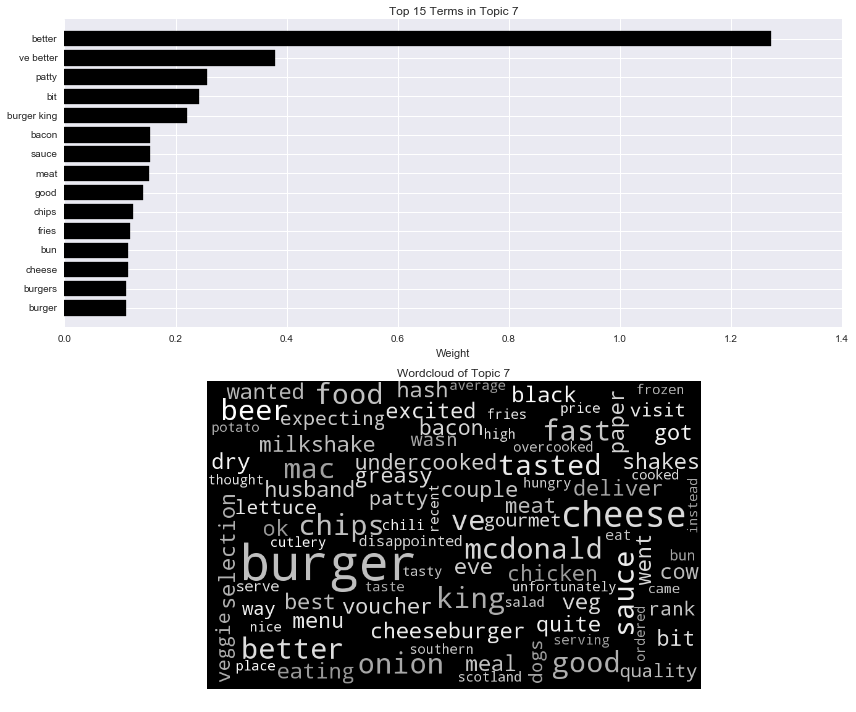


 Topic 8: 

night music club cheap place drinks dance clubs george street student nights floor george street pretty year people stereo good open loud bars small expensive late dance floor students crowd entry edinburgh great live fun awful time venue drinking drunk bad old live music quite dancefloor best drunken cheap drinks deals toilets friends university vodka clientele dj week floors makes doesn bouncers ll party guys offers men scene late night area drinks cheap loud music popular long went revolution weekends end aged day group busy really home ghq normal pm yes shanghai going vip better cowgate offer sleazy shots queue getting rock isn definitely number sort play


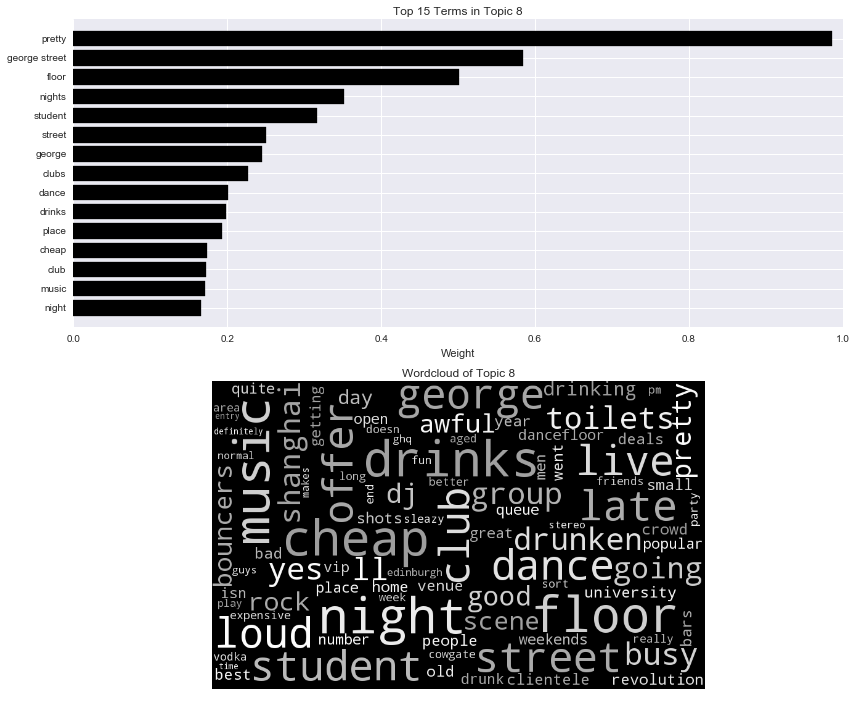


 Topic 9: 

centre shops shopping mall princes street princes mall shopping centre food court court st city princes street edinburgh station st james james joy high street centres sainsbury retail boots building costa time james centre new big new look kfc branch food john lewis lewis location large walk area john high leith stores city centre town feels clothing limited rose waverley bus offer busy does pass honest quite buildings depressing visit isn hmv eat choose reviewers doesn omni aside need aren like makes way terminal range independent really ll ocean terminal square popular places ocean island better recession omni centre tram train wandering place fast food restaurants handy entrance gym fast rose street far st andrews


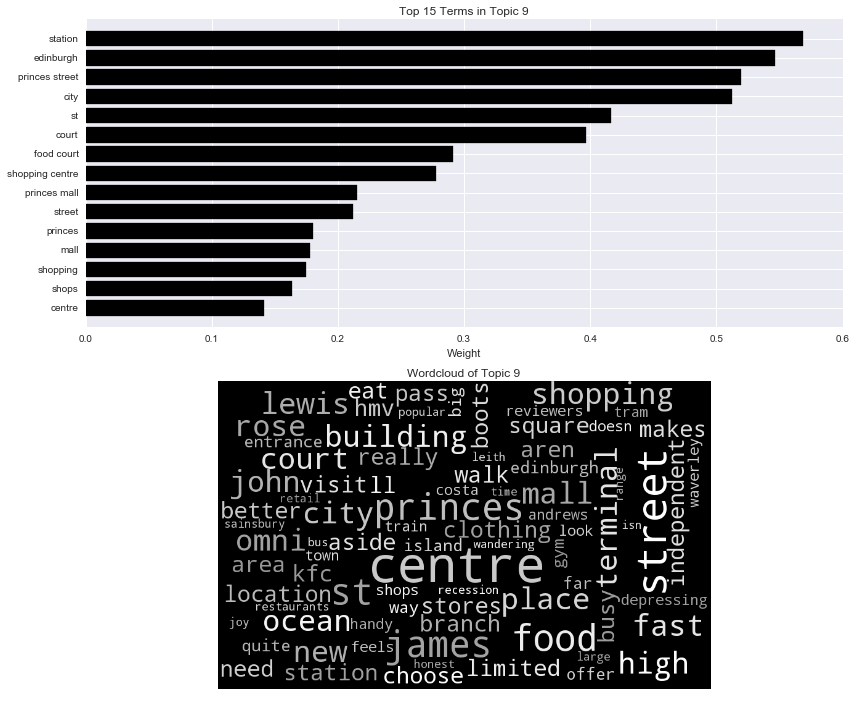


 Topic 10: 

das und der die ist hat okay man museum lasagne service pasta mile hotel im royal mile royal chef ok winter haggis um private story house food okay holiday buffet bat personal noisy inn problems starbucks fast service okay gonna conversation silent hell don come hassle dragged sorry ok service don whilst waiting rest dead flat young appetizer hate old tourist customer guy chain waiting staff theres bad corner locals quick relax fact wasn impressed excellent just ok quiet huge fan help heat experienced customer service want sit central location food ok undercooked pack location essentially want age think place priced pasta dish afternoon hurry impressed central expecting rude supply simple ages library considering plus sorry say


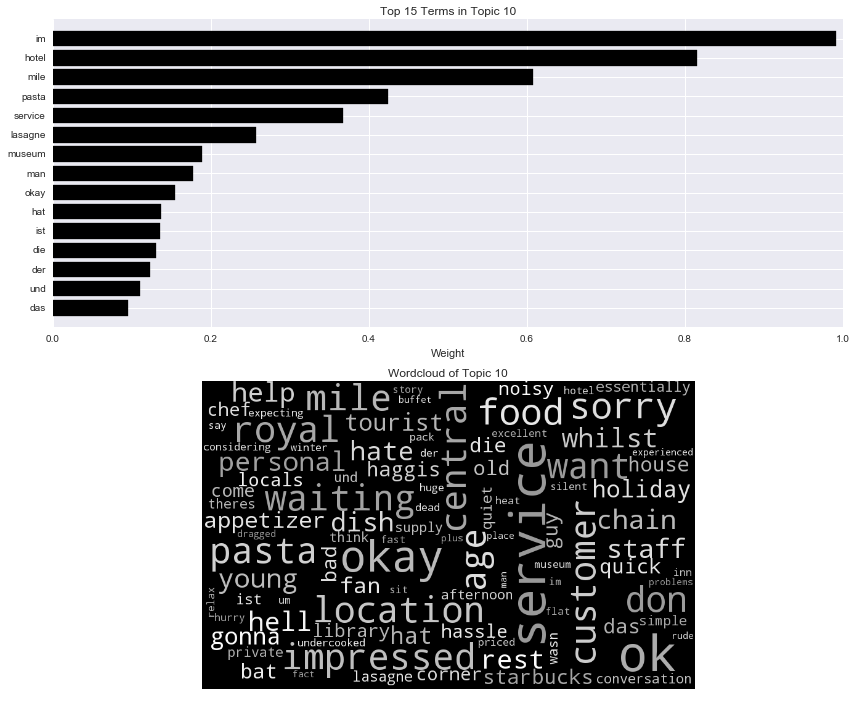


 Topic 11: 

fish chips fish chips ordered batter soggy local ordered fish steak chippy sauce starter couldn fried ok peas chip haggis dinner onion wasn dry looked tasted fishy fish cakes pie came oil pork eat onion rings chip shop bad rings salad greasy bit mains fresh special far potatoes supper considering spots sea vinegar plate deep mushy cheese night try size dish cooked hungry street meh hit miss dessert portion extremely sweet eating soup decent chips good right fries better ate menu crunchy edinburgh deep fried miss away issue pudding boiled chicken bland cakes served main fully stomach partner frozen hit starters beef tasteless really fail american staying portion size


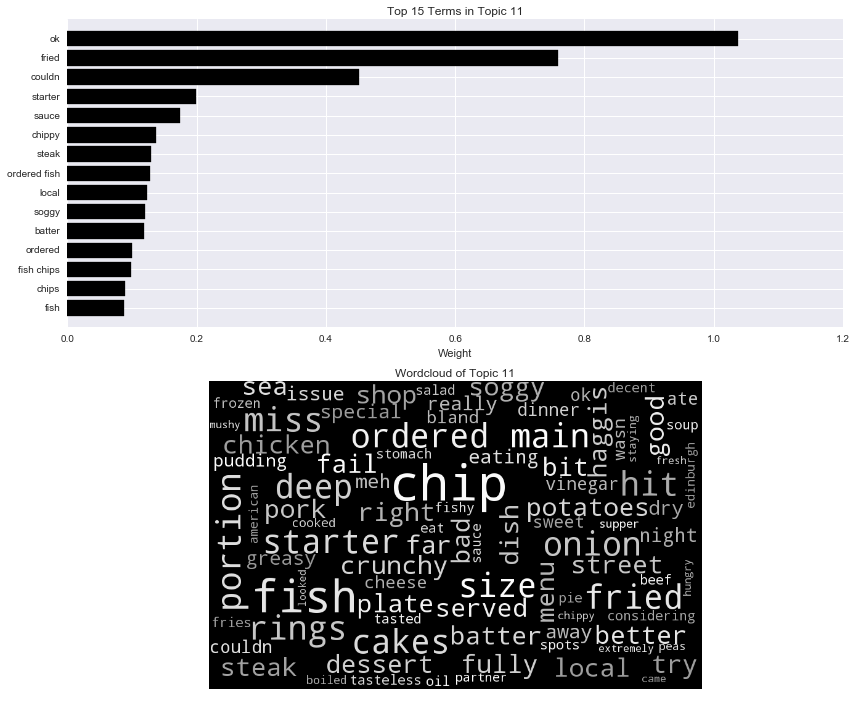


 Topic 12: 

chocolate hot chocolate hot cream ice cream ice soup cake caramel ordered dessert salted brownies rich wasn pretty ve sweet read high marshmallows dark lemon bitter served cocoa expect apparently coconut solid tray glass instant clearly rush nice overpriced writing prices brownie float average bread eventually slice urban wow better tell like excited seven love whipped whipped cream disappointed minor mash smoked taste delicious just chocolates inside despite butter experience form irish guess shortbread pretty tasty salt white left ve better dried attempts cakes tart coca cola coca heard usually day cola visit texture starbucks water say popped numerous recently costa base strongly making complete independent


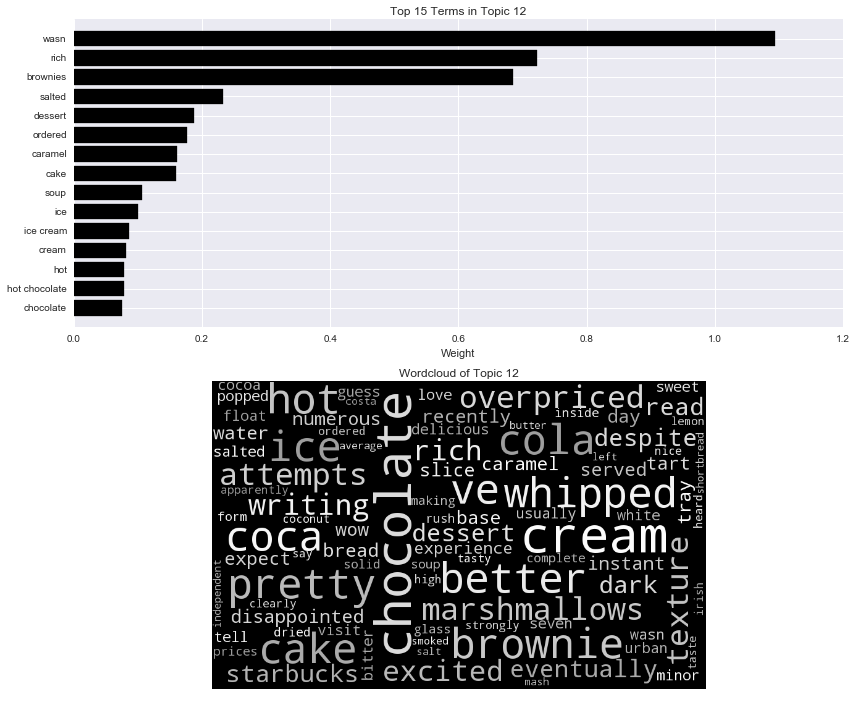


 Topic 13: 

like just don ve really place know people think feel bit quite thing time didn want look times felt going places make way come don know little say feel like sure kind used things hair mean got don like ll love coming actually isn idea experience oh wrong huge doesn stuff lot feels trying cut place just big try fact looks cool means great worth yes life different feeling years day seen definitely felt like don really did friends hard amazing money sorry does walk honest past looking probably guess home friend problem old ok don think having taste far right care understand expensive guy feels like exactly


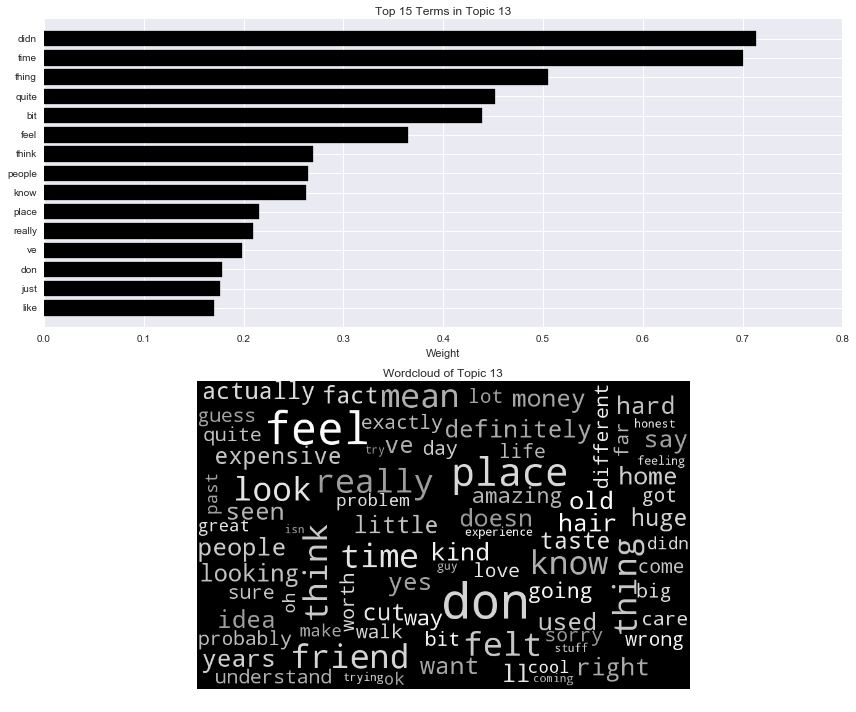


 Topic 14: 

staff nice really friendly food bad staff friendly unfriendly staff nice lovely quite location friendly staff rude times atmosphere customers ok staff lovely bit really nice helpful busy welcoming member expensive disappointed staff really pounds better good place staff just bar staff good atmosphere owner decor better staff disappointing right management try friendly helpful great great location noisy feel felt pretty actually professional went excellent food ok despite shame lots uninspiring work twice far better eat priced bought doesn pleasant nice atmosphere outside nice staff won didnt cafe indian breakfast time warm looked feeling blue friends pay decent ve generous dated needs attentive quiet perfectly staff member ve times went lunch efficient really busy plus huge cool got horrible cold


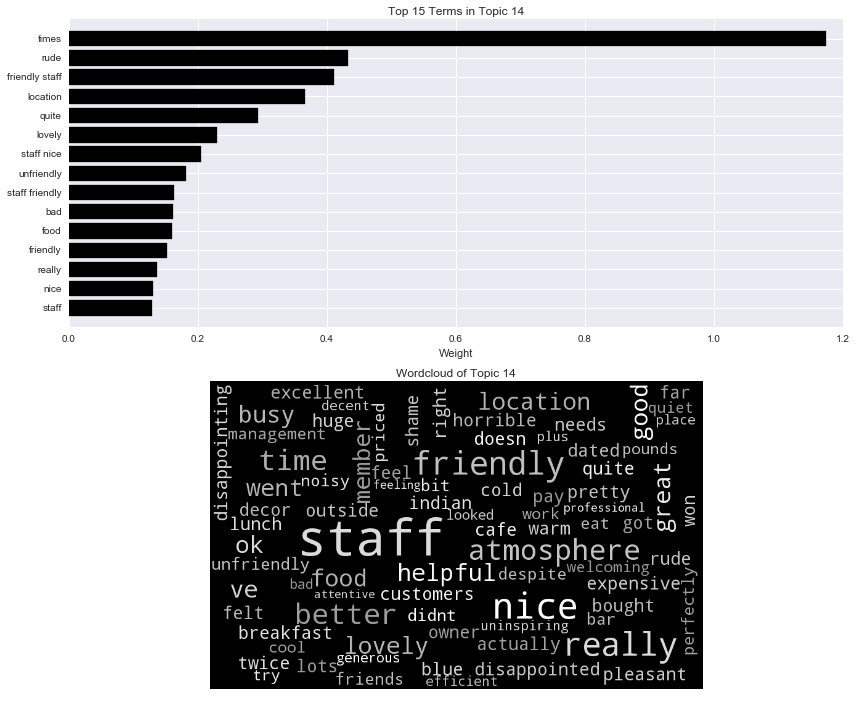


 Topic 15: 

tour castle whisky edinburgh guide tourists royal history mile royal mile tourist tours tour guide scottish city group edinburgh castle lot definitely experience scary bus ghost ride visiting story tartan crown bit time underground worth stars seen historical entertainment rooms scotland little culture authentic nice local people spend walking fun thought information trap real hour run given short overall expecting definitely worth money free tourist trap did say buses price beautiful cost expensive end places pounds haggis load takes whiskey horror ground long collection knew said blood walk tram yes boo hand ve visiting edinburgh seen better point better hop museum away shot spot genuine pubs chat


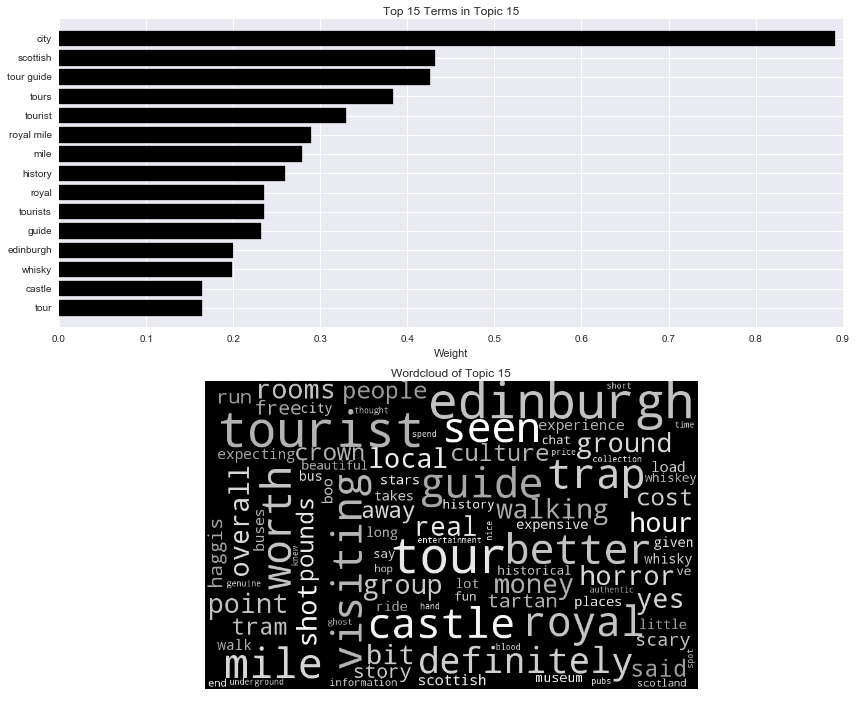


 Topic 16: 

potter harry harry potter elephant elephant house jk place house rowling birthplace birthplace harry wrote prices castle fan make bathroom don used covered jk rowling better way great menu thing write fans probably famous visit dog connection national unless want try views tourists food decent pretty excited completely reason reviewers fact toilets love stars coming giving don understand ridiculous went school crowded die star sandwiches museum deal going bet want decide edinburgh understand bother cake decent sit disappointing try salad coffee place hate dry getting taking books just instead tables view appeal quieter poor aren gets cakes sense weak standard service apparently opening stop old cafe dressing good


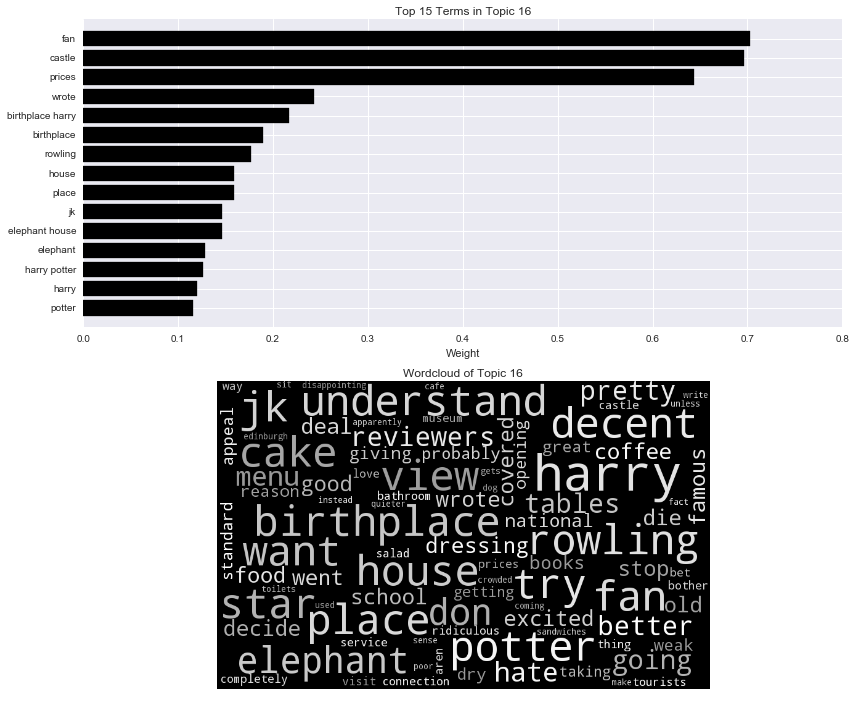


 Topic 17: 

shop look stuff bike prices buy things clothes jewellery looking selection shirts sort day high looks shops little sell pretty price customer stock need party expensive tacky isn like book window selling did small walk really great costumes sells cool coffee shop white stuff dress books street does shop just good customer service records range browsing card likely clothing make edinburgh yeah available generic hand open pay cheaper best sure items dresses star simply bought inside handy ll pocket outside basement new bikes better bit white looks like steal chip isn really cds trying chip shop home type miss say decent phone fancy second hand know owner novelty


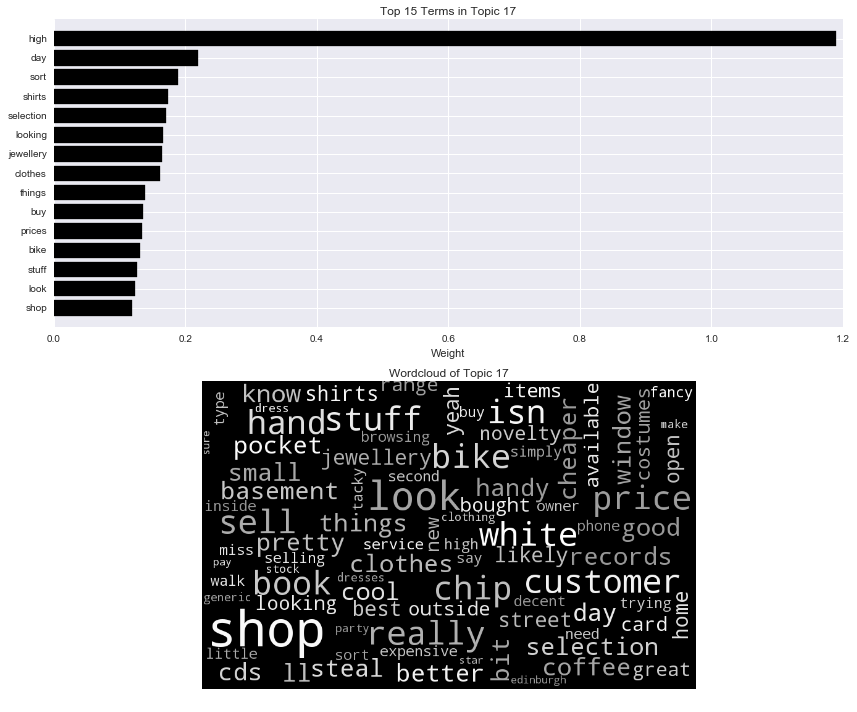


 Topic 18: 

tea sandwich cafe afternoon afternoon tea bread scones bit breakfast roll little pot cakes lunch cake place just bacon friend choice sandwiches scone sausage pot tea like small cup eggs cream bubble teas salad left cup tea went lot tuna order cute cups milk wasn decor sausages lovely counter cheese delicious slice quality came egg looks looked half outside looking lemon caffe baked try didn bagel hot rolls tea coffee green meh decided overly disappointed thought cheap fine brunch bought think big pork good did space selection syrup ordered interesting wouldn fresh original nice flavour pretty town road bother yes quite small toast choices bad


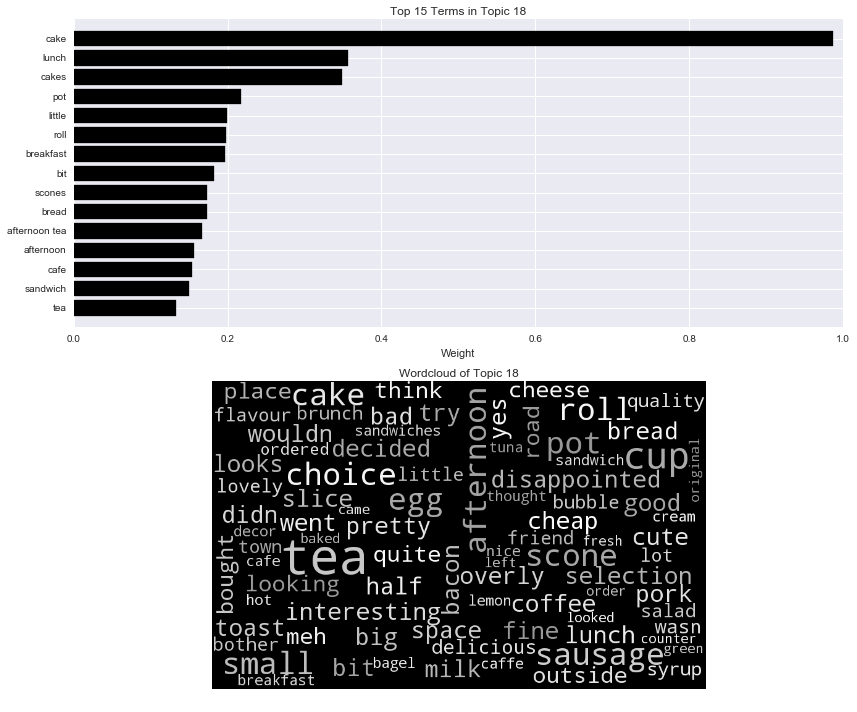


 Topic 19: 

food good restaurant service chicken meal menu bland chinese sauce better mexican great rice pretty quality wasn dishes soup taste average main lunch eat place dinner overall beef experience dish tasted cheese meat fried didn restaurants good service tasty takeaway starter disappointed price options ordered ok cooked food good tasteless portion little burrito wine reviews best slow served pasta chilli pork really steak cold flavour came portions italian nice mexican food indian mediocre plate spicy atmosphere star vegetarian good food won small dry flavor dining japanese edinburgh curry fine quality food say salad nachos seafood bit course bread recommend fast prawn eating sweet dessert lamb


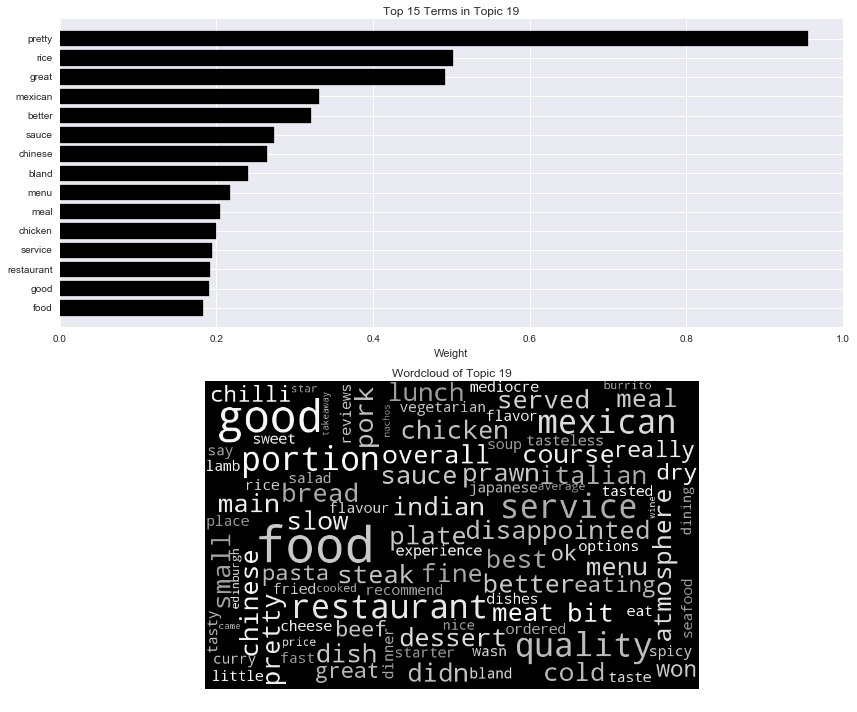


 Topic 20: 

coffee starbucks wifi coffee shop cafe espresso good cup bitter nice breakfast free milk work latte terrible good coffee place sit drink morning soup costa space free wifi decent coffee good coffee shops like light half working cakes spot press americano music artisan apart forest service awful cups sitting comfy better flat favourite shortbread look nero chairs smaller project taste minutes cup coffee clean ll hint branch caffeine lattes artisan roast cappuccino bean average unimpressed favourite place mind drinking use want black medicine burnt bad beanscene attitude hipster nearby panini independent tables walls black eggs floor tasting say roast run medicine human station caffe makes business chain tea coffee don


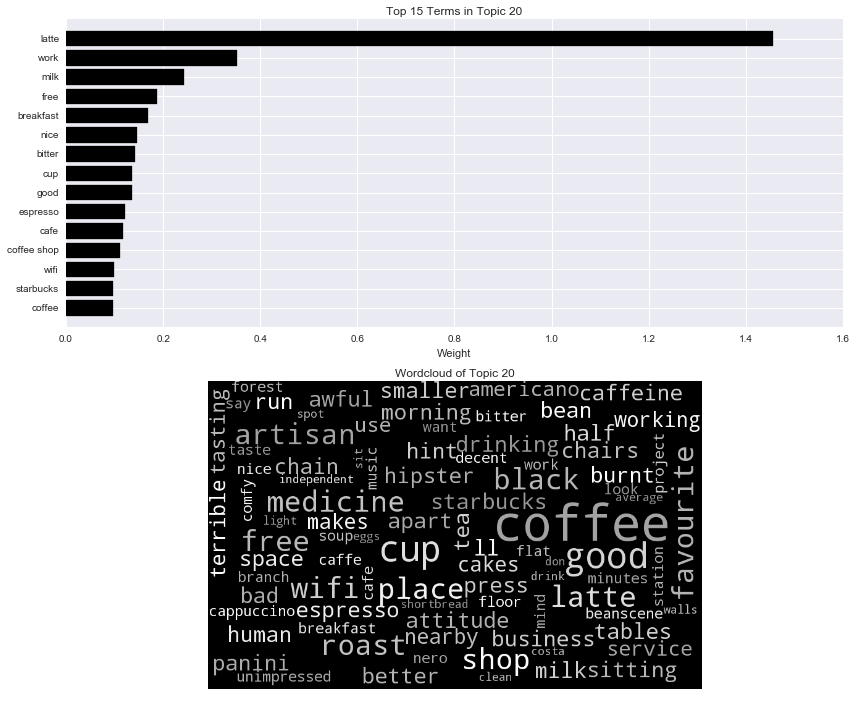

In [331]:
TopTermsByTopic(nmfmodel_2, features_2, 100)


 Topic 1: 

like really just don ve place bit think know time people love feel want look come thing going ll kind got say things way didn actually old bad make times sure probably did said don know lot wrong places little used isn stuff doesn day better quite yes fact experience chocolate felt having stars work mean big right feels makes long review feel like trying wouldn end pretty seen ve got getting try looks away reason years hard wasn let need oh don like looking star cool amazing won mind best sort guys does new enjoy interesting point exactly don think honest man lovely feeling


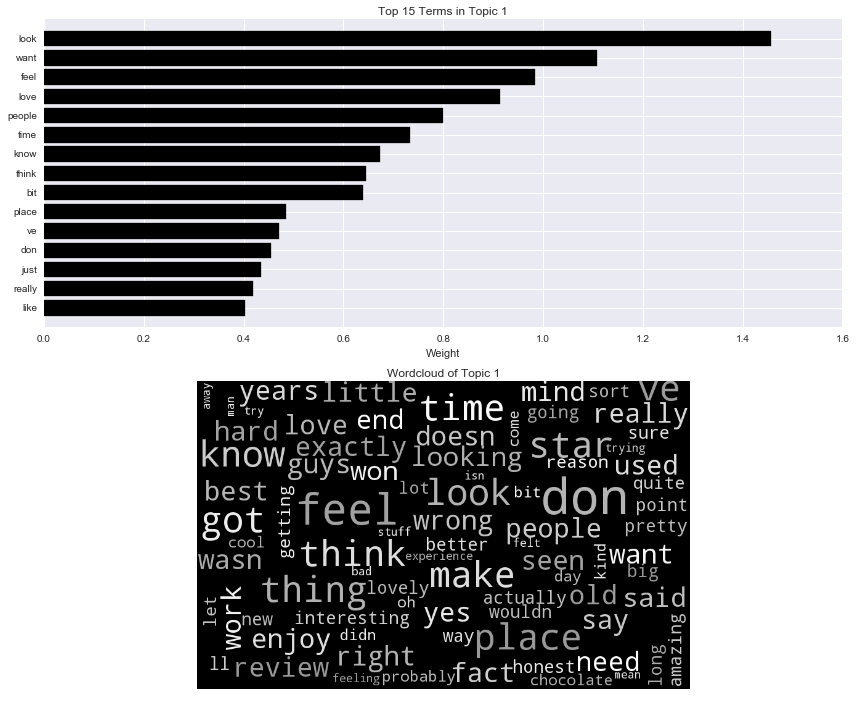


 Topic 2: 

street princes princes street shopping shops centre george george street high street st high shopping centre edinburgh rose just city stores town new rose street mall street shops gardens st james james end street gardens princes st city centre look ocean ocean terminal terminal quite pretty john store area walk john lewis lewis topshop new look upmarket hate probably way little court primark broughton river island broughton street ve island river road tram gyle branch year mean really traffic places location food court definitely lot end princes views far located square james centre close building people doesn famous especially overpriced tend cafes view edinburgh princes outlets street pretty street edinburgh chain castle department street new new town street bit like old town pubs actually phone


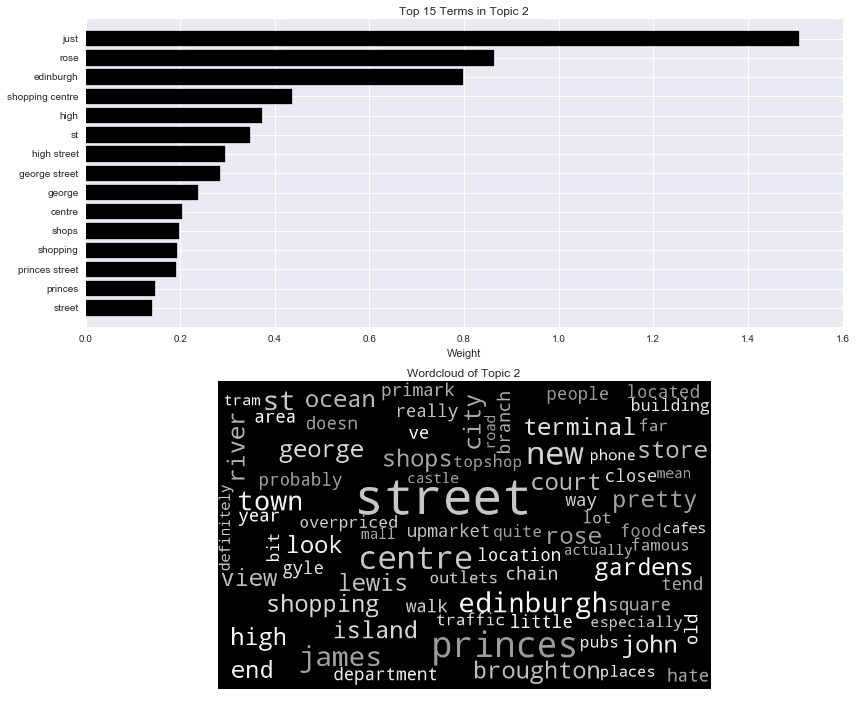


 Topic 3: 

coffee cake cafe coffee shop chocolate cakes tea starbucks hot latte good good coffee morning cup coffee good espresso coffee shops shop breakfast just hot chocolate costa coffees artisan sit sandwiches cappuccino free white place flat white milk pastries try cup coffee fi wifi seating tea coffee work carrot cake coffee just carrot area coffee great coffee tea kilimanjaro scones wi wi fi fine house flat artisan roast great coffee coffee coffee harry potter caffeine potter customers black need roast busy black medicine harry quite day read seat counter coffee house drink slice cream chai brew medicine coffee cake corner places average caf coffee really want strong students check nero outside sweet barista taste edinburgh elephant delicious amazing press review people


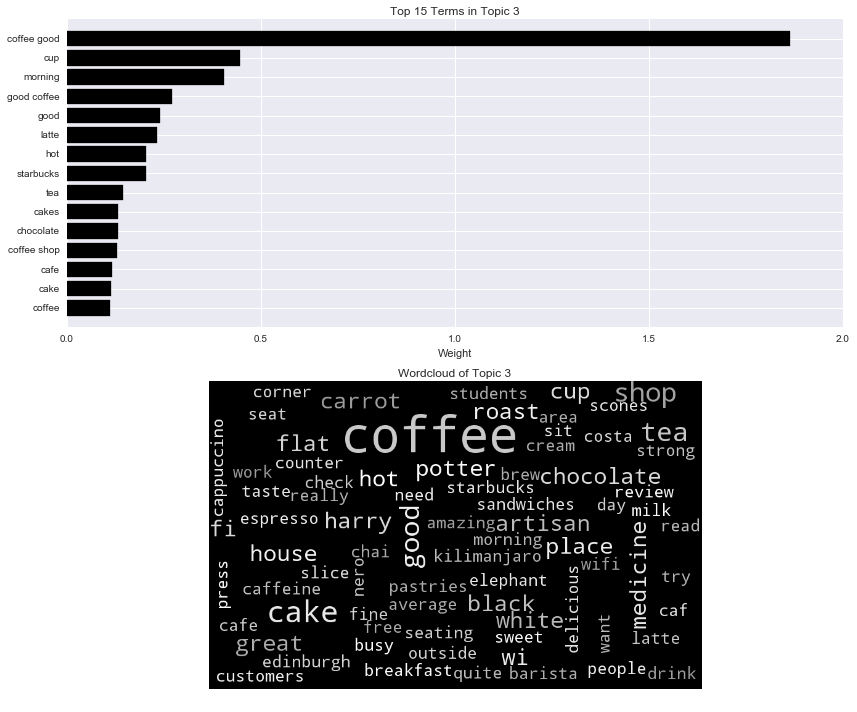


 Topic 4: 

good food service pretty food good place great pretty good quality decent bad good food price selection chinese prices service good value atmosphere average good service restaurant good place better really good fast overall good selection friendly quick slow money tasty good value range location dishes food pretty staff really times value money bit priced portions drinks great food reasonable restaurants quality food fast food decor worth cheap indian menu expensive isn excellent does pricey italian good range order takeaway food tasty good quality reasonably buffet quite beer overall said need service great fresh quite good best food great used good good meal deals staff friendly authentic good great lovely food place good seafood size place food food just service slow eat expect standard good atmosphere recommend particularly fairly vegetarian


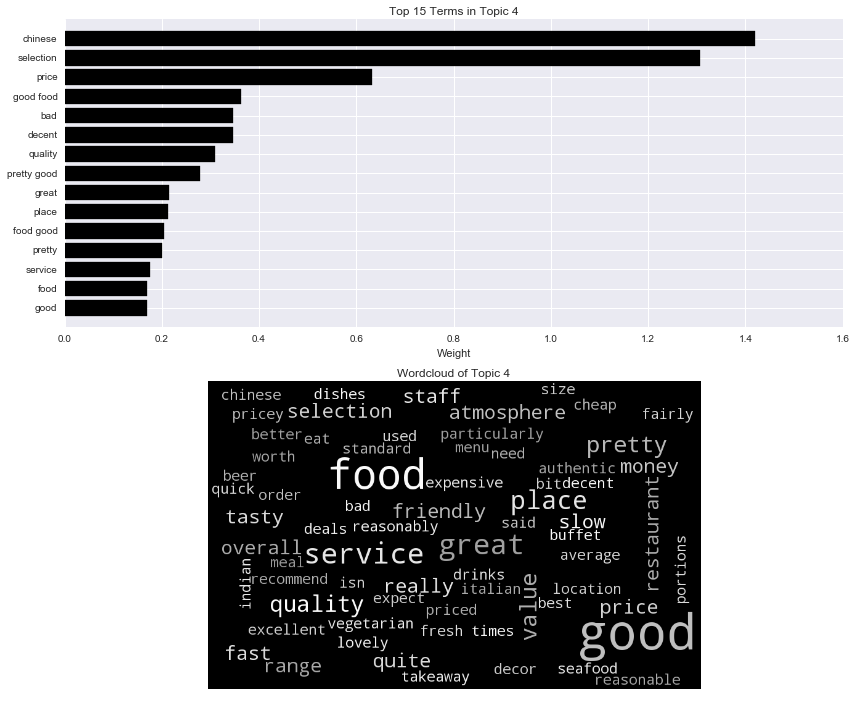


 Topic 5: 

hotel room rooms location breakfast stay bed bathroom clean stayed shower lobby wifi comfortable desk beds great floor staying edinburgh hotels walk hostel great location morning price internet city castle free service reception old close nice staff night time pool tv building excellent beautiful gym slow restaurant check didn modern water good location got tub town noise short located stars helpful access right overall day excellent location area bathrooms parking good nights stairs small dirty toiletries star hotel free wifi apex guest second bath rooms nice towels old town hilton lounge center st inn door size room service nice hotel rooms clean weren dining room hotel just just hotel rooms airport housekeeping people


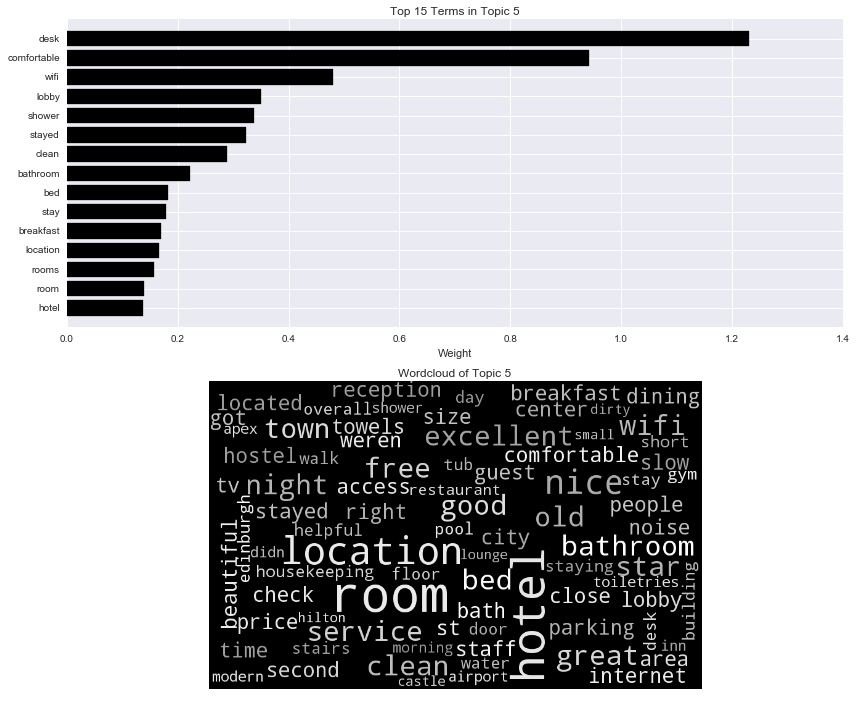


 Topic 6: 

station train train station airport bus edinburgh waverley starbucks haymarket taxi journey waiting trains city platforms platform bus station way stations waverley station waverly right london rail cold glasgow services ticket time early free easy quick going central confusing best means stop grab transportation train stations day clean getting security centre trip ride hour does purpose took construction scotland walking edinburgh airport wait amenities departure loch hours wifi need layout arrived stairs places location morning exit haymarket station tram train journey home far travel flight looking bagel luggage buses sure serves purpose steps work busy lot kill airports sit convenient serves town information shops waiting train seats located entrance


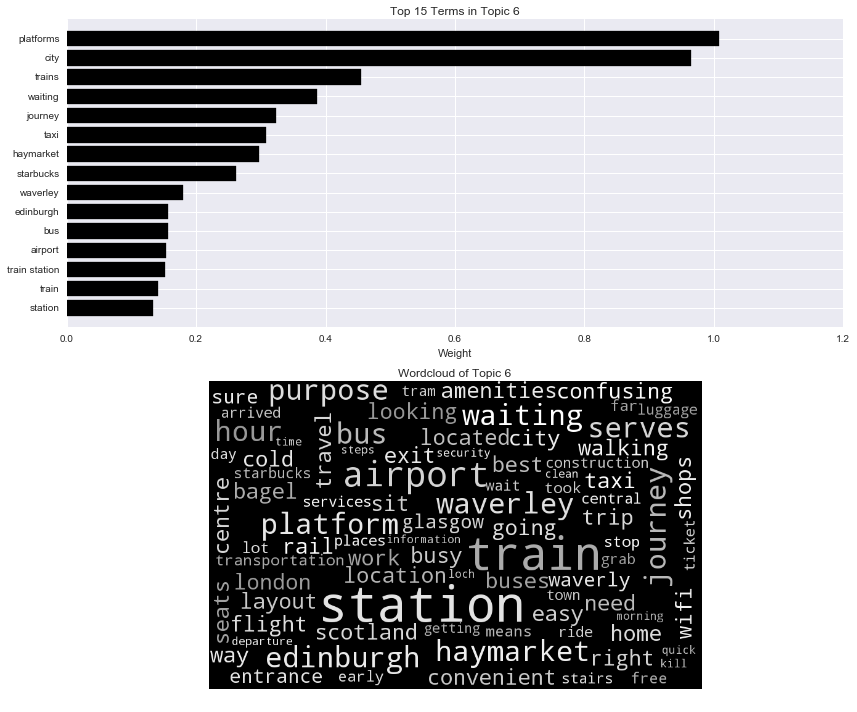


 Topic 7: 

bar drinks drink beer bars area cocktails bar staff tables beers cocktail night quite seating busy staff cheap atmosphere space table evening quiet people small seat students visit fairly bar area drinking pint sports place menu selection sit couple locals feel gin cosy wee served student clientele group old spirits garden beer garden dark wine bit prices plenty big wall bar good make pints looks chat seats booze downstairs pretty way football town chairs screens comfy meet friendly toilets decent interior having choice large standing plus outside sun ideal tap sofas friendly bar tv glass summer bar quite happy good bar offer bar bar slightly time long cool


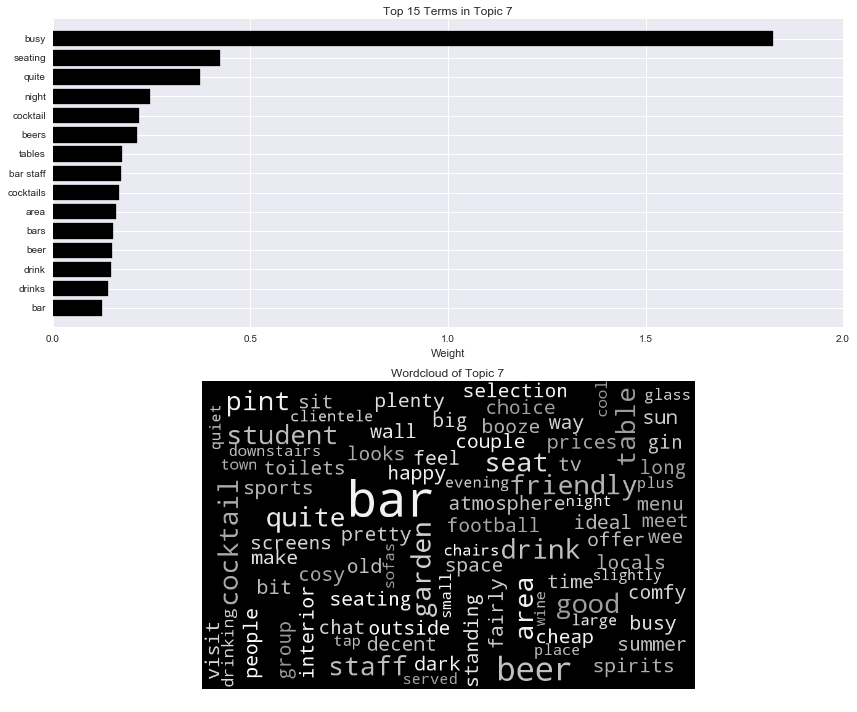


 Topic 8: 

pizza italian pizza express pasta express pizzas toppings cheese italian restaurant branch good pizza area base mamma quite pizza pasta better cinema quick restaurant usually night takeaway italian food bella italy delivery pretty cheap time la favorita choose visit bread eat calzone grassmarket slice ve chain usual does pizza don olives connection offer salad slightly home decent eating seafood dough ordered la favorita italia review delicious tasty garlic great bella italia crust zizzi pasta dishes offers grease fresh leith centre topping pepperoni late fast food free best inch fast dishes ocean went ocean terminal bases variety expect want pepperoni pizza terminal restaurants friendly particular wine busy bite kids definitely risotto pasta pizza particular branch


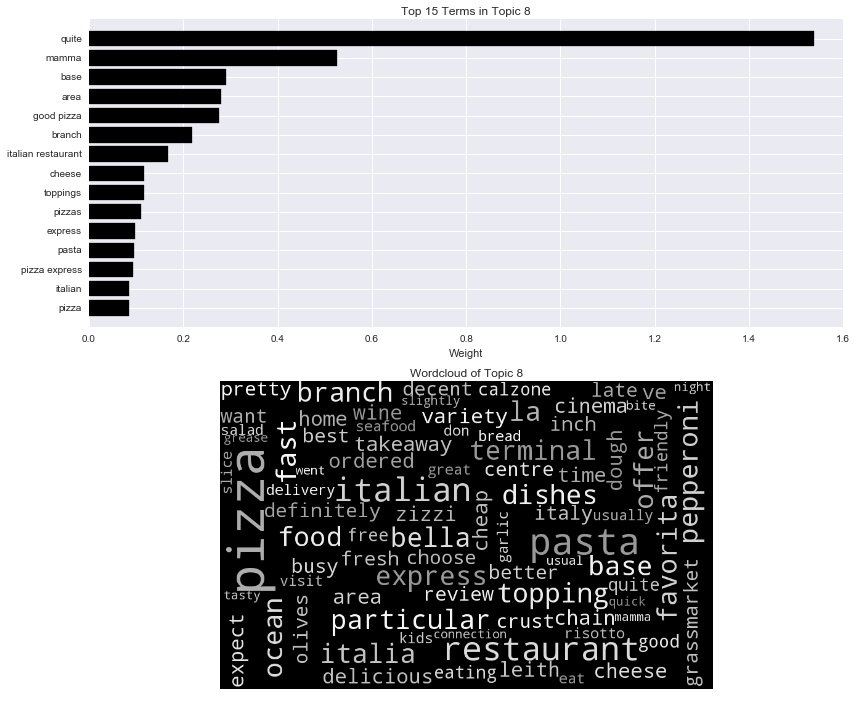


 Topic 9: 

pub pubs pint traditional ales selection beer old grub pub grub ale beers decent drink local locals standard quiz football real pub quiz standard pub friendly atmosphere pub food traditional pub decent pub outside old man scottish area prices students real ales man pub pub good quiet student drinking does good selection good pub crawl inside local pub tap watch pretty drinks spirits pub crawl regulars game man haggis tv pints just average nice pub range feel watching pie good rose older garden sports reasonable folk expect grassmarket men eat real ale beer garden lagers tourists staff friendly serves tavern isn lager fairly gastro scottish pub evening selection beers pub really match special pub like wide malt screens world cold wee average pub


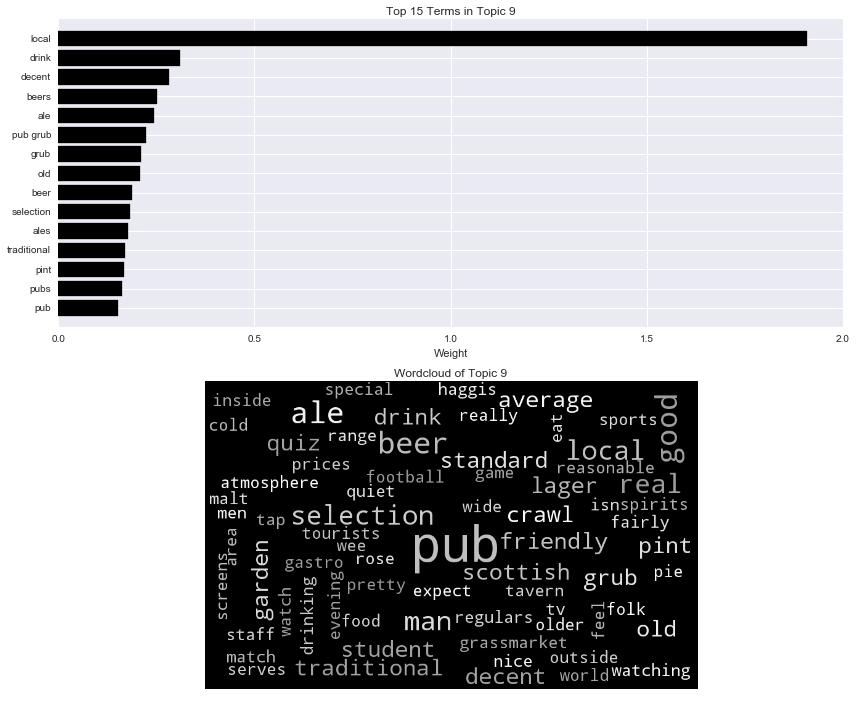


 Topic 10: 

und die ist der das es nicht man sich auch ein den zu mit sehr aber im ich wir sind f_r gibt hier war einen haben des zum auf gut gibt es nach eine etwas essen wird da von aus dem leider hat recht wenn einem bei eher allerdings nur oder dass als alles kann noch vielen um preis sollte weil schon anderen dazu wc hilton witchery waterloo mal vom muss uns ca hotels flair que tag en personal edinburgh la el hostel klein ins los brown calzone whisky et una mcdonald hotel international est taxi land grassmarket old man pro pie


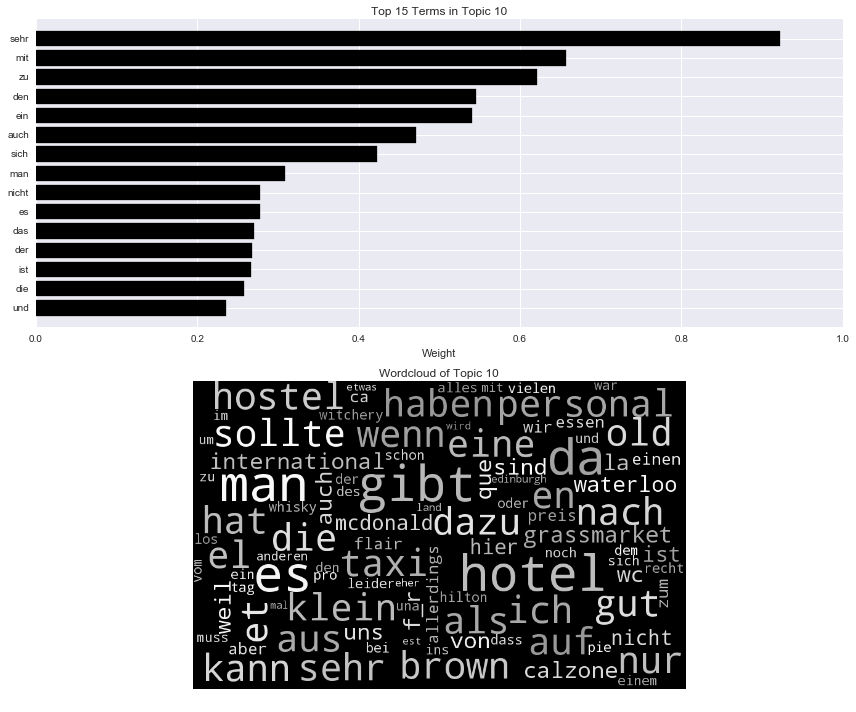


 Topic 11: 

nice tea staff little friendly place really nice place great really nice staff friendly atmosphere afternoon quite cake bit afternoon tea lovely selection nice little cakes staff nice quite nice friendly staff scones nice atmosphere place nice went pot inside wine wee expensive cozy feeling decor food nice clean looked dry little place scone nice staff simple friends outside cup looking staff really drink nice selection cold little bit sweet warm cute lot liked unfortunately large helpful pot tea caf stop okay cup tea cocktails nice inside really friendly cosy welcoming nice food nicely didn wasn table recommend did busy nice friendly super quiet small pastries nice looking pleasant decor nice pastry modern touch waitress cute little friend dont tea nice eteaket jam friendly helpful nice bar huge


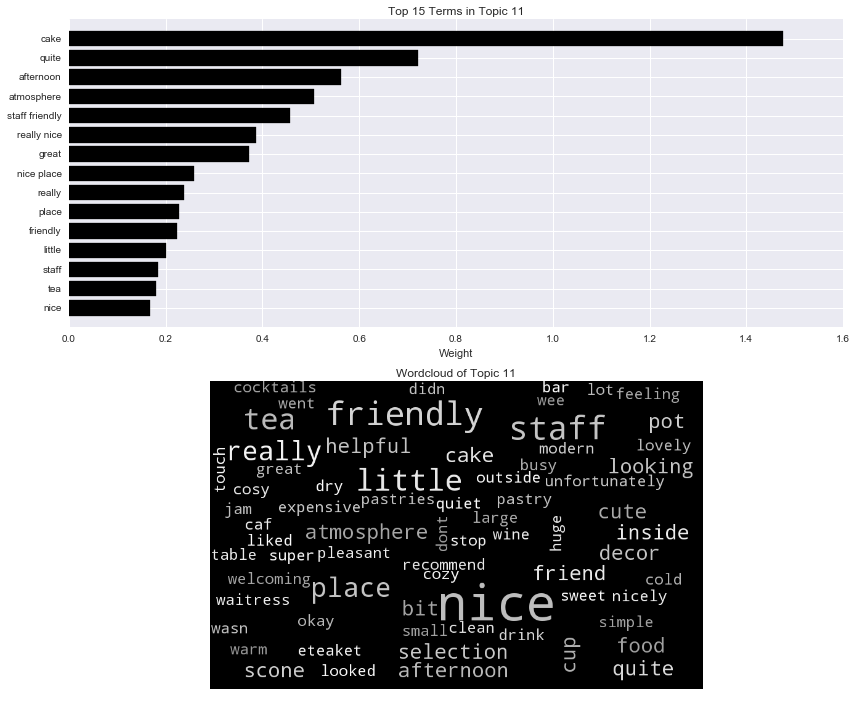


 Topic 12: 

fish chips fish chips chip chippy steak fried pie portion chip shop good decent greasy batter pizzas battered just peas pretty deep chips good quite crispy cooked really menu rapido fish bar ordered chips pretty supper deep fried mont tony ve fish chip soggy wasn chowder standard okay mushy peas best haddock salad suppers fish supper fresh mushy chips fish nice cheese inside mars fair dinner city probably sausage places mars bars outside bit meal price takeaway eat cod ordered fish usual american sausages rare quality prices chips like haggis edinburgh experience pretty good fried mars wife tasty fish goat cheese sauce chips chips good fish goat really good say chippies steak pie dogs seadogs tastes burgers bit greasy perfectly fry grilled


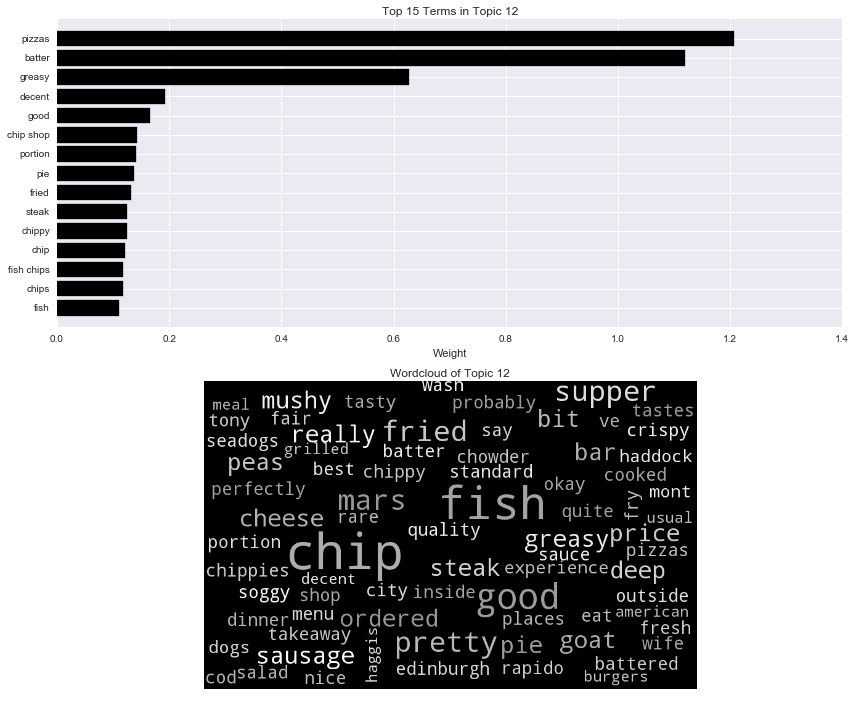


 Topic 13: 

mile royal royal mile castle scottish tourist whisky tourists edinburgh tour scotland little cafe location haggis view touristy walk museum old city history edinburgh castle tartan interesting guide celtic walking jewellery town traditional right pubs tourist trap world away right royal trap traditional scottish spot scotch pint old town located selling souvenir ness rest tass worth just royal experience way upstairs tours parliament did albanach historic loch location royal overpriced camera probably people best end shops scots expect attraction views mile edinburgh building middle visiting free open nice view tat palace live located royal insight canongate obscura camera obscura visit stop better going thing minutes situated church cashmere shortbread deacon crowded world end


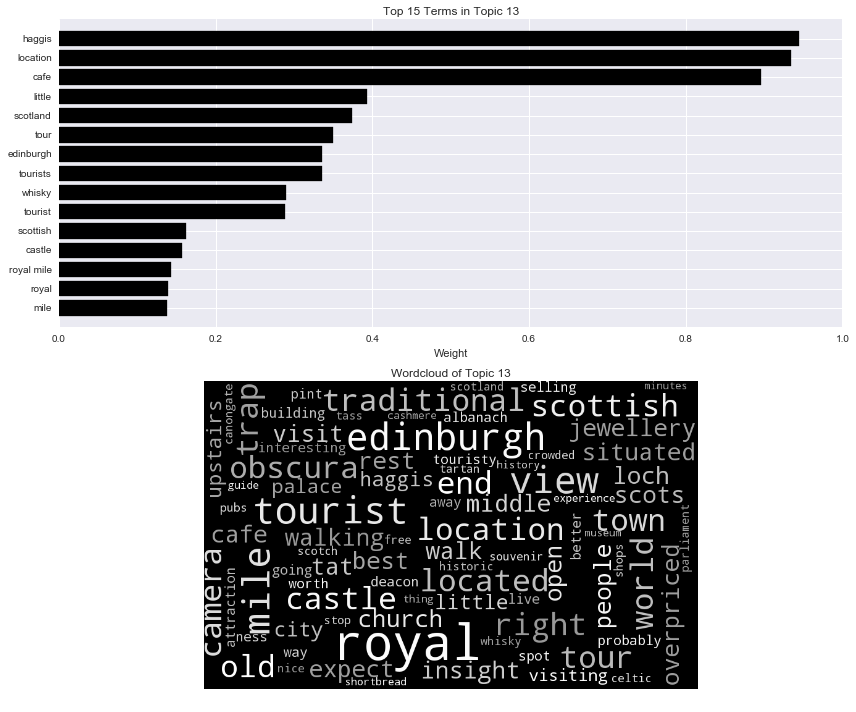


 Topic 14: 

shop store items shops range stock buy clothes stuff clothing books sell gift selection cheap looking shoes things prices expensive bargain need products small offer stores good sells cards buying does jewellery section look quite price charity quality browse selling boots accessories sale staff pretty gifts sort brands card ll cheaper bought branch little independent new goods christmas great expect gift shop stationary high lot shirts isn big good range pop vintage worth large wear helpful pair stocks want fruit bit hand offers item huge different area pick usually edinburgh help toys paper second hand department various reasonable games priced fashion fairly like


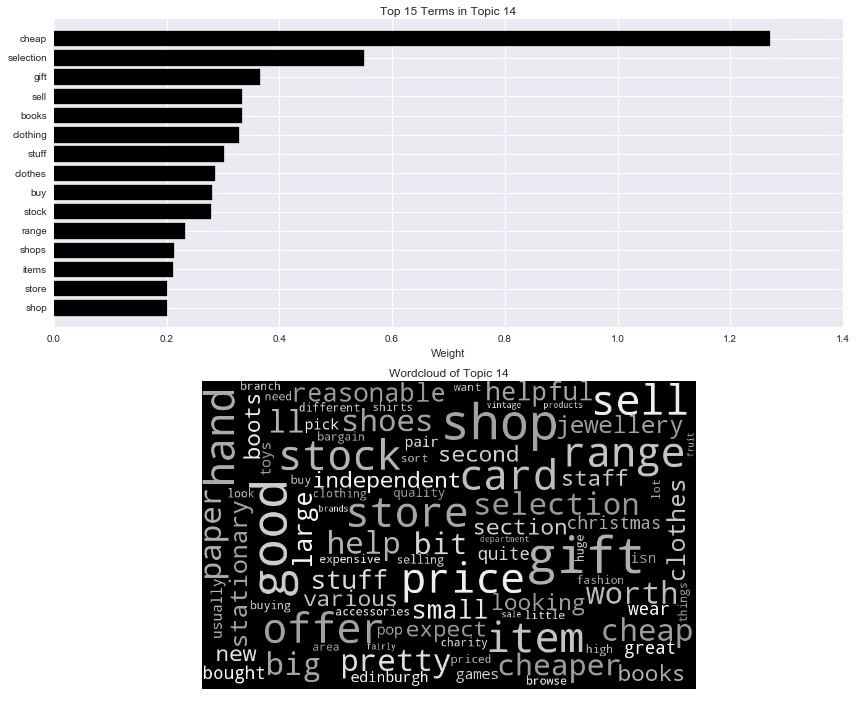


 Topic 15: 

burger burgers chicken fries bun cheese chips beef onion chicken burger rings american onion rings cheeseburger came meat did patty beef burger order fast tasty taste good menu bacon red beer cheese burger just salad burger king fried veggie holyrood sauce fast food really diner options king burger joint frozen gourmet burger chips best burger fries standard falafel like southern mustard bit opted went liked joint burger bun burger came ordered ones beef burgers got potato burger ok right dry actually sweet potato burger good half burger place specials try served cheap food visit blue sweet coleslaw delicious burger menu style joints special greasy work wasn squirrel things quid fan lettuce selection veggie burger burger really tomatoes big milkshake


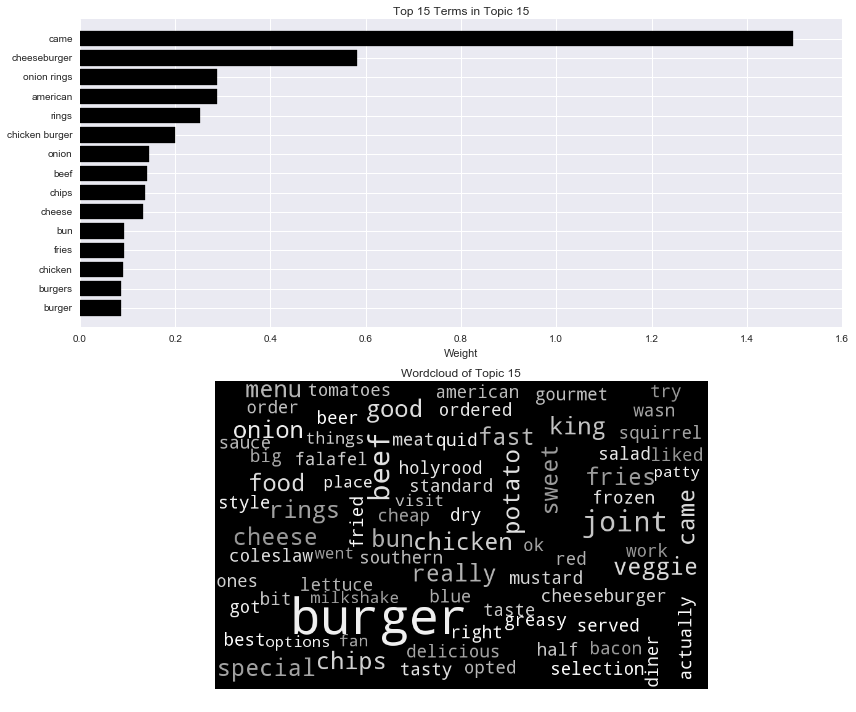


 Topic 16: 

restaurant table menu meal ordered chicken came dishes food sauce main dish didn wasn order tasty rice wine did steak went starter dessert dinner service served meat arrived pork lamb waitress cooked course quite delicious asked curry cheese bit lovely just try starters small little waiter experience flavour beef cream thai left taste courses fine tasted dining eat friend took tapas salad got felt enjoyed stars thought indian duck time wait spicy mains wanted minutes dry looked night think ice main course plate decided overall evening voucher tables disappointed hot bland portion kitchen pudding finally waiting long said chinese restaurants seated


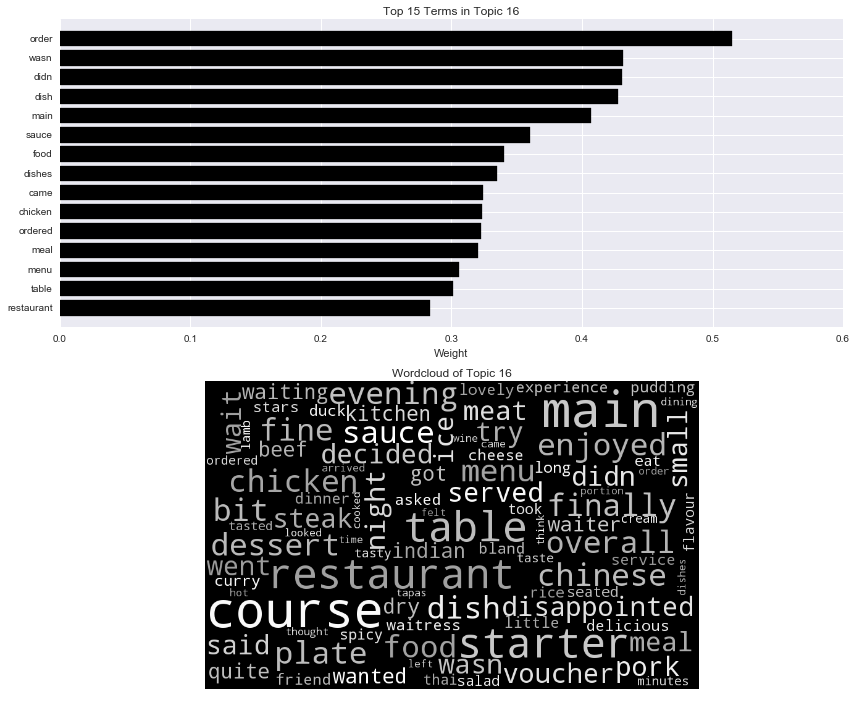


 Topic 17: 

post office post office cards post offices magazines offices road staff stationary friendly parcel services card pretty busy work isn open posted paper service job packaging grange need long letter stationery students decent located mail convenient local queue forrest does forrest road helpful queue long later gifts number gift standard friendly helpful tourist wrapping staff pretty really complain money wrapping paper event exchange needed send related store handily predictable pretty friendly shoes apart close provides say staff fayre west don staff friendly birthday things early feels quite university gift shop items basic selection sell basically sending particular does job pleasant serving notebooks needs eclectic complain wish hall hours wasn amazing area times sells difficult handy


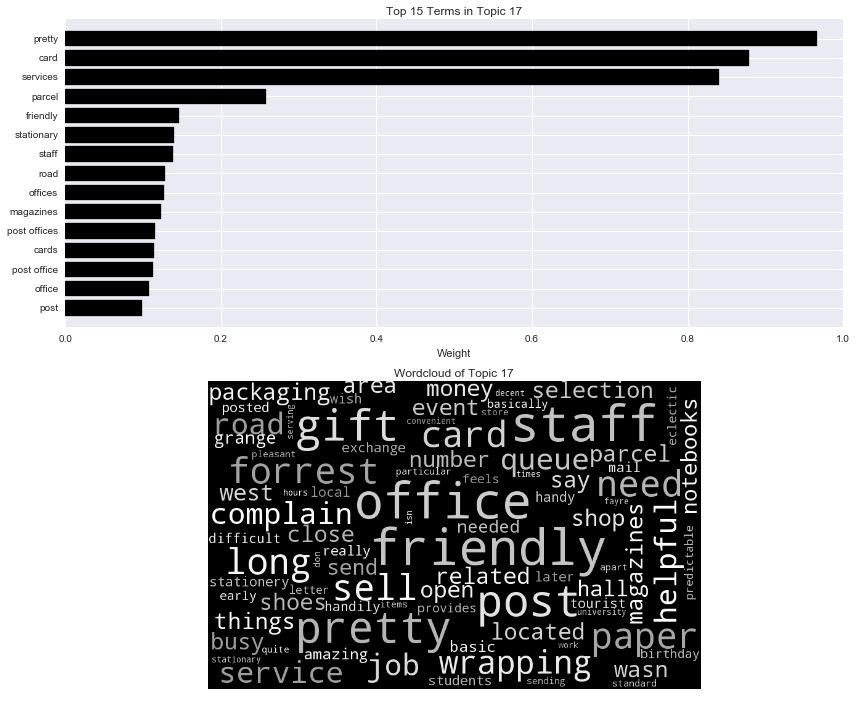


 Topic 18: 

lunch soup sandwich breakfast cafe sandwiches salad bacon menu bread day quick roll time options eggs deli sushi tasty brunch lunch time baked rolls fresh cheese toast hot delicious eat salmon great filling potatoes place soups area looking offer potato salads choice today panini option lunchtime pancakes cheap outside deal visit egg new wee lunch menu fillings tables decent paninis soup sandwich popped tomato scrambled try cakes chicken baked potatoes pop grab inside sit choose lovely scrambled eggs morning bite friend pleasant came vegetarian quick lunch breakfasts toasted free big special small spot tuna hungry fruit juice healthy snack little enjoyed decided avocado wrap opted got


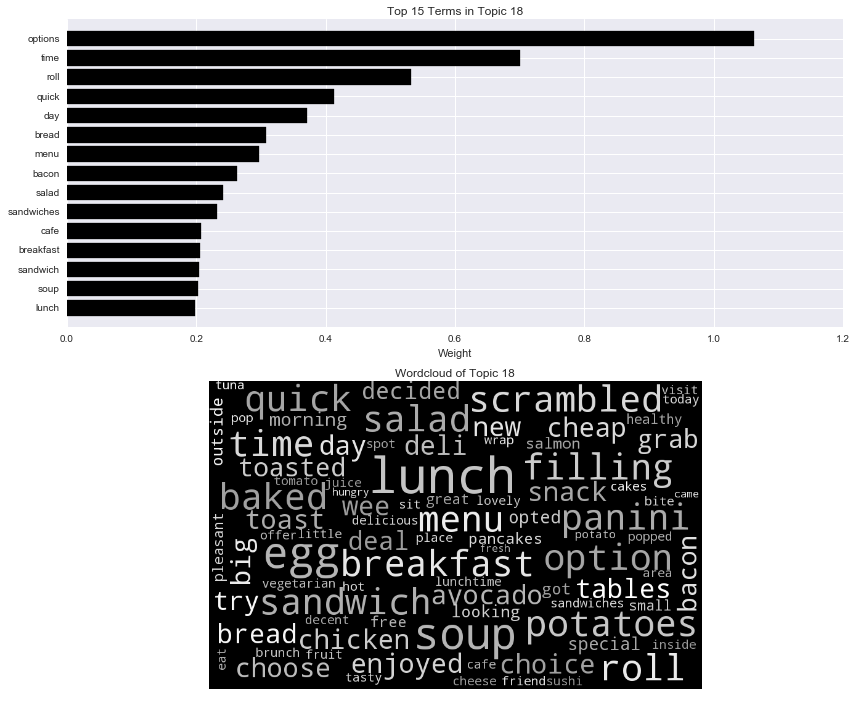


 Topic 19: 

music night venue club dance live place great drinks live music fun nights people edinburgh floor gig time dance floor band dancing good loud friends student group crowd week pretty students cheap bands stage quite year playing big rock going sound room late cool venues hall karaoke play large lot atmosphere drunk years evening entry drink hit good night usually clubs house open event tunes girls space best probably folk gigs start definitely popular upstairs played used door great place area scene head decent ago sort busy actually miss dark lots party shows went university great time ll festival dj fringe events young ve getting


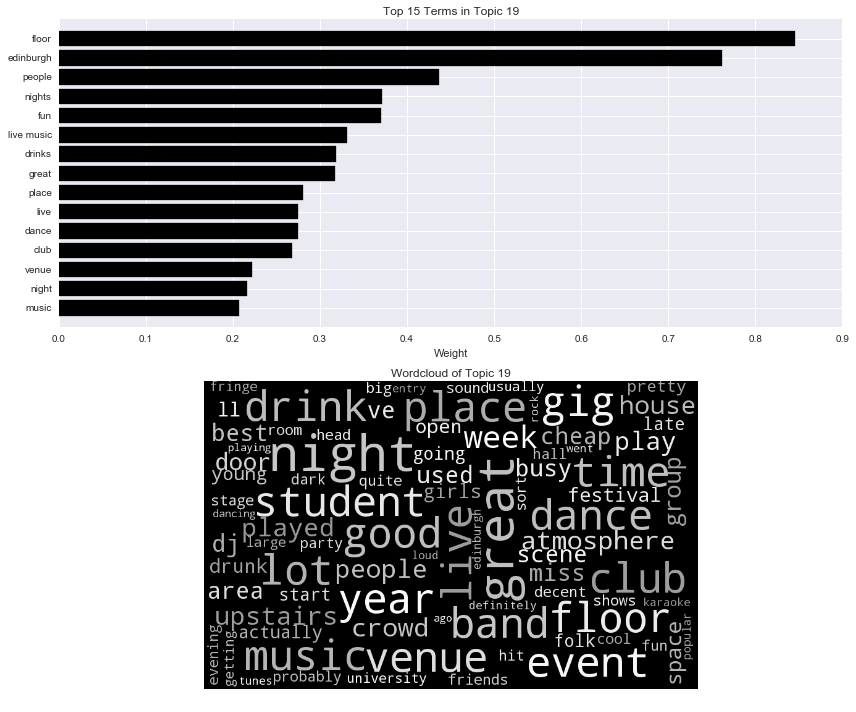


 Topic 20: 

ok food ok just ok better place ok place ok place got bit special average food bread just ok just gf ok bit great food bad wow guess service ok probably staff ok ok better coffee ok ok special ok great meh overall ok service free mean yes based gluten great ok really dinner ok good list wine list alot husband mexican airport gluten free price star dated standard queues kids overall rosemary feeling ok food better average better food building review drinking tough say summary sure weird stairs hate flight reviews ok little thai prices bagel bloody hype shopping view pretty standard rude yeah tastiest decor honest fine drinks experience price reasonable underwhelmed prices ok bit tough did glasses ambience curry touristy dont food court bother


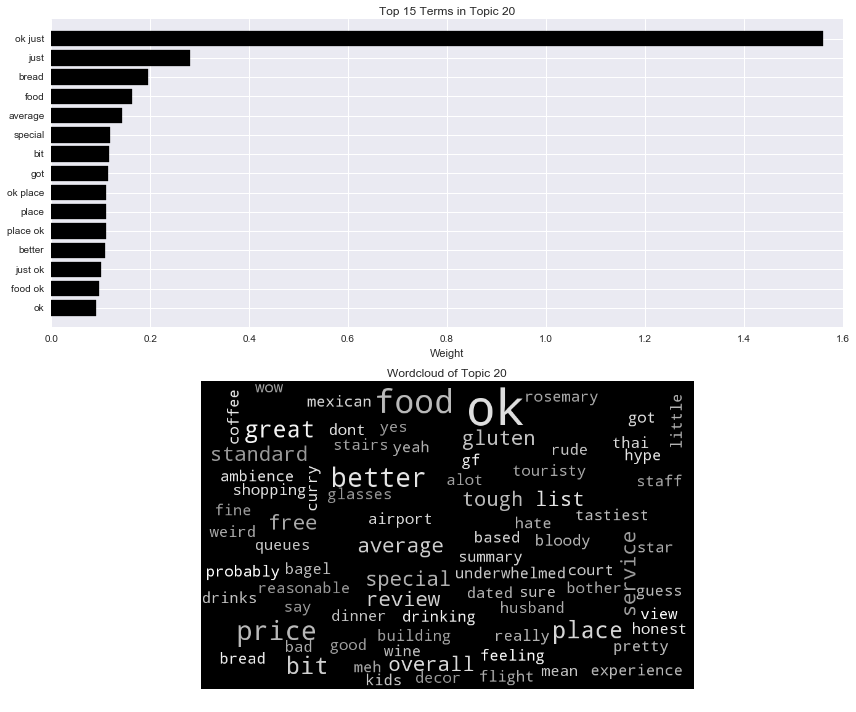

In [332]:
TopTermsByTopic(nmfmodel_3, features_3, 100)


 Topic 1: 

like ve really just place don bit time know think people ll feel got love things going want come thing say quite didn way actually make times little pretty need look day big did fact sure lot said stuff kind work probably long cool different makes getting yes feel like better try home places used let new looks years year old review away doesn don know having isn right looking stars happy mean bad seen thought far fun felt oh remember does best order coming amazing space really like hard life huge reason half ve got friend free days open friends lots usually ok


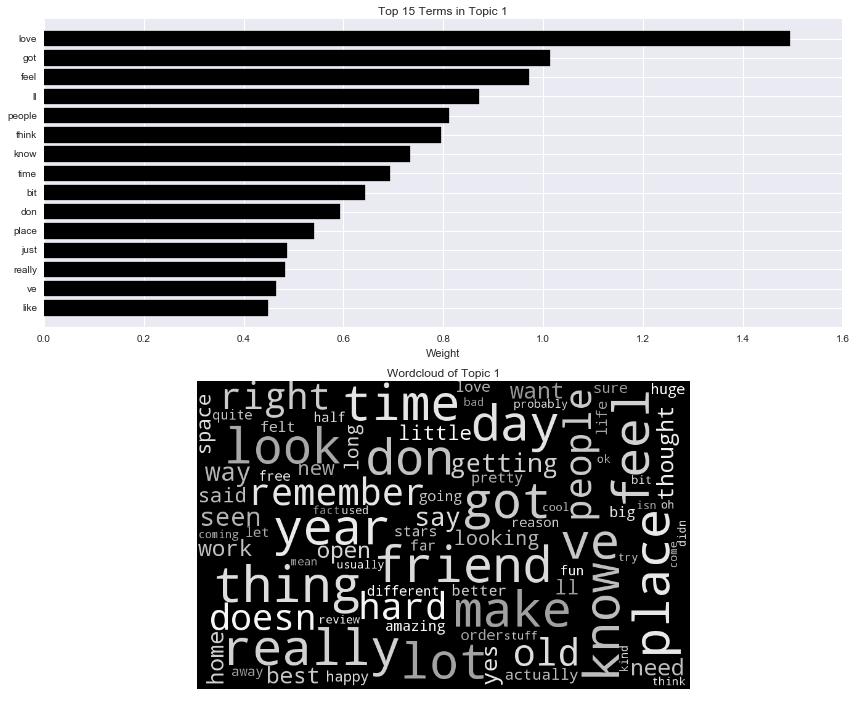


 Topic 2: 

shop store books items range shops stock little gift charity buy quality clothes selection looking prices clothing cards section jewellery sell high look book gifts stuff browse stores need shoes bought products offer price buying things charity shop sells cheap expensive small sale cute shopping accessories want toys staff hand dress worth gorgeous lot quirky new dresses selling card charity shops like pick vintage street reasonable little shop old money second hand helpful collection help stocked local different gift shop quite variety owner unique stationary come including bags friendly goods browsing independent love just area bargain brands certainly best high street large offers shirts available corner


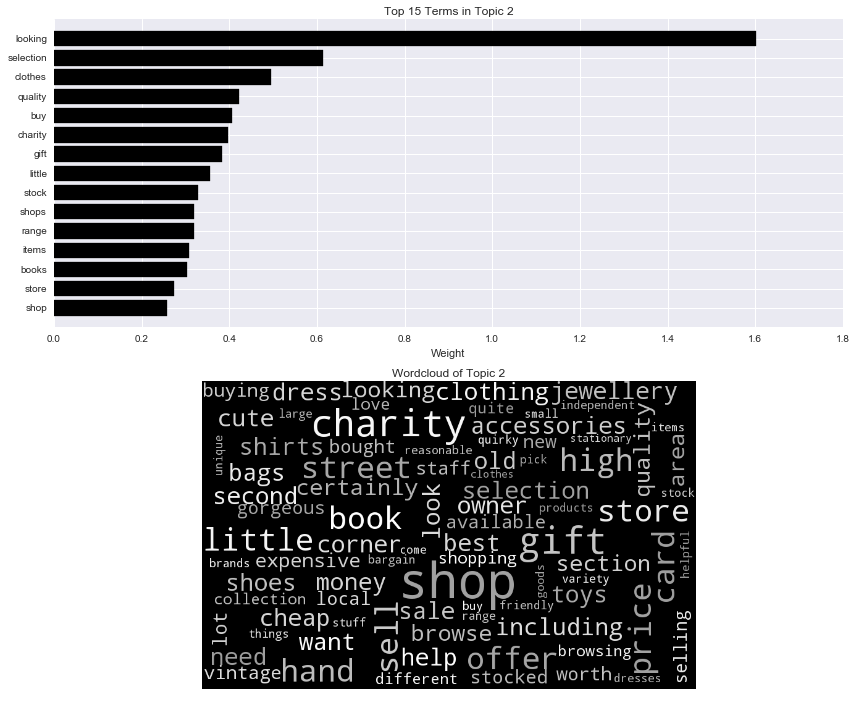


 Topic 3: 

coffee coffee shop cafe starbucks good coffee great coffee flat white cake flat cakes white nice wifi artisan sit latte cup espresso lovely artisan roast roast costa seating coffee good coffee shops friendly tables shop coffee great little small morning beans seat milk drink area free wee pastries caffeine place seats perfect scone sandwiches town coffee house coffees black medicine medicine coffee cake enjoy better cup coffee delicious black work brew cappuccino scones staff spot space best coffee house window cute nice coffee free wifi caf strong croissant coffee just little coffee barista outside away takeaway coffee place places baristas atmosphere sitting decent coffee inside just wooden come tea coffee quiet filter chairs decor feel hipster decent open busy lab


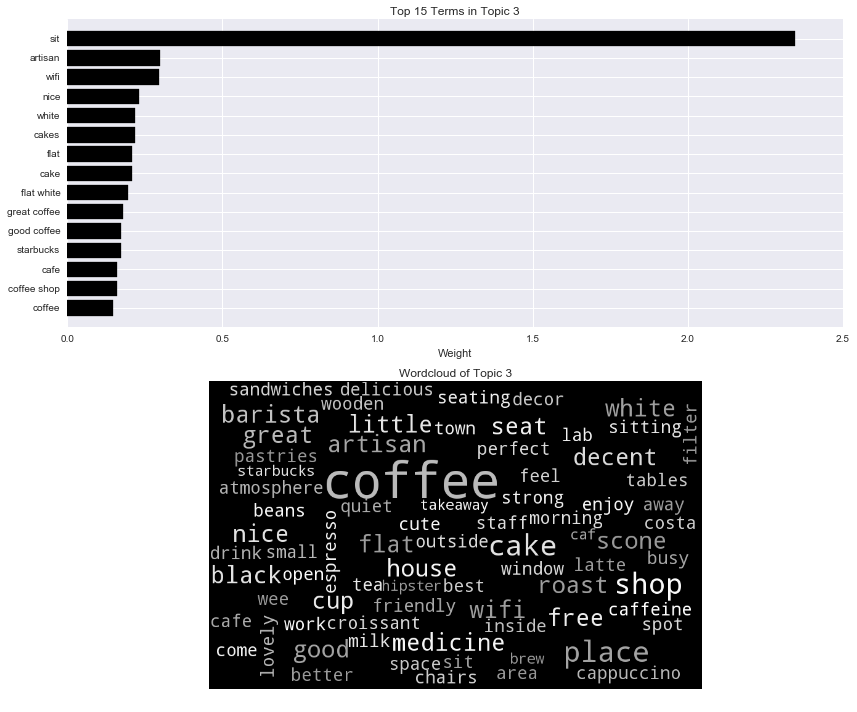


 Topic 4: 

great place great place staff selection friendly food great atmosphere great selection great food great little great atmosphere great service place great fantastic location friendly staff service great really great really little staff friendly great location staff great friends music fun service wine people love great beer kids great value beer lovely great coffee great staff amazing great range great wee loved enjoy wonderful huge little place great time worth beer great makes work great price lots meal overall great super atmosphere great selection great scottish great meal views recommend great quality stop great people cozy decor great fun great night meet really friendly coffee great great experience recommended inside great view live group helpful value place come definitely outside great pub drinks visit music great great deal vibe price great fab spot night time great music friendly great great prices edinburgh great watching menu great


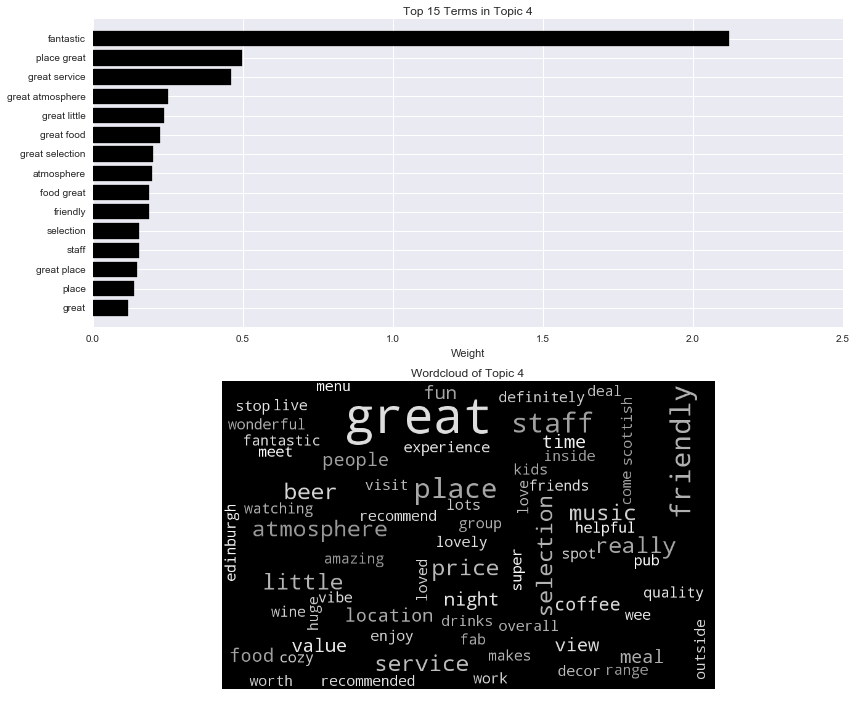


 Topic 5: 

food service quality excellent good food restaurant food good friendly indian quality food prices fast food great tasty food service friendly service atmosphere great food price delicious reasonable indian food eat service good recommend priced chinese mexican quick food excellent fresh good service portions authentic service friendly slow tasty food order cheap amazing takeaway italian reasonably mexican food try ve staff excellent food hot restaurant food stars decor dishes prepared reasonably priced times fast food recommended drinks food really pub food food menu restaurants certainly high great service food delicious best come menu food drink meal service excellent food friendly highly better place expensive pleasant standard say delicious food food nice excellent service reasonable prices meals edinburgh service food delivery eating friendly food average away food fresh service great serve impressed places food quite reasonable price


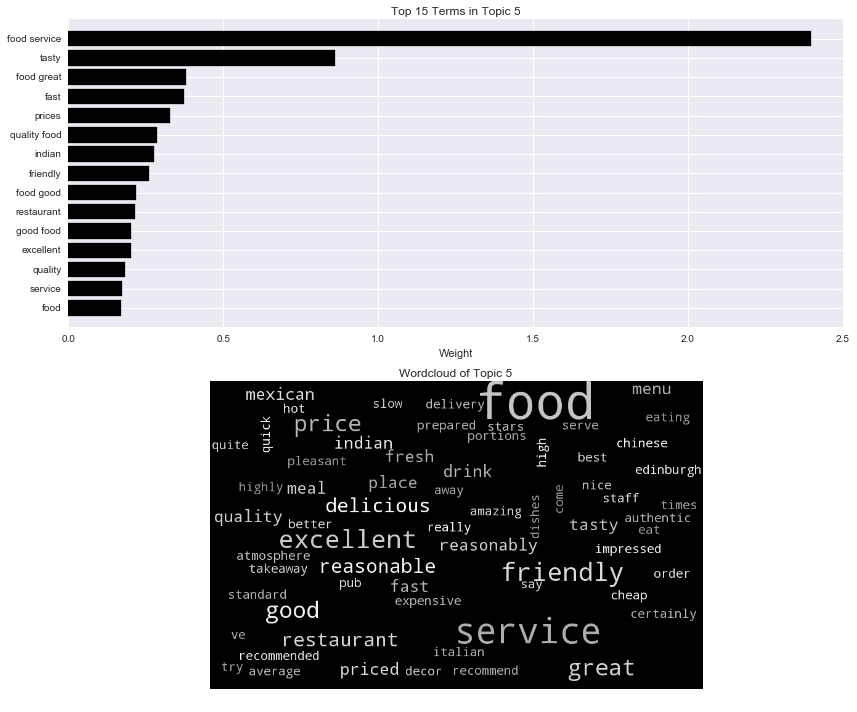


 Topic 6: 

fish chips fish chips chippy haddock chip haggis fried pie batter battered chip shop steak cooked best supper fresh greasy peas fish chip excellent sauce portion best fish fish fresh seafood tasty deep deep fried crispy chippie delicious pudding good fish fish supper mushy ordered fish mushy peas steak pie cod ordered traditional eat special crisp vinegar mussels haddock chips chips fish perfectly sausage order sure kebabs place seadogs toffee served brown sea sticky toffee chips really chip shops fresh fish ve dogs toffee pudding salt portions fish bar gravy wife flaky world good chips takeaway late stars way chippies sticky soggy chips good scottish brown sauce try just chips great mars fried fish tasty fish world end generous potatoes right enjoyed salad like fish sauces decent


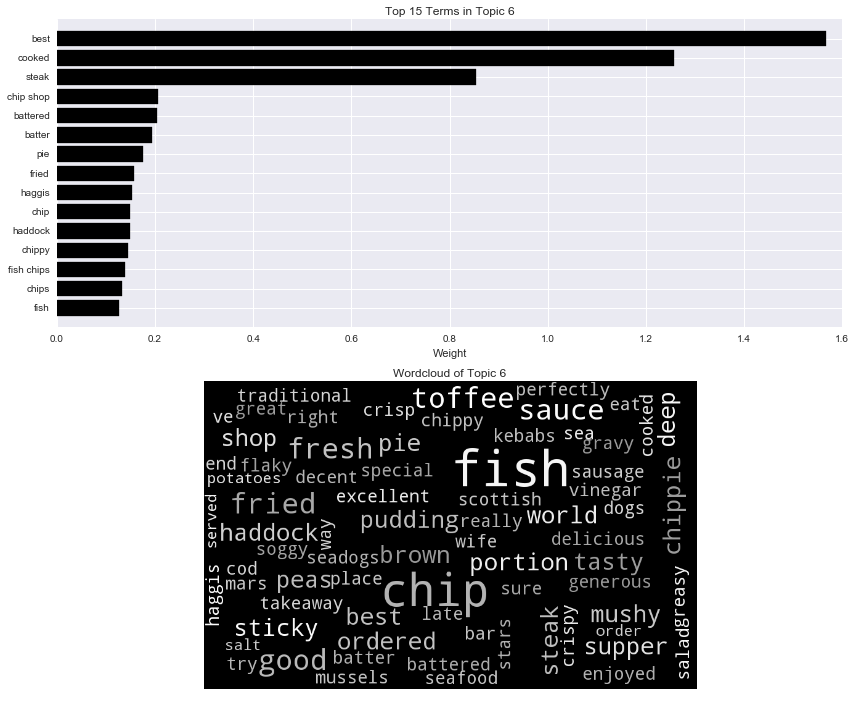


 Topic 7: 

restaurant menu meal chicken dishes wine dish sauce ordered curry dinner delicious thai main lovely rice table went came steak starter meat tasty cooked dessert nice definitely spicy pork course lamb enjoyed served didn mains starters indian wasn did little salad portion courses friend try small beef dining quite bread bit taste night just plate lunch flavour arrived sweet restaurants vegetarian time duck glass visit order bottle seafood red waitress evening cheese decided tender perfectly garlic cream mussels attentive waiter prawns thought opted experience fried overall prawn took portions tasted set options italian naan large really pudding tapas looked list


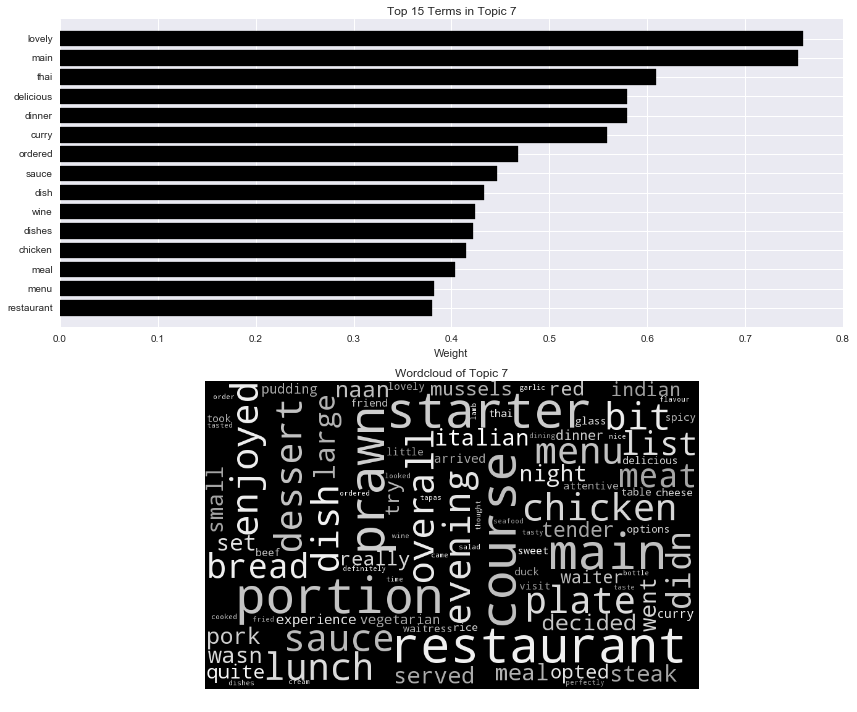


 Topic 8: 

und die der das ist mit ein es war sehr auf ich nicht auch eine zu aber hier f_r gut von sich man den dem etwas einen kann im wir nach freundlich gibt essen waren la sind wirklich des nur alles auswahl als que bei en vor freundlich und da dass einer et werden einem zur personal vom aus dann noch stadt zimmer wie keine schon wird le est gibt es allem auf der um flughafen ganz mal zum hat oder wenn les whisky ca los wer para ne laden vous er el trs edinburgh pour du pas hotel andere une ja je


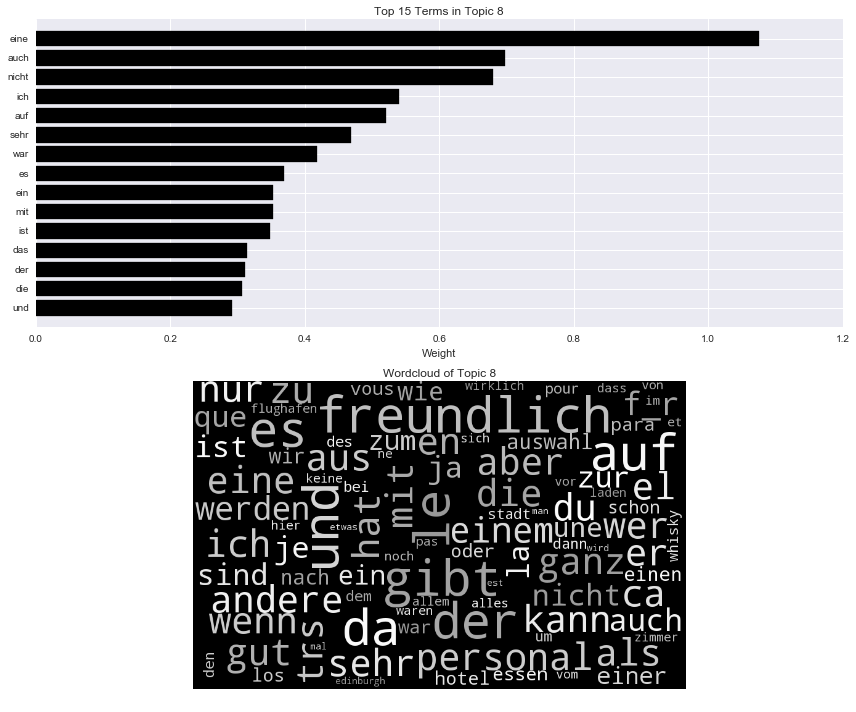


 Topic 9: 

royal mile royal mile tour castle whisky history scottish tourist tourists guide museum haggis edinburgh just royal scotland scotch whiskey touristy tours interesting edinburgh castle palace tour guide tartan close et cafe ghost walking giles just visiting pubs cathedral historical visit end audio fudge did worth location whiskies sure informative mile great stop right tasting enjoyed beautiful locals highly located information way tourist trap est admission les right royal recommend trap story le day different end royal yacht vaults stories la st giles photos experience little ness course trip mary holyrood definitely people especially learn st trs britannia royal yacht perfect museums tatties view audio guide located royal scottish breakfast du ride underground


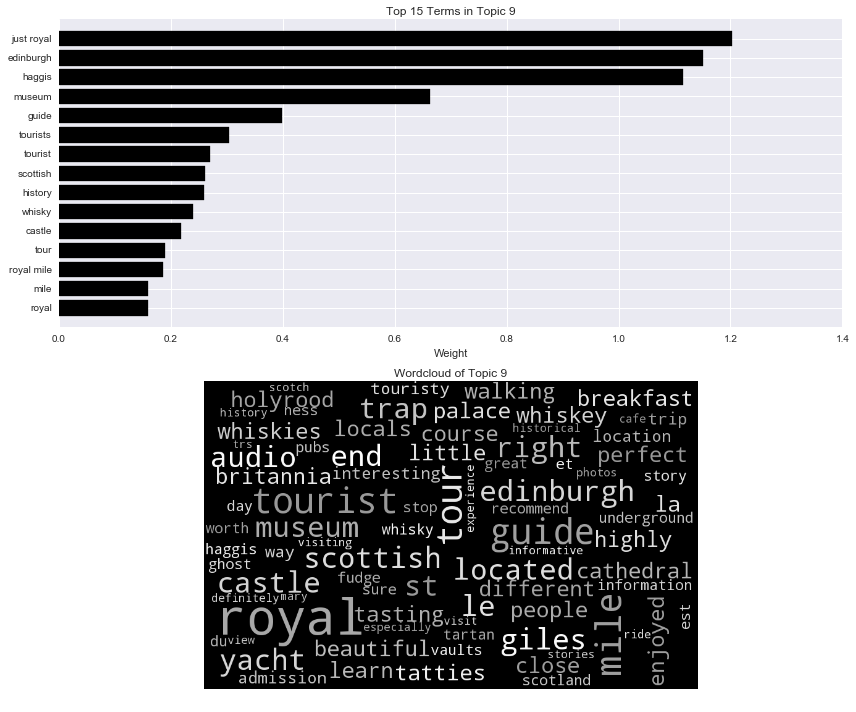


 Topic 10: 

tea cake afternoon afternoon tea cakes teas scones pot lovely cup scone cup tea sandwiches cafe nice pot tea delicious little tea coffee tea tree table try slice tree tea tea tea tea room jam loose tea shop tree gluten gluten free earl grey earl chai cream free green grey eteaket just friend pastries cuppa clotted served cups green tea coffee tea came clotted cream milk sweet pots treat iced warm milk tea treats cute carrot atmosphere clarinda selection drink tables cupcakes offer decor bit tea cake iced tea carrot cake tea scone piece opted room apple couldn good tea brownie tea served choice set breakfast tea tea pots got fruit cosy shortbread leaf leaves quick enjoyed loose leaf way champagne bubble went bubble tea


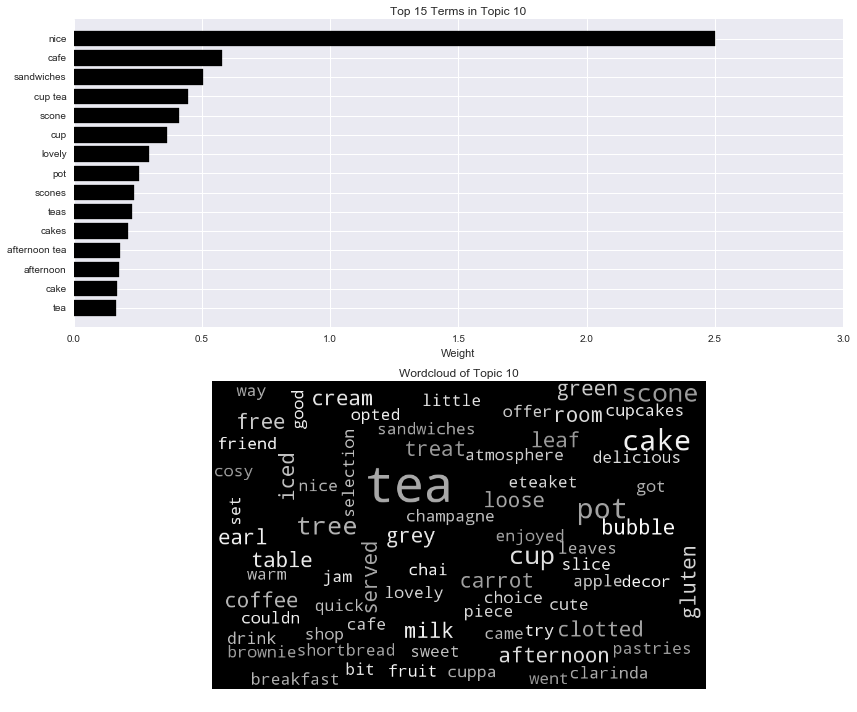


 Topic 11: 

chocolate hot hot chocolate cream ice ice cream cake chocolates cakes sweet fudge flavours amazing delicious dark caramel dark chocolate white chocolate chocolate cake sugar churros spanish white chocolate tree cupcakes brownie sweets milk hot chocolates cafe dessert try cup cupcake hotel chocolat tree chocolat chocolate bars friend salted vanilla got rich salted caramel wee day latte free chocolate soup raspberry just bruntsfield tasted butter marshmallows cheesecake different truffles black shortbread love flavour cocoa strawberry yummy orange gelato taste sell tried chocolatey luca marshmallow coco moist cold artisan creamy treats choose desserts like warm treat lemon counter small tart quite toffee chocolate orange scoop worth slice right bought brownies chocolate sauce went bars


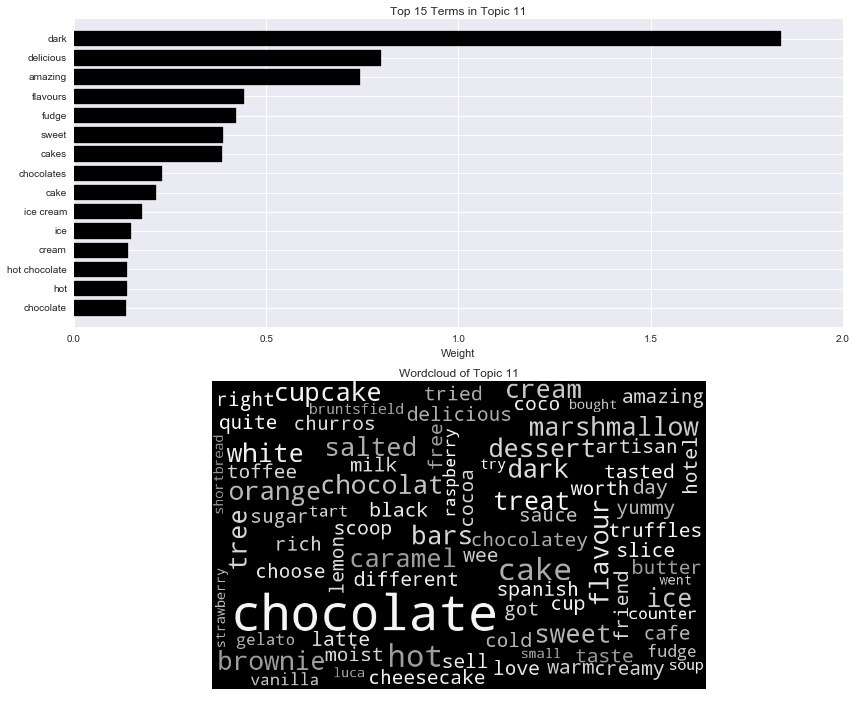


 Topic 12: 

burger burgers fries cheese beer beef bun chicken chips holyrood bacon toppings delicious tasty sauce veggie meat beers fast patty haggis potato gourmet fast food american sweet beef burger sweet potato cheese burger good burger best menu bbq chicken burger came got onion burger fries wasn better wannaburger cheeseburger order definitely juicy relish try blue blue cheese just didn chilli options love pork venison gourmet burger big veggie burger cambridge joint best burger potato fries edinburgh milkshakes ordered burger joint food burgers great meal filling southern option great burger burger king quality cajun eat skinny bbq sauce salad skinny fries grilled onion rings lettuce chunky tomato cut burger really best burgers sure good venison burger red opted places bit pretty way bite


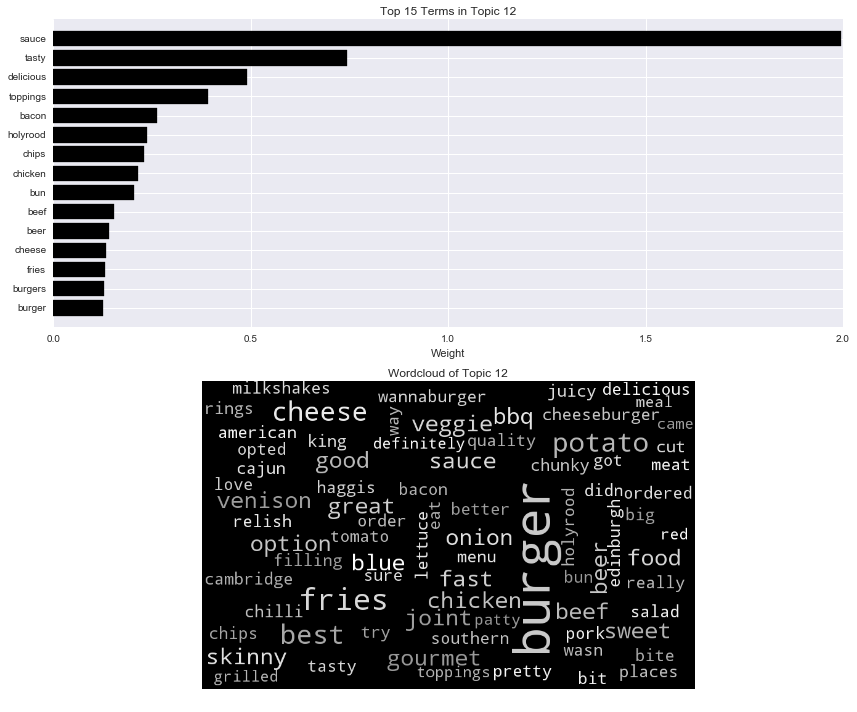


 Topic 13: 

bar drinks night cocktails music drink cocktail bars area atmosphere place cool venue bar staff seating friends tables busy live club nights menu beers student evening live music beer fun quite gin crowd table vodka drinking relaxed small people nice jazz students dance upstairs cosy comfy chairs rock edinburgh booths quiet pint decent cheap try glass space cocktail bar bar area cocktail menu decor band definitely dark week seats loud large george new playing group downstairs vibe feel bar great offer range list chilled staff spirits big awesome wine different sit certainly bit floor trendy bands folk served wee monkey local tunes events lovely priced seat


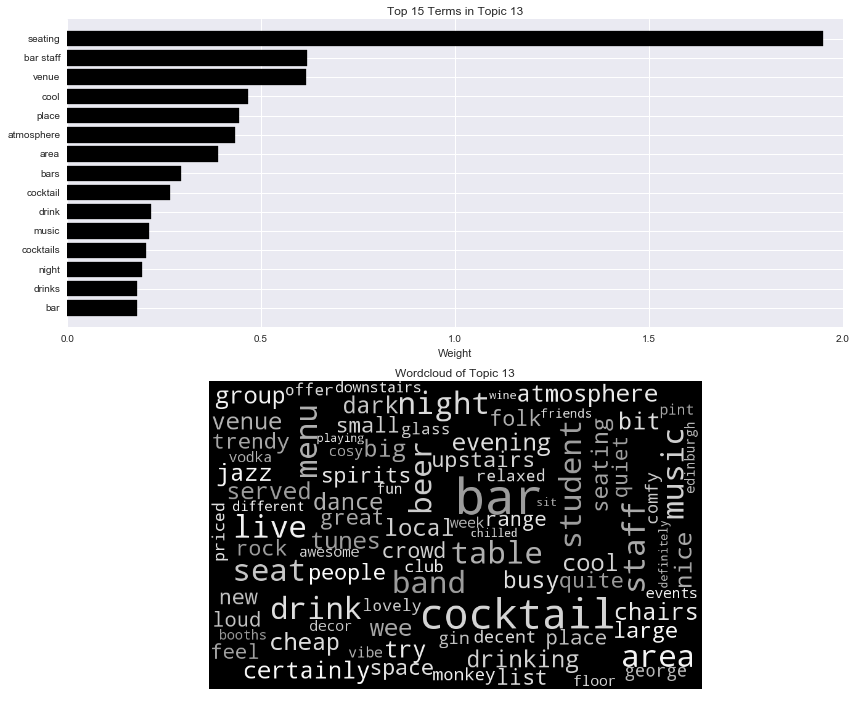


 Topic 14: 

pizza italian pizzas pasta toppings pizza express express la delivery crust cheese hut pizza hut favorita ham la favorita base gluten chain mamma free fresh gluten free pizza good dough restaurant quick parma ham pizza place family parma italian restaurant salad papa pepperoni good pizza papa john pizza pasta domino eat delicious italian food branch takeaway mozzarella ice cream pizza toppings rocket ingredients menu cream vittoria bases tomato ice olives order dishes service tasty like pizza pasta dishes offer half night available leith john authentic italian pastas options garlic nom spicy just better carbonara home italy got slices peppers salami fried pizza ordered pizza edinburgh oil greasy pasta pizza slice want pizzeria taste restaurants et pizza paradise happy friendly discount delicious italian


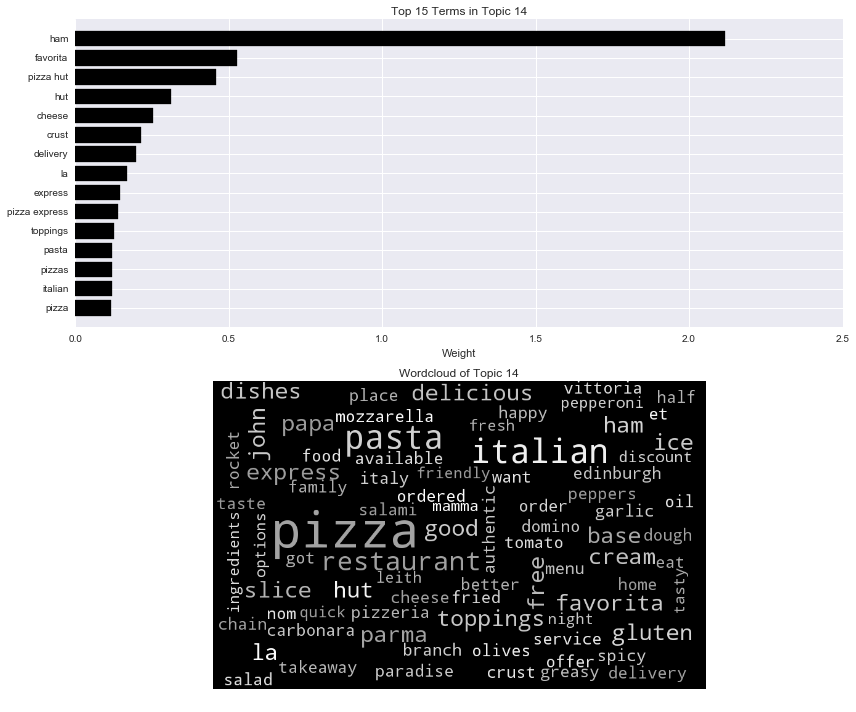


 Topic 15: 

street edinburgh city centre princes station princes street walk castle town bus train visit worth gardens city centre day beautiful shops george view shopping building area views old park waverley theatre best airport festival st main george street way time buses quite year rose restaurants leith right edinburgh castle new high rose street university scotland inside worth visit just hall hill train station cafe places bars located big buildings years venue space outside student tickets lot modern easy square end gallery old town bridge road location summer minutes ticket art house students plenty museum far long past history close cinema sunny new town scottish leith walk trip situated glasgow monument


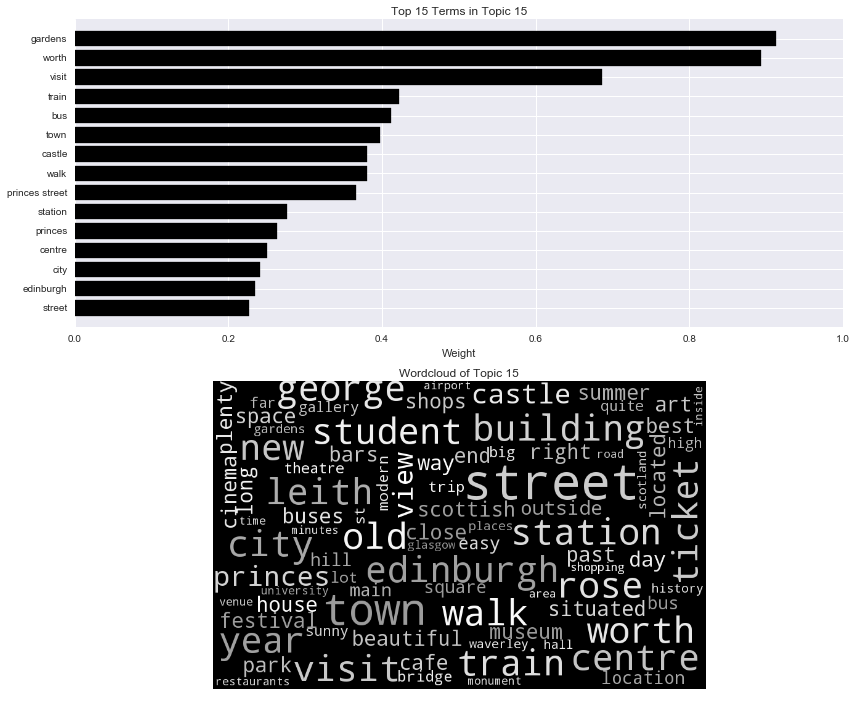


 Topic 16: 

pub beer beers ales old selection pint traditional pubs ale pub food tap friendly real local atmosphere traditional pub man old man staff drink man pub quiz locals range pints good pub nice real ales pub quiz grub scottish pub grub great pub real ale cask area spirits little pub cosy decent selection beers live pub good wee leith drinking beers tap edinburgh local pub warm proper cider pie decor guest lager seating food inside whisky quiet wee pub beer garden music beer selection crawl craft drinks pub great cozy tavern prices little tables proper pub tv regulars good selection tourists like garden pub edinburgh welcoming pub just dog pub crawl day rugby standard large wide available just boozer good beer afternoon students rose great beer


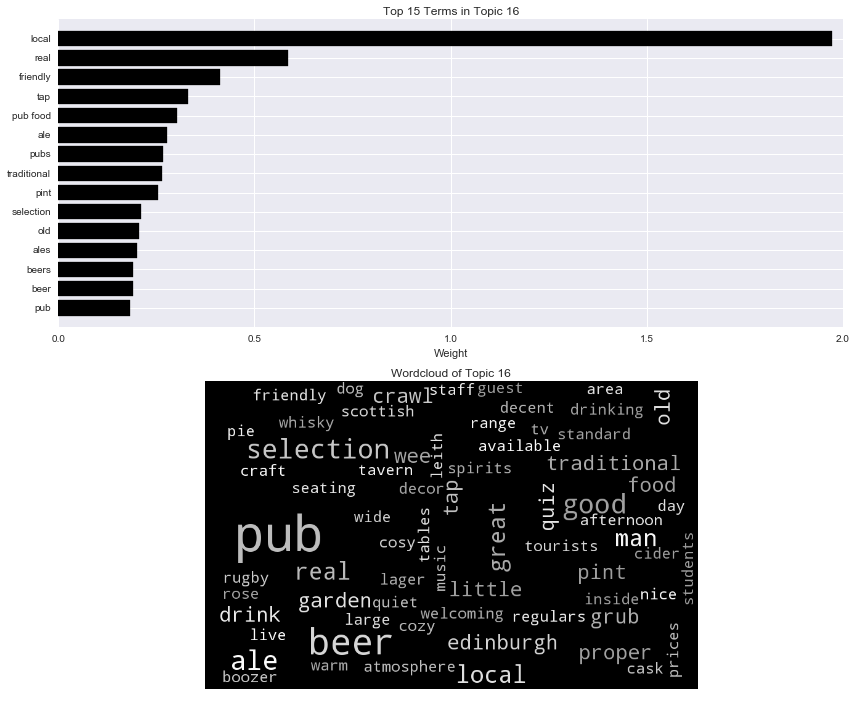


 Topic 17: 

hotel room rooms stay nice location staff bed helpful clean breakfast free comfortable friendly stayed bathroom wifi shower check floor desk modern free wifi spacious friendly helpful reception hostel lobby beds service edinburgh restaurant staff friendly located hotels staying walk didn old parking super price did great location definitely stay small building excellent view night minute double easy bath minutes want minute walk central friendly staff center close great hotel hilton large nice hotel included noise town extremely place stay fine book new gym helpful staff sleep use wi fi wi staff helpful short booked tv bus train fi internet pool station room service walking lounge early windows nearby nights airport window got car


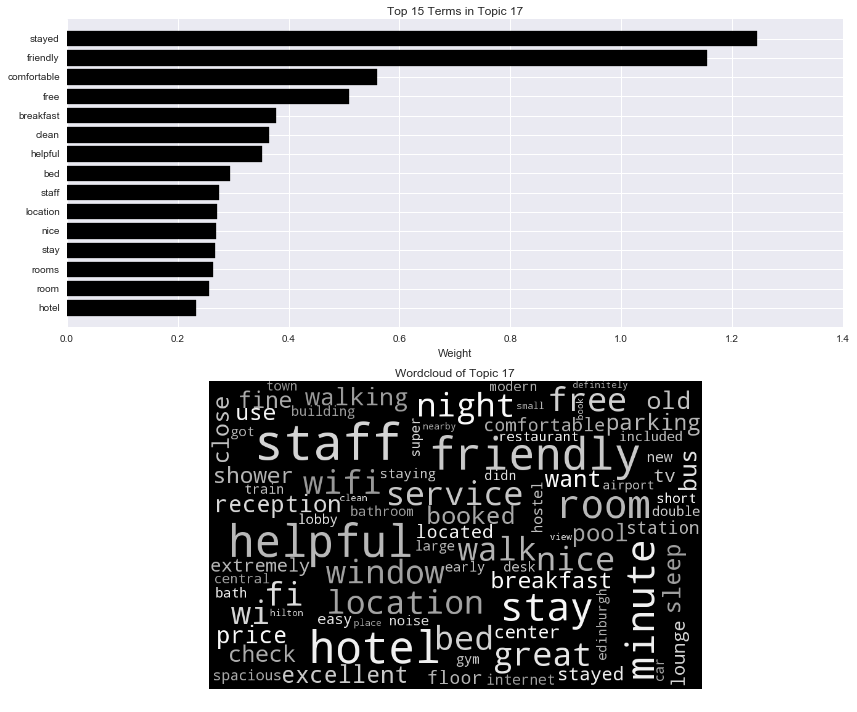


 Topic 18: 

lunch breakfast sandwich brunch soup eggs cafe fresh bread bacon tasty sandwiches toast salad day place menu cheese roll baked quick deli delicious fillings little spot lovely morning options potato soups rolls salads salmon haggis egg benedict eggs benedict time eat juice bite lunch time french veggie definitely baguette breakfast lunch filling scrambled panini cakes lunchtime area fruit excellent smoked perfect tomato wee friendly scottish breakfast wrap sausage pancakes poached healthy breakfasts bagel served stop ham today offer freshly french toast smoked salmon porridge sit looked counter baked potato ingredients just potatoes serve scottish homemade choice small weekend scrambled eggs caf wraps spoon black pudding paninis toasted breakfast menu local


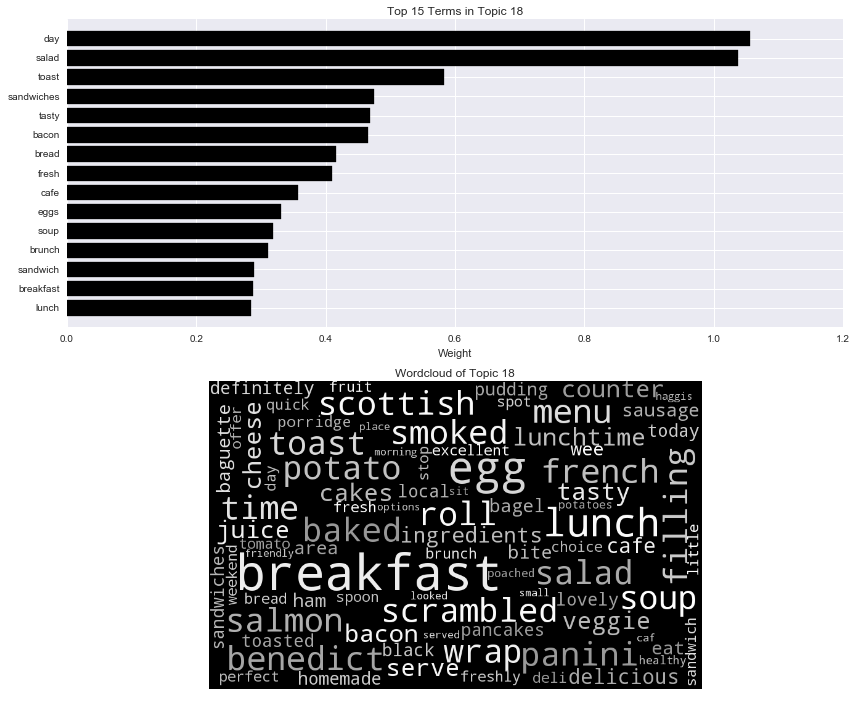


 Topic 19: 

good really nice really good pretty pretty good selection good selection staff good place place value good value good food food good good service overall friendly service good decent good quality place good prices really nice good range service money visit quite good value money busy quality nice place quite staff good good atmosphere friendly staff range bit price helpful good staff enjoyed good price said overall said good choice deal nice atmosphere choice staff really really enjoyed generally good good good little deals cheap bad atmosphere good atmosphere staff friendly location big happy reasonable good location good sign good time good prices think town offers drinks scotch good deal really friendly prices good lots good beer ok went recommend good music lunchtime nicely good wine overall good place really pricey good fun good bar especially beers friendly good good really ambience nice service good coffee fair liked


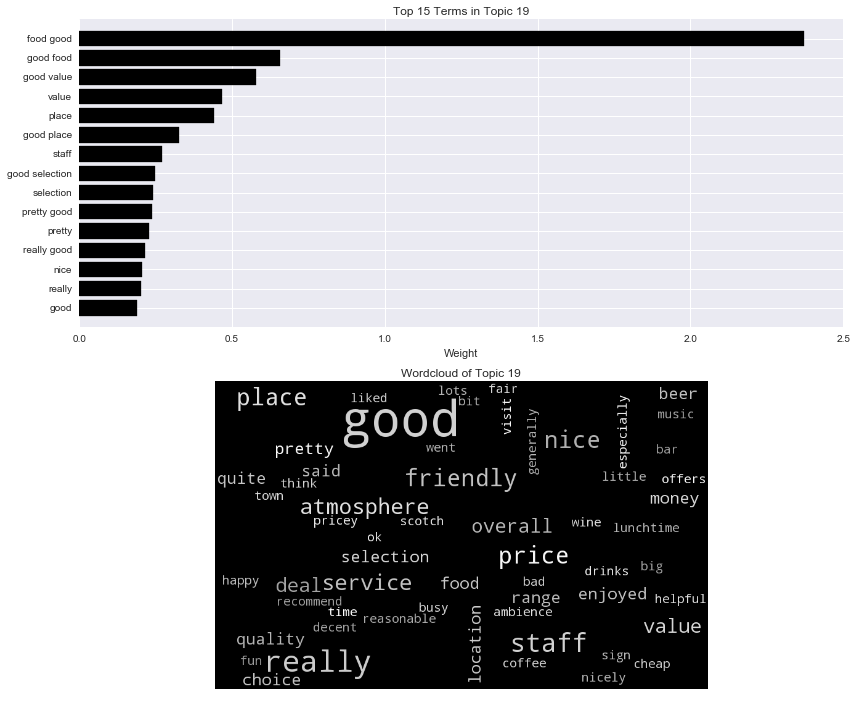


 Topic 20: 

sushi miso japanese soup sashimi miso soup tuna rolls edinburgh roll tempura maki best bento nigiri ramen japanese food bonsai rice yo order places salmon japan best sushi dishes box value yo sushi chef kanpai little california spicy sushi places say experience fish bento box fresh try seaweed better tried hay sushi edinburgh ve dragon spicy tuna price wasabi taste chinese set aubergine reviews definitely gyoza tasty restaurant eat good sushi money raw uk things lunch noodles restaurants dumplings town edamame way raw fish sake green tea sweet far belt eggplant soy hot tang eel good value tofu thing rainbow bowl japanese restaurant value money salad conveyor sauce platter vegetable bentoya seaweed salad craving avocado


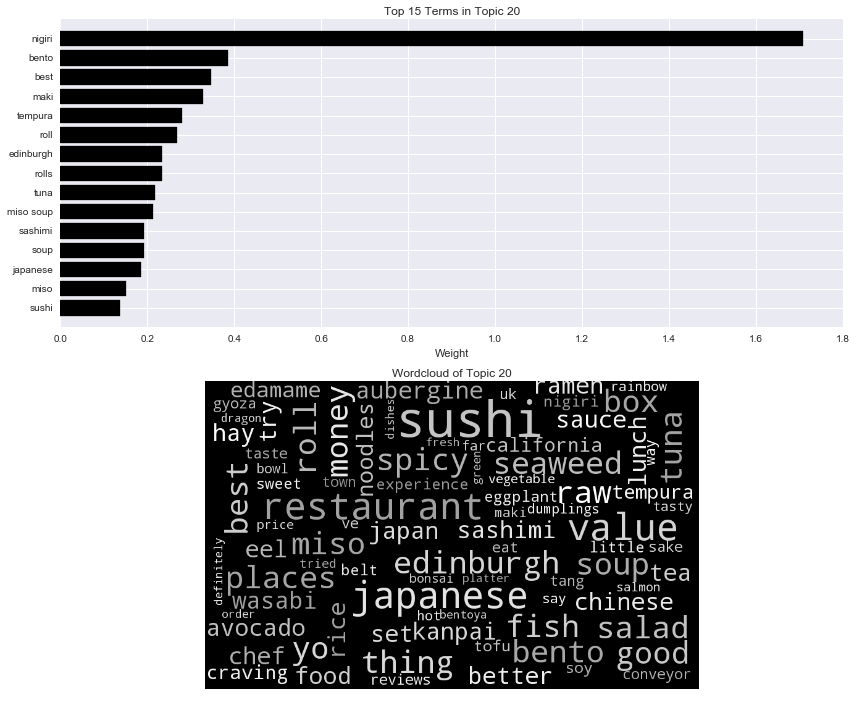

In [333]:
TopTermsByTopic(nmfmodel_4, features_4, 100)


 Topic 1: 

place really love like just don good people know bit come love place feel want going make time think ll little things thing say nice day way pretty sure cool got eat really good need friends quite awesome kind makes right look big said places actually feel like amazing different stuff yes ok brilliant fact oh try friend having work let sit getting lovely lot new did enjoy cheap walk didn went review doesn home away times bad stars place really love love does doing music thought don know hours really nice man usually great place really like coming looks long isn night fancy kids old definitely better year


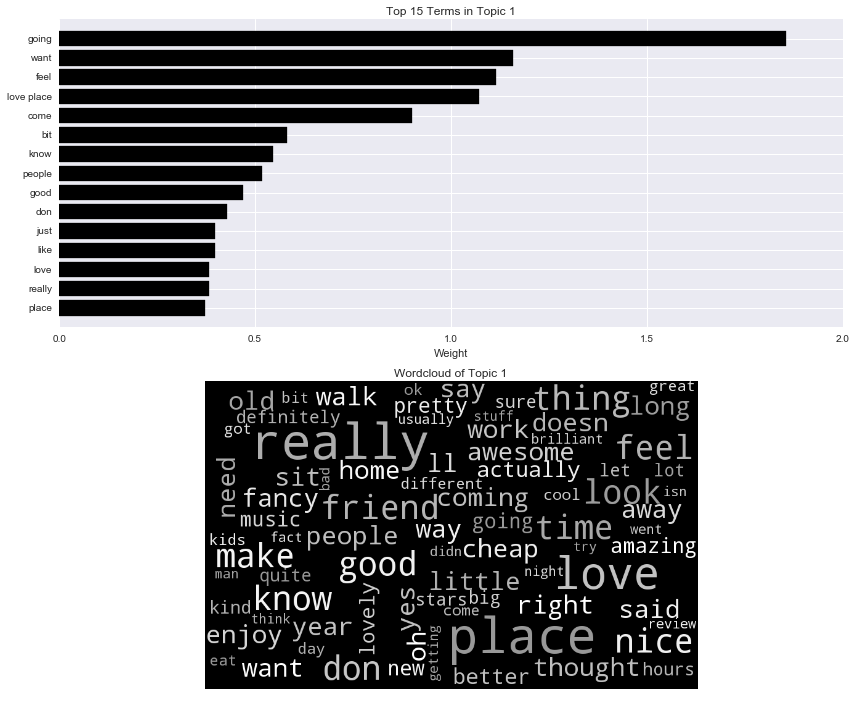


 Topic 2: 

shop store books range stock buy selection shops quality items little new gift looking charity prices clothes sell cards gifts stuff bought jewellery things vintage street like products buying bike need stores hand art shopping small just high christmas price book good browse old expensive different pretty sells cute clothing look beautiful selling offer section want know bookshop independent ll local spend huge help card charity shop love visit owner quite shoes second hand dress quirky helpful accessories unique games knowledgeable branch bags pick worth little shop gorgeous fiction bit prints dresses cool makes home window shelves reasonable cheap wee including shop edinburgh paper


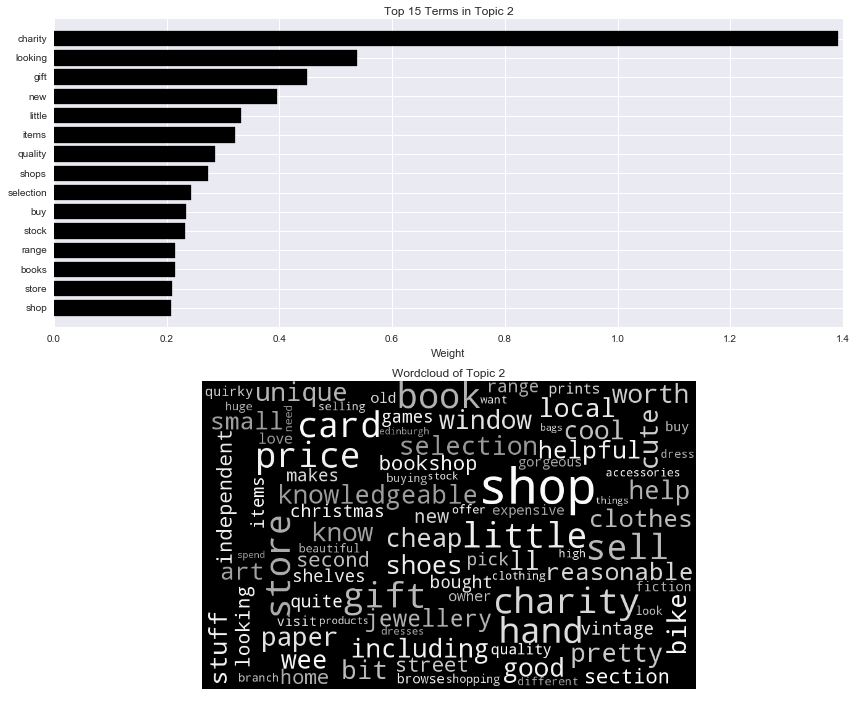


 Topic 3: 

great great food great service great place service food great service great place staff great lunch great selection place great fantastic great atmosphere great staff atmosphere selection great value value time fun great price really great great little atmosphere great great coffee spot food loved great location great time cafe price great great great experience lovely great pub whiskey great lunch meal great edinburgh great salmon location mussels pub drinks coffee great thanks great range great meal disappointed music great beer great spot seafood great fun great cocktails quick recommend music great especially great view sausages awesome students time great specials soup great night great friendly great job great really service lovely great whiskey relaxed great good great choice job lots fab view great people little place local definitely meal stuff friends prices great oysters fun great cosy beer great great wee great quality great variety delicious great restaurant g

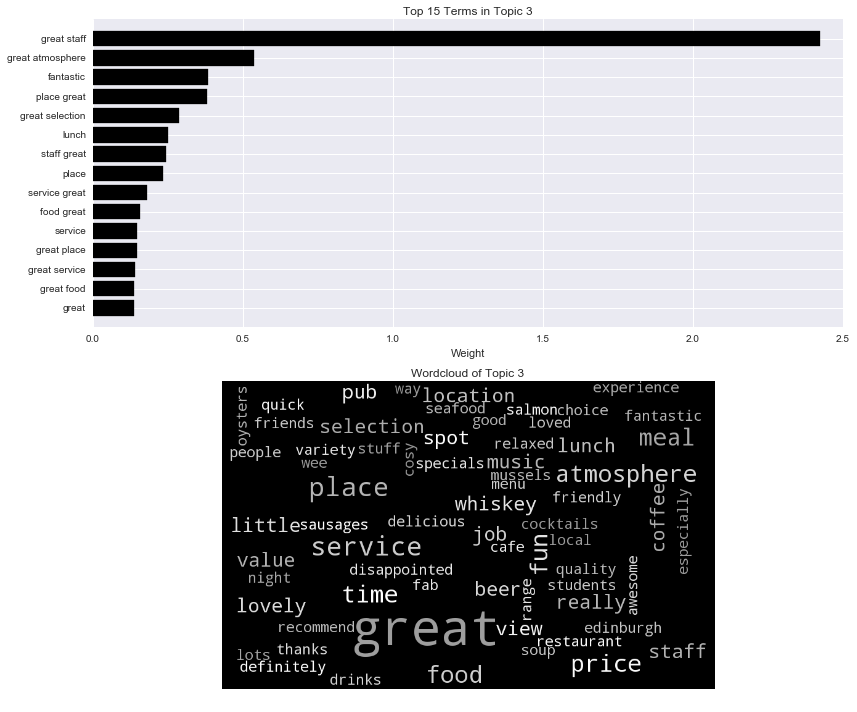


 Topic 4: 

staff friendly nice staff friendly friendly staff really helpful friendly helpful atmosphere super really friendly lovely staff really really nice super friendly clean welcoming tasty helpful staff staff great recommend selection staff nice knowledgeable cafe attentive staff super relaxed excellent busy happy free reasonable warm area food friendly environment favourite wifi friendly service enjoyed atmosphere friendly prices friendly atmosphere staff lovely nice staff good friendly attentive service friendly friendly welcoming polite choice professional staff helpful help lovely staff friendly food location delicious staff friendly really friendly knowledgeable priced vibe comfortable cosy chatty helpful friendly great friendly nice place wee ask nice atmosphere local friendly efficient staff good reasonably efficient really good welcome accommodating great staff nice selection prices reasonable pleasant warm friendly staff delicious good staff loved nice little quick inc

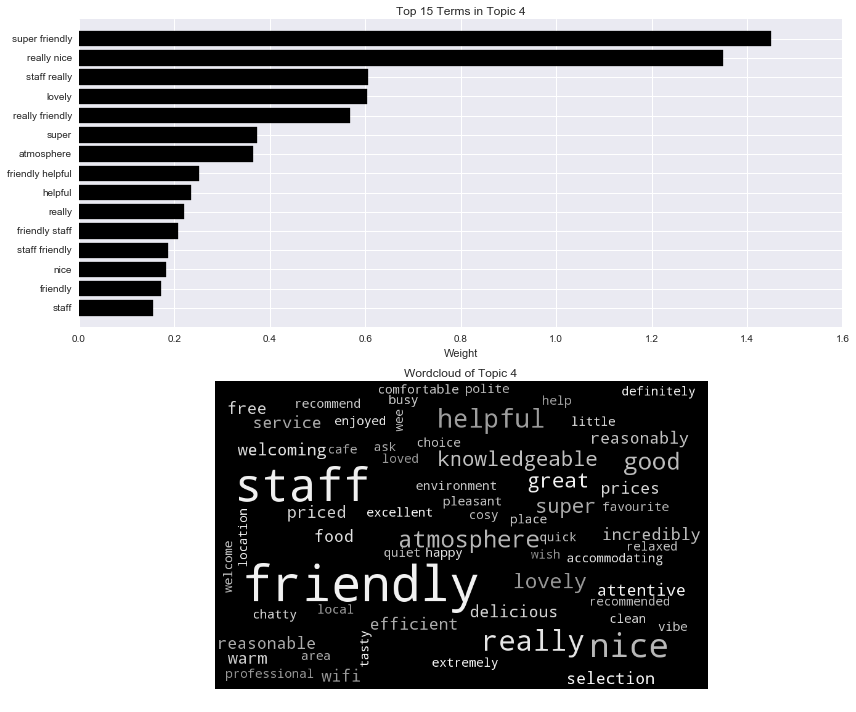


 Topic 5: 

und die der ist sehr das mit zu ich ein den es nicht man auch war f_r eine auf sind von sich hier nach wir zum dem essen gut im einer einen nur alles wieder etwas kann hat aber einem da als lecker immer stadt bei wirklich noch aus oder freundlich gibt dass gute einfach waren bedienung dann haben dort empfehlen besuch ab perfekt wie kleinen und die habe karte groe sollte mehr und das wenn super das essen und sehr _ber des werden burg personal empfehlung und eine und der absolut schon toll pizza viele direkt es gibt vor zu empfehlen mir man sich uhr wurde nett auf der


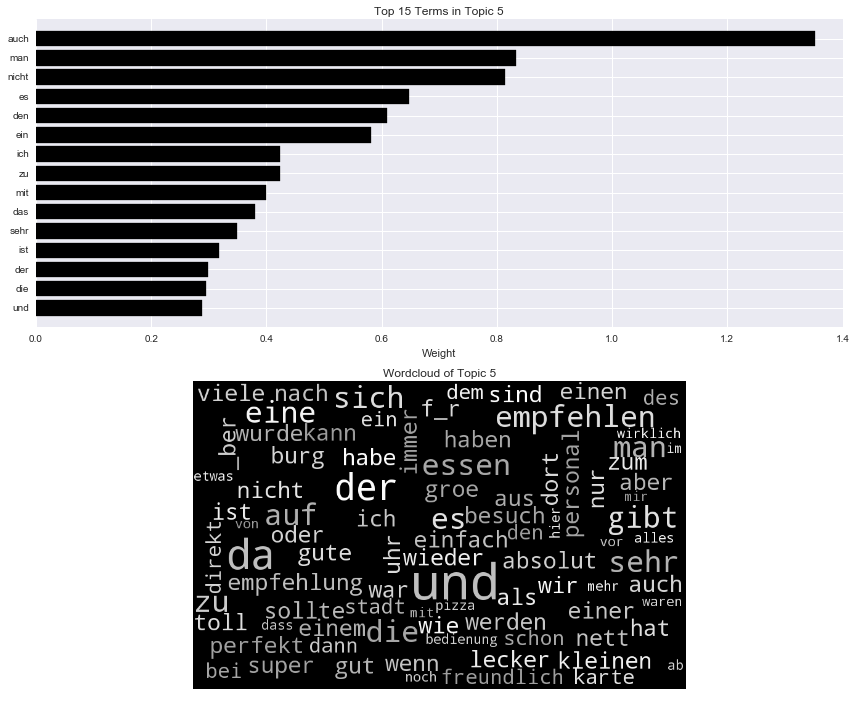


 Topic 6: 

castle edinburgh city mile royal street royal mile views walk view princes hill princes street beautiful visit history arthur edinburgh castle gardens museum arthur seat worth seat monument day old park walking shops tourist climb centre scotland right way scottish town calton holyrood building time end calton hill free hike tourists middle national old town gallery stunning people meadows palace area festival just architecture close bit st buildings scott wonderful city centre visiting worth visit away days art pubs sunny years street gardens little look year scott monument amazing stairs visit edinburgh enjoy stop summer th high path looking lot war view city cafe world located taking hours steep view castle views city minutes


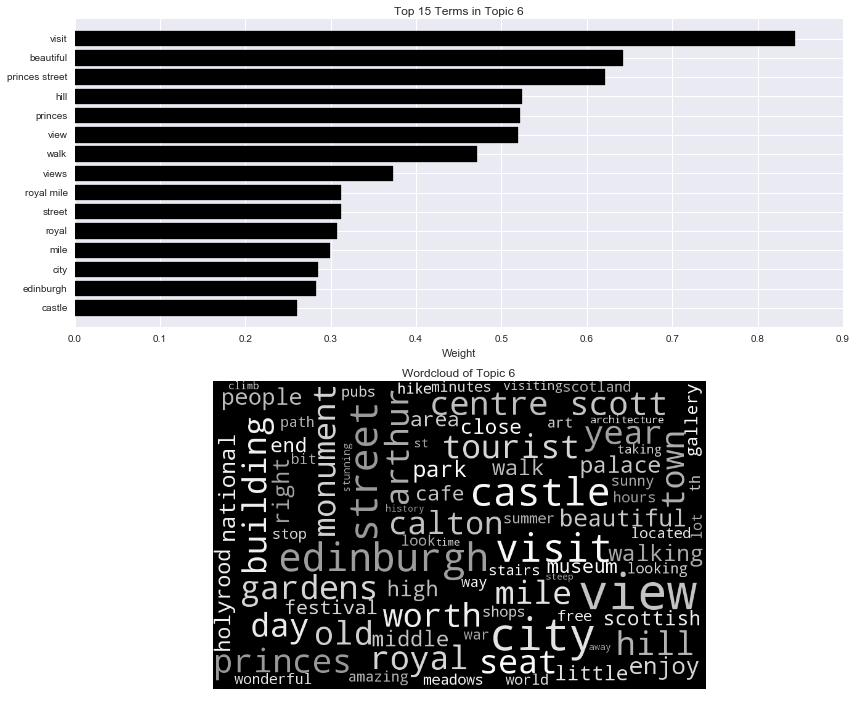


 Topic 7: 

tour guide history tour guide tours scotland recommend stories day trip did fun skye time highlands whisky highly free day tour loch bus group really went whiskey took interesting recommend tour highly recommend guides way ghost information funny informative underground scottish definitely mary entertaining enjoyed visit castle vaults awesome loved sandeman loch ness people fantastic historical got rabbie experience mary king museum king close second ness tasting close dead tour worth questions guided rabbies weather double dead tour edinburgh make story walking isle tour guides tour really isle skye knowledge edinburgh learn driver hours absolutely dead guided tour good booked knew amazing hour jamie king haunted tour free stops great tour kept tell company think job


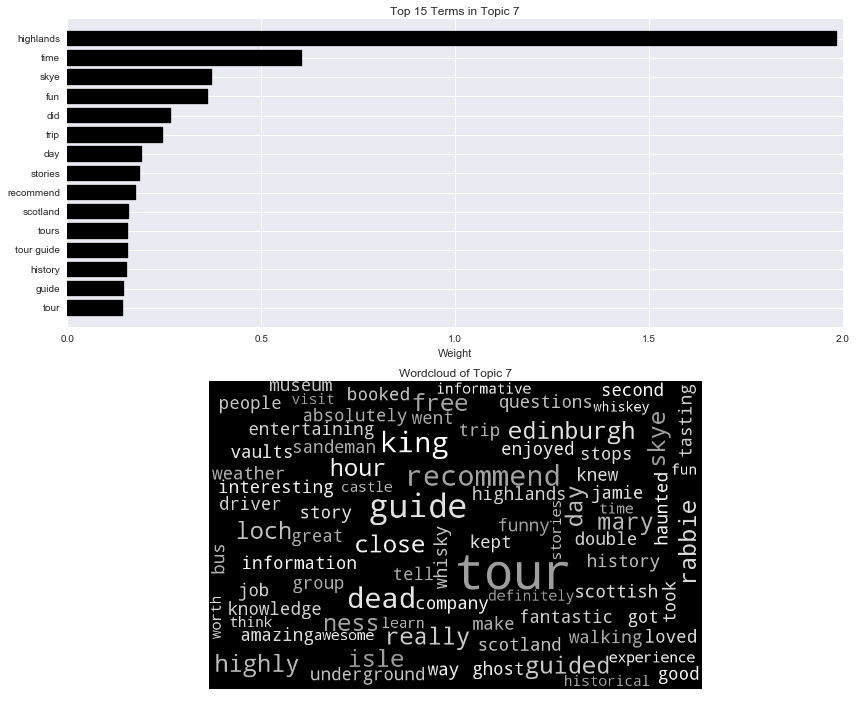


 Topic 8: 

chocolate tea cake hot cakes hot chocolate afternoon delicious chocolates lovely afternoon tea little cupcakes sweet teas white gluten scones cafe pot free macarons white chocolate gluten free amazing caramel try tried milk slice tree raspberry chocolate tree sandwiches flavours scone chocolat fudge dark cupcake coco rich truffles hotel chocolat cuckoo dark chocolate pastries just cup chocolate cake love treats served fruit gf drink sugar carrot fresh vanilla cups bakery light friend came jam oh sponge taste like patisserie sweets bruntsfield vegan wonderful sit cocoa bread cute lemon muffins heaven wait mini birthday carrot cake treat gorgeous flavour icing yummy choice day salted tart cinnamon wee macaron make salted caramel


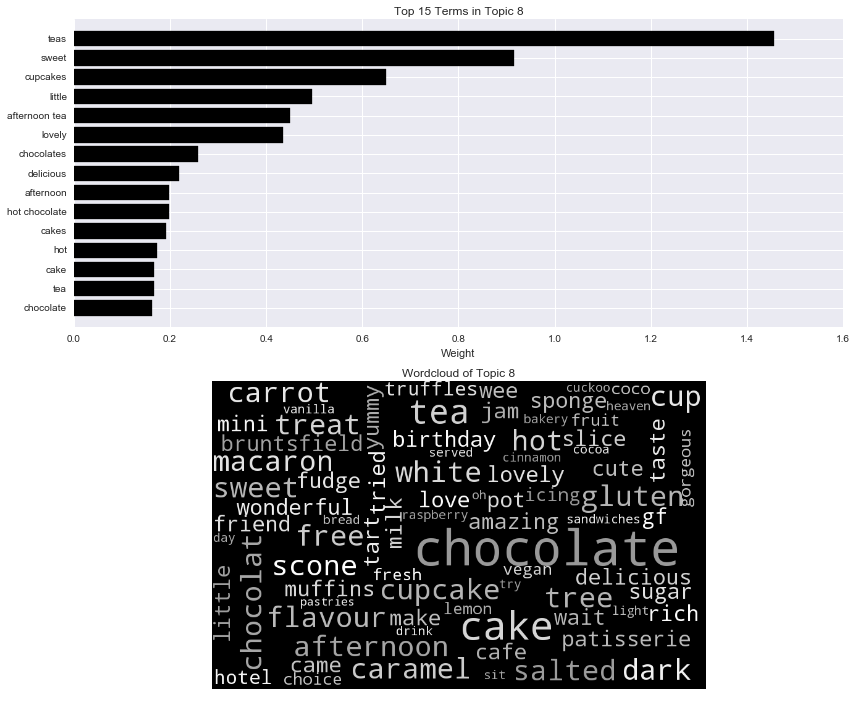


 Topic 9: 

restaurant menu meal wine main dinner course dishes cooked steak starter dessert dish table dining just courses french ordered served experience came perfectly lovely perfect delicious went evening pudding special italian mains starters night plate quite fantastic waiter salmon little didn chef list main course absolutely restaurants duck bottle meat mussels sauce time wonderful presented food red lamb visit small did seafood beautifully lunch glass start taste tasting enjoyed scallops pasta arrived definitely shared tender tapas star sushi wines tasty set wine list bit end try meals really attentive flavour having romantic birthday tables quality fine opted beef michelin decor sea light


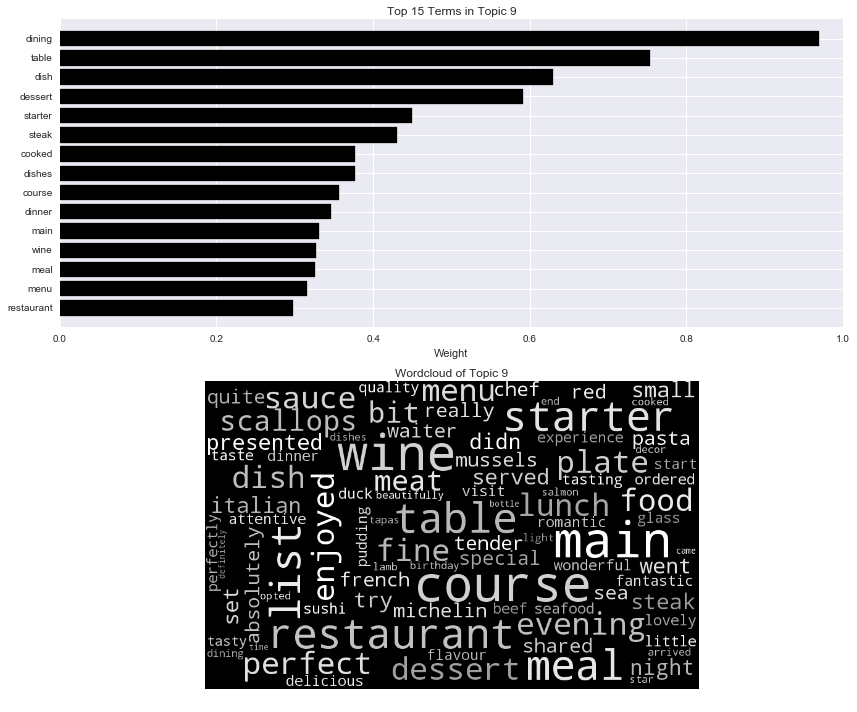


 Topic 10: 

bar pub beer beers night drinks music selection cocktails cocktail whisky drink good pubs atmosphere bars bar staff ales old gin live menu edinburgh local cool live music tap pint area venue burgers nights like whiskies fun ale real burger cosy jazz favourite evening selection beers decor pretty people pints list awesome crowd good selection new different spirits whiskey decent nice friends cocktail bar comfy vibe glass wine traditional drinking seats big quiz bartenders seating club tables brewdog scottish try space table quite excellent bottles bar edinburgh huge street downstairs great bar upstairs busy bartender range offer leith tasting looking monkey open craft inside definitely locals spot


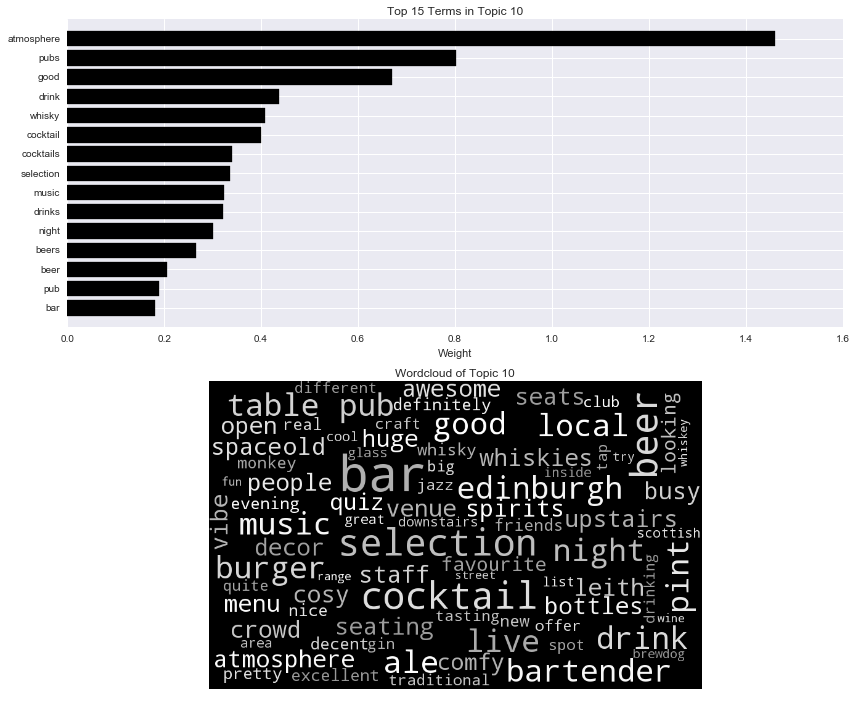


 Topic 11: 

coffee coffee shop flat roast flat white artisan artisan roast espresso cafe good coffee white beans great coffee brew best coffee cakes cup cappuccino breakfast good lab brew lab coffee edinburgh soup baristas coffee place coffee shops pastries little coffee great scones barista caffeine cup coffee sit delicious coffees bread perfect wifi place brunch shop toast starbucks delicious coffee love coffee french busy visit milk cake seating free favourite coffee morning sandwiches decor eggs make space black coffee excellent lunch bean excellent latte caf tables spot day coffee good excellent coffee passionate food coffee whites black medicine flat whites today area wellington free wifi art little coffee seats medicine fresh croissant small comfy home kilimanjaro drinking coffee cake new wee serve street lovely enjoy


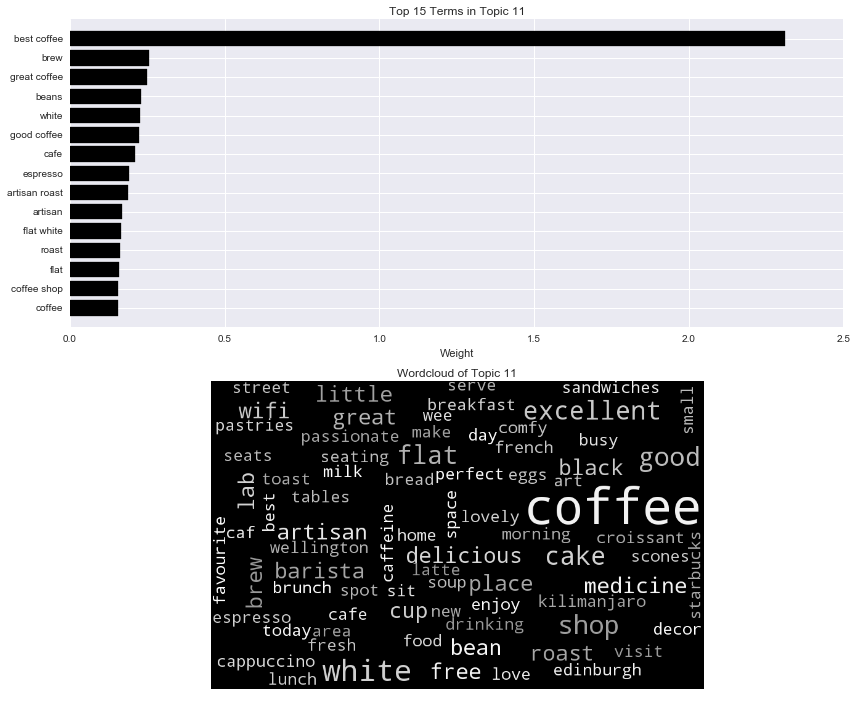


 Topic 12: 

fish chips fish chips best fish haddock pie fresh crispy chippy seafood tailend supper best sushi fried batter haggis good peas bene chips ve quality steak worth good fish portion mussels fish fish chip fish fresh tacos perfectly battered ordered suppers place bite tank fish supper don market pub fresh fish quality fish great fish vinegar fry chip shop mushy mushy peas past lunch deep smoked fishmongers fish suppers cod eddie getting cooked sauce clean salmon say scotland hot different sizes uk haddock chips soft fantastic home sea hake salad chips good huge delicious fish nice cooking chips delicious fish pie service good especially fish servers chips great time ordered deep fried man perfectly cooked came life light oysters worth getting shell chips really worth doing onion rings best quality


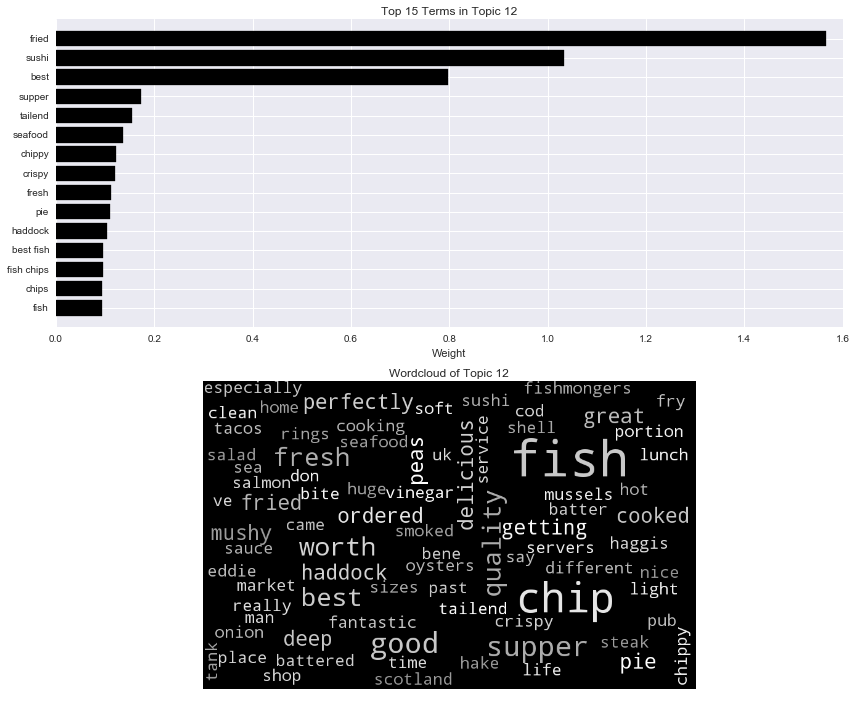


 Topic 13: 

chicken cheese lunch burger sauce pork delicious soup tasty fresh bread sandwich meat salad wings potato spicy haggis good roll burgers chilli rice order sweet ordered oink pizza sandwiches filling beef baked curry try eat fries options choose onion came got crispy bacon potatoes hot rolls veggie menu pulled tomato small pig day apple went free fillings pulled pork just pie perfect home yum fried breakfast portion chili wrap bbq cooked garlic half huge gluten sauces chicken wings definitely bun roasted big takeaway vegetarian sausage lamb bowl healthy oh burrito eating vegan time gluten free spot salads toppings tender stuffing choice like tried


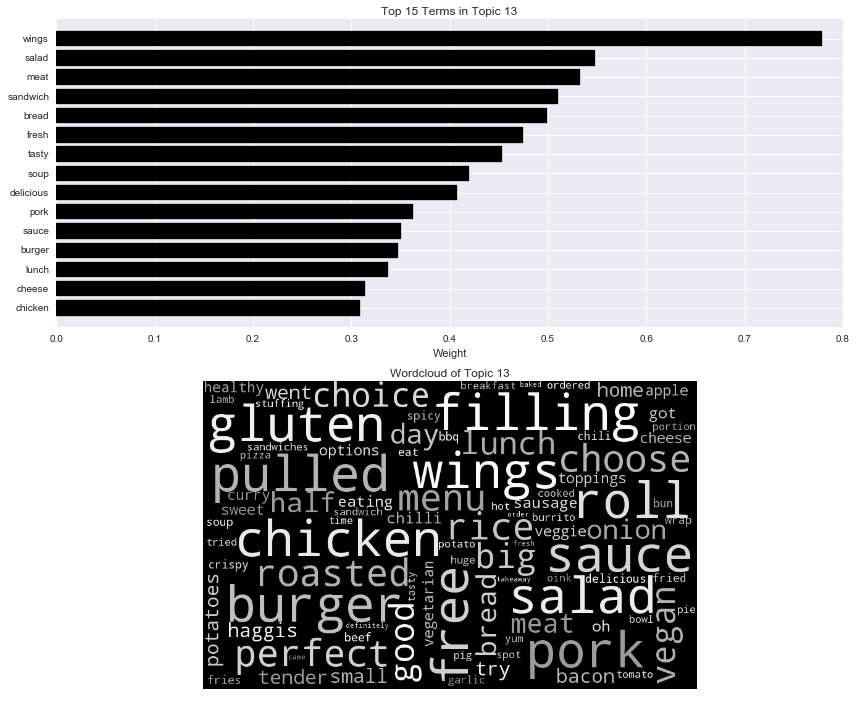


 Topic 14: 

que el la es en muy las para una por los lo se te pero como tu todo lugar este si edimburgo al ms porque del buena tiene ver lo que en el poco sitio nos ciudad estaba bien est ya son tienen precio as_ que as_ mucho uno gente mejor bastante sobre en edimburgo su tambin s_ all_ en la es que tan caf vista desde qu yo mi pizza grande da sin os local casa hay na dentro cartel um carne com dos salsa mexican gran haggis di el cartel sea ambiente em personal patatas favorita mal barantine la barantine je eu wifi par barman la favorita


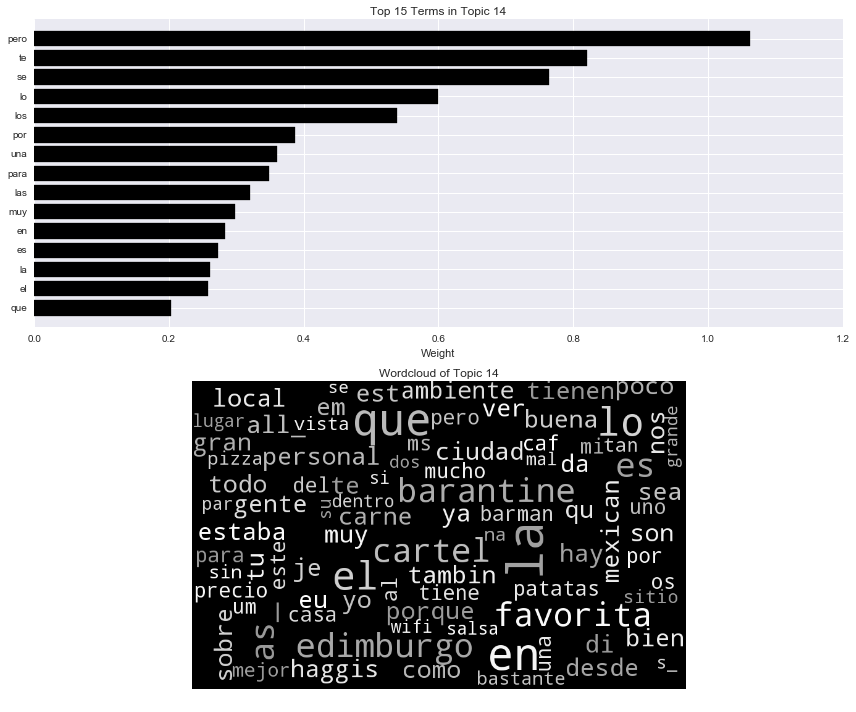


 Topic 15: 

hotel breakfast room stay rooms location stayed bed night clean bathroom comfortable beautiful modern helpful hotels service lovely town morning eggs floor great location shower day edinburgh tea staying scottish breakfast wonderful scottish train desk station gym suite highly bus nice bar walk pool concierge tv door staff missoni free fantastic large loved wifi bacon view recommend ve stayed buffet balmoral perfect bath spa area star excellent located toast right club spacious taxi old trip beautiful hotel experience time great hotel airport decorated included building stay hotel distance beds haggis price reception return did walking distance room service new town amenities way check days business away brunch hilton comfy


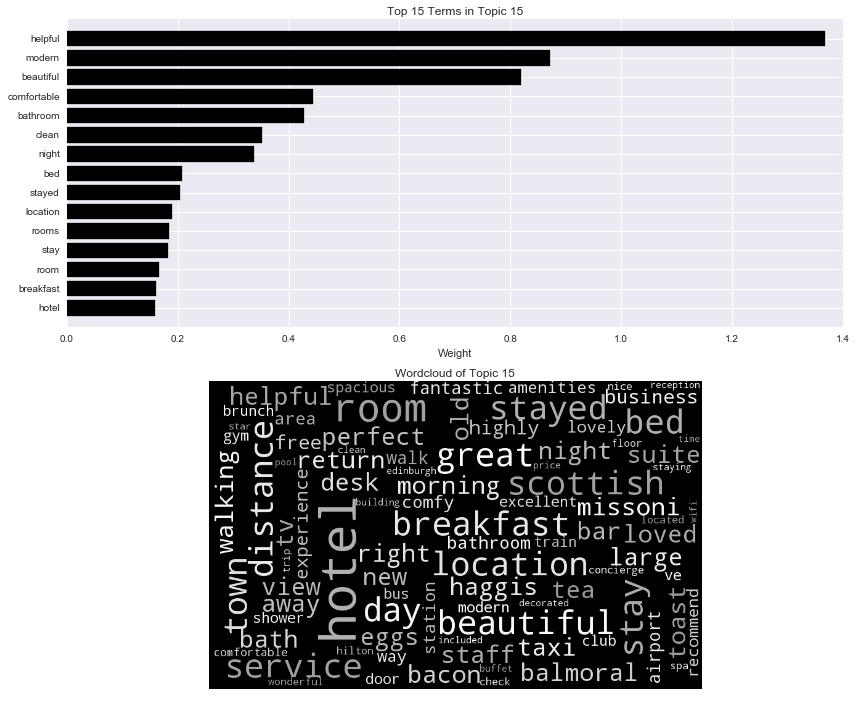


 Topic 16: 

et le les est la en pour une il trs sont dans vous pas qui avec au des je du nous mais sur tout vraiment bien cossaise ne fait ville qu ce se plus cette ai bonne ambiance prix endroit tait si peu par petit bon comme et les visite entre pour la est trs o_ sans que surtout dans la la ville vue pass magnifique avant lieu toutes plusieurs faut notre parfait mme temps grande car french si vous peut monde moules http moderne son ou mon pendant photo pub beau le monde bout barantine jazz faire frankenstein petite la barantine moi paris elle http www vie super


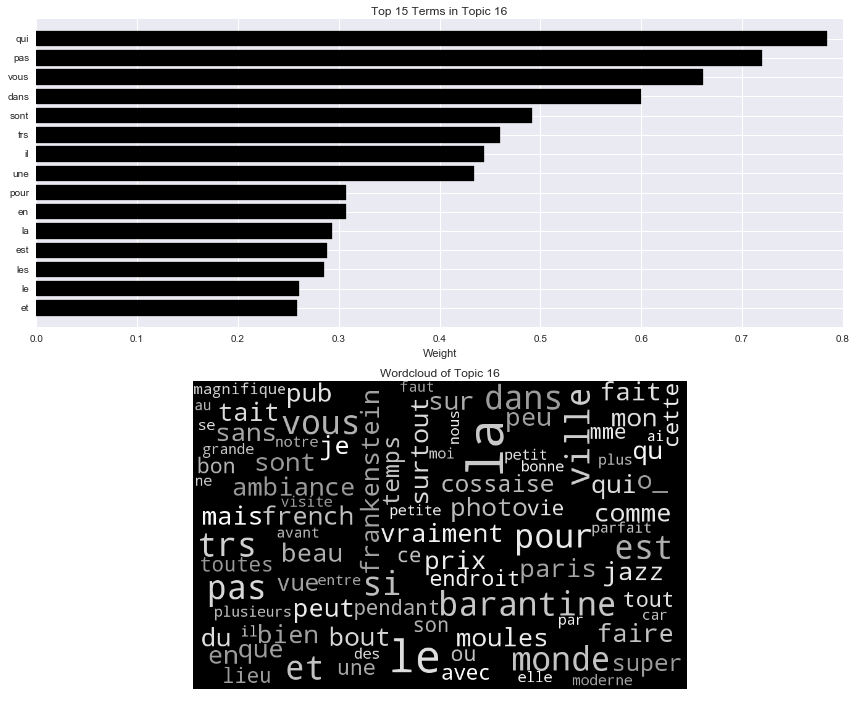


 Topic 17: 

best ve edinburgh times far thai indian best ve time years say eaten ve edinburgh favourite tried probably ve eaten ll ve tried scotland try restaurants seen probably best ve seen places food ve uk amazing curry restaurant think best indian don life restaurant edinburgh pies better best place edinburgh best ve got world fantastic town best thai visit seriously chinese make indian food quality twice worth year place edinburgh trip restaurant ve far best lot ve tasted pad time ve simply ve times bad got mexican wait miss definitely best coffee haven week long second food best times ve bars restaurants ve pad thai meal meals tasted won hands say best ve ve best thing book ago easily opinion takeaway thai food know place best different city used easily best


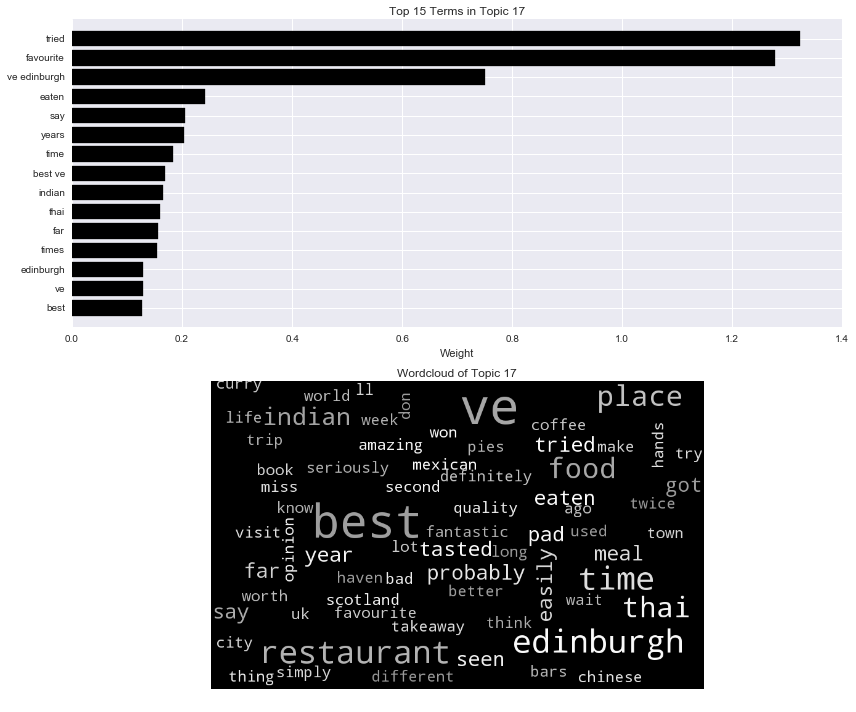


 Topic 18: 

hair cut salon time massage hairdresser colour went got hair cut came years head did appointment wanted medusa new getting going haircut ve gave style just look hairdressers blonde didn day amazing exactly long looking asked need good bit dry looked experience blow getting hair stylist lovely felt treatment job decided took professional customer having blow dry couldn work student left know feel vintage ladies short months tattoo washed head massage discount happy miss dixiebelle dixiebelle service sure ago hairdressing dean recommend feeling said salons later actually better night totally like cut hair want booked worth weeks couple cuts life able guy away fabulous compliments make


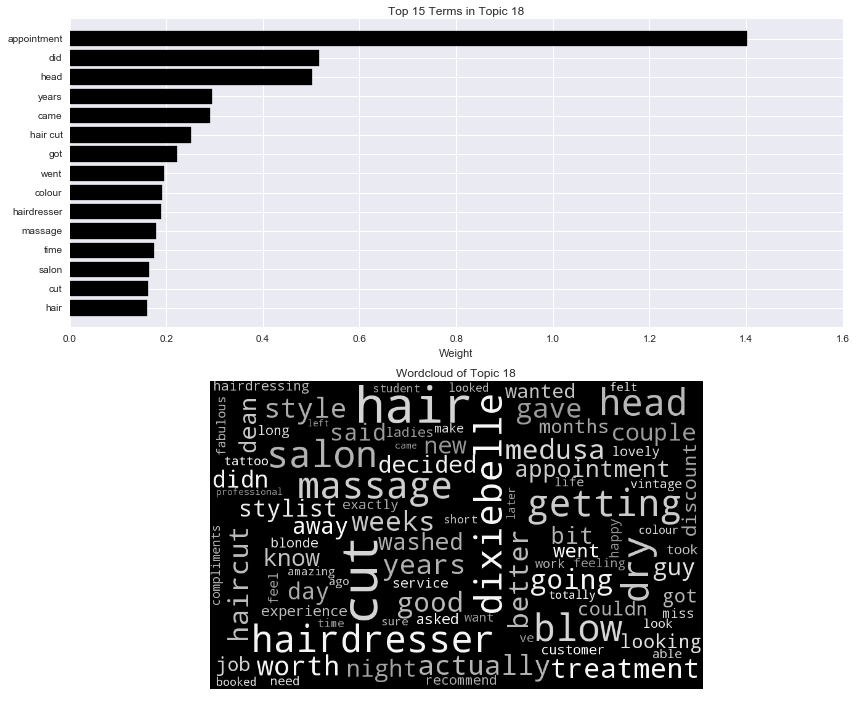


 Topic 19: 

food service good excellent delicious highly recommend indian good food amazing highly recommend food good prices food service excellent food quality great food delicious food recommended indian food atmosphere authentic food excellent food delicious reasonable highly recommended price place food amazing restaurant good service absolutely thai italian fresh quality food family food great eat definitely excellent service dishes service excellent curry value portions service good chinese decor attentive wonderful fast friendly service amazing food naan vegetarian recommend place spicy meal service friendly best indian ambiance outstanding good price quick food really worth gem priced chicken fantastic absolutely delicious food fresh mexican presentation reasonable prices friendly rice drinks food ve food edinburgh service great really good superb takeaway curries place food thai food service food turkish kitchen restaurants wife tried italian food return cozy chinese food c

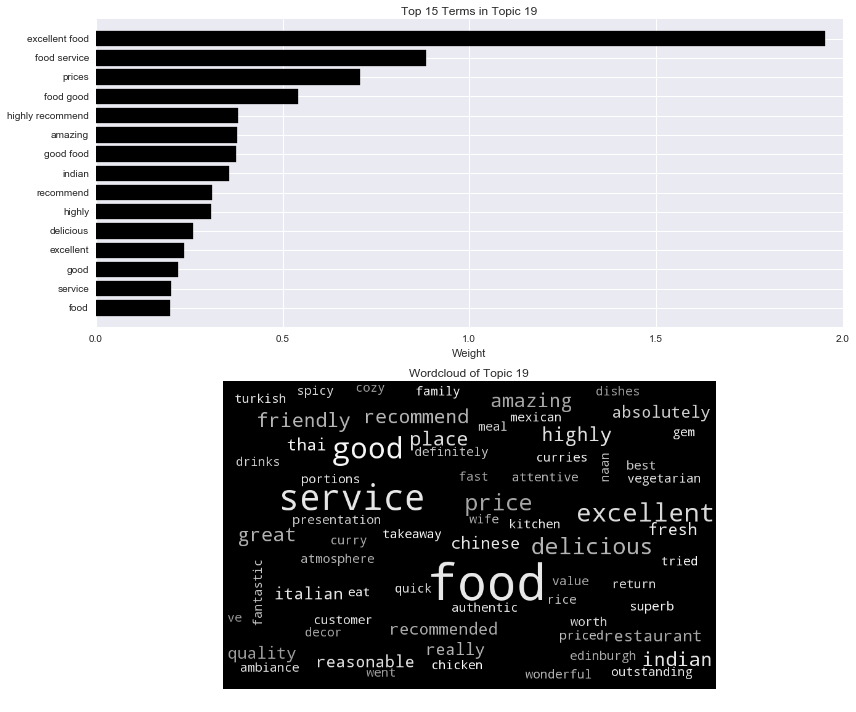


 Topic 20: 

ice cream ice cream flavours gelato best ice affogato sorbet dessert flavour cream ve vanilla mary amazing italian luca fudge scoop pudding good nice box sweet small toffee fresh farm scoops chocolate caramel day creamy flavor vanilla ice peanut butter sit perfect taste butter peanut homemade tub frozen salted caramel coconut sundaes delicious strawberry milk area upstairs pizza salted parlour ice creams cone warm flavors cold yum vittoria grassmarket nice warm creams banana pistachio different flavours away served different jelly sunny beats rhubarb love sell chocolate ice home definitely bit remember really line best nice ice little ice cold portion chip gorgeous loved unique irn bru let bru morningside sour irn treats fruit


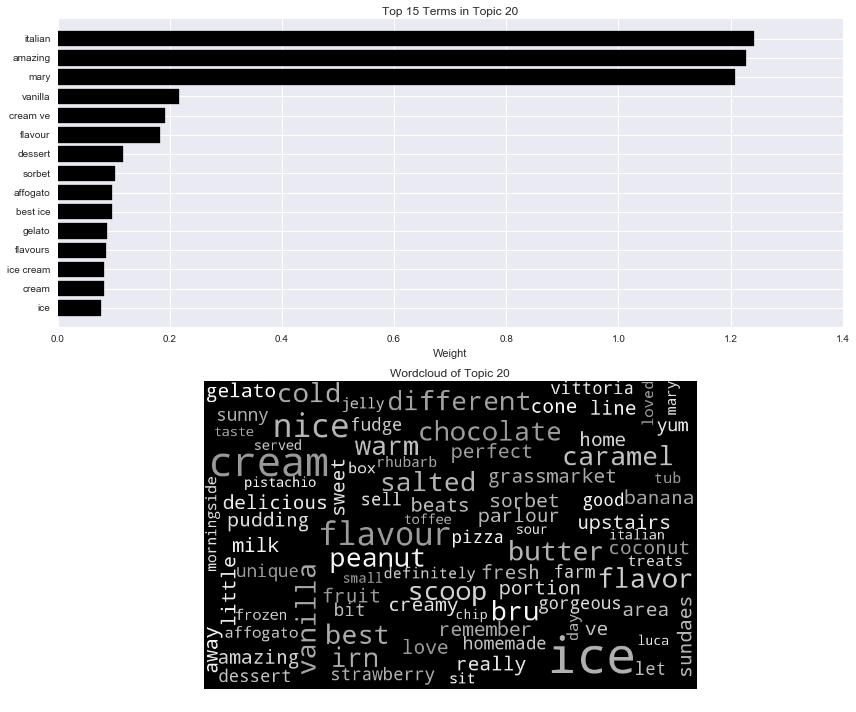

In [342]:
TopTermsByTopic(nmfmodel_5, features_5, 100)

amazing   roast dinner     i saw the doric listed in the times    hours in edinburgh and wanted to give it a try  we walked past and i noticed the   roast dinner being advertised so we made plans to do just that and i couldn't be happier     the bistro is upstairs and was quite quiet  but we did arrive as they were opening  at noon   the roast beef was cooked perfectly and the accompaniments were lovely  the staff were all also very friendly  kind and patient     it's on my list of places to recommend in edinburgh for sure 


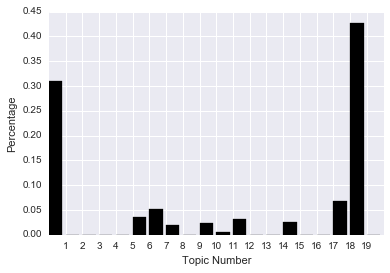

In [344]:
TopicDistribution(review,W_5,8)